# Time Series Forecasting Project: Sales Forecasting

Objective: Compile information and documentation recently collected about time series forecasting. Apply the knowlegde to a practical case.

Kaggle dataset used: [Sales dataset](https://www.kaggle.com/datasets/satya19/salesdata)

## Bibliography: 
- [1] [mlcourse.ai](https://www.kaggle.com/datasets/kashnitsky/mlcourse), Y. Kashnitsky.
[Time series chapter](https://www.kaggle.com/code/kashnitsky/topic-9-part-1-time-series-analysis-in-python/notebook)
- [2] Engineering Statistics Handbook, National Institute of Standards and Technology (NIST). [Introduction to Time Series Analysis](https://www.itl.nist.gov/div898/handbook/pmc/section4/pmc4.htm)
- [3] [Introduction to Time Series Forecasting with Python, Jason Brownlee](https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/).
- [4] [Rob Mulla Youtube Channel](https://www.youtube.com/@robmulla).
- [5] [Prophet](https://facebook.github.io/prophet/docs/quick_start.html#python-api)

## Table of Contents:
* [EDA and Statistics](#EDA):
    * [Histograms](#histograms)
    * [Box Plots](#box)
    * [Seasonality Plots](#seasonality)
* [Metrics Definition](#metrics)
* [Model Implementation](#model):
    * [Moving Average](#moving)
    * [Simple Exponential Smoothing](#simple)
    * [Second Exponential Smoothing](#second)
    * [Triple Exponential Smoothing](#triple)
    * [Smoothing Models Comparison](#smoothing_comparison)
    * [Dickey-Fuller Test](#dickey):
        * [Residuals](#residuals)
        * [Decomposition](#decomposition)
        * [Autocorrelation and partial Autocorrelation](#auto)
        * [Stationarity](#stationarity)
    * [SARIMA](#sarima)
    * [Machine Learning Models](#ml):
        * [Feature Extraction](#extraction):
            * [Lag Features](#lag):
                * [Linear Regression](#reg_lag)
                * [Lasso](#lasso_lag)
                * [Ridge](#ridge_lag)
                * [Random Forest](#random_forest_lag)
                * [XGBoost](#xgboost_lag)
            * [Date and Time Features](#date_time):
                * [Linear Regression](#reg_date)
                * [Lasso](#lasso_date)
                * [Ridge](#ridge_date)
                * [Random Forest](#random_forest_date)
                * [XGBoost](#xgboost_date)
            * [Target Encoding](#target):
                * [Linear Regression](#reg_target)
                * [Lasso](#lasso_target)
                * [Ridge](#ridge_target)
                * [Random Forest](#random_forest_target)
                * [XGBoost](#xgboost_target)
        * [Time Series Cross Validation](#cv1)
        * [Prophet](#prophet):
            * [Forecasting quality evolution](#quality)
            * [Box-Cox Transformation](#box-cox)
            * [Hyperparameters Tunning](#ht)
            * [Cross Validation](#cv2)
            * [Adding Holidays](#holidays)
            * [Residuals Analysis](#residuals_analysis)
    * [Models Comparison](#models_comparison)
    * [Out-of-Sample Forecast](#forecast)
    * [Saving the best Model](#saving_model)

## EDA and Statistics <a class="anchor" id="EDA"></a>

In [1]:
# Import libraries
import matplotlib.pyplot as plt   # plots
from matplotlib import pyplot
import matplotlib.dates as mdates
import matplotlib as mpl
import numpy as np                # vectors and matrices
import pandas as pd               # dataframes
from pandas import Grouper
from pandas.plotting import autocorrelation_plot
import seaborn as sns             # plots

import gzip, pickle

sns.set()

import warnings
warnings.filterwarnings("ignore") # 'do not disturb' mode

from itertools import product     # useful function

import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.formula.api as smf  # statistics and  econometrics
import statsmodels.tsa.api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from dateutil.relativedelta import relativedelta   # woorking with dates with style
from scipy.optimize import minimize  # for functions minimization
from tqdm.notebook import tqdm

from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing

from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LassoCV, ElasticNet, ElasticNetCV  # ML regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import ParameterGrid

import itertools  # Prophet staff
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.serialize import model_to_json, model_from_dict

import holidays  # US holidays for feature engineering

import plotly.graph_objs as go
from plotly import __version__ 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

import joblib

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Import dataset
sales = pd.read_csv("app/data/sales.csv", index_col="Date")
sales.head()

,Sales_Dollars,Quantity
Date,,
2009-10-01,338630,2160
2009-11-01,339386,785
2009-12-01,400264,2118
2010-01-01,314640,2544
2010-02-01,311022,1288


In [3]:
# Statistics
sales.describe()

,Sales_Dollars,Quantity
count,72.000000,72.000000
mean,401710.138889,2687.180556
std,39999.439045,1300.652884
min,311022.000000,601.000000
25%,374655.750000,1509.000000
50%,398296.500000,2634.000000
75%,432892.500000,3912.000000
max,501232.000000,4747.000000


In [4]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Index: 72 entries, 2009-10-01 to 2015-09-01
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Sales_Dollars  72 non-null     int64
 1   Quantity       72 non-null     int64
dtypes: int64(2)
memory usage: 1.7+ KB


In [5]:
# Counting Null values
sales.isna().sum()

Sales_Dollars    0
Quantity         0
dtype: int64

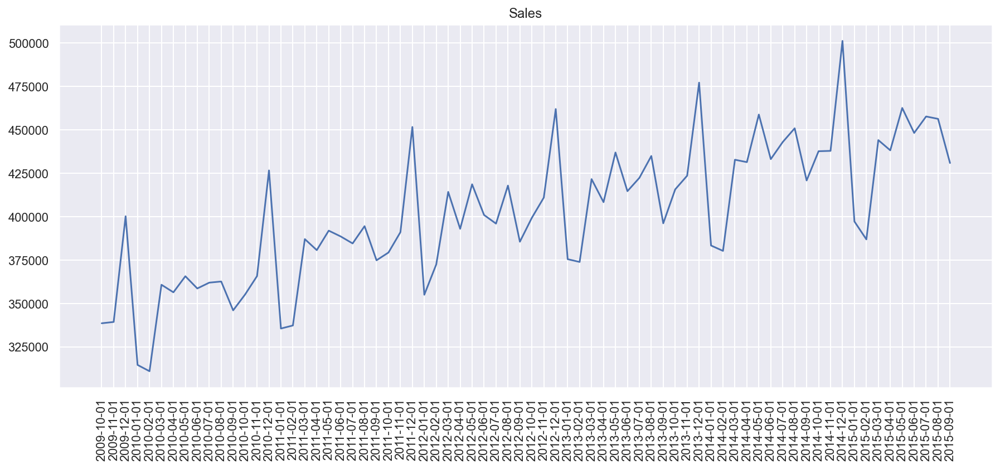

In [6]:
# Plot time series
plt.figure(figsize=(15, 6))
plt.plot(sales.Sales_Dollars)
plt.title("Sales")
plt.xticks(rotation = 90) # Rotates X-Axis Ticks 
plt.grid(True)
plt.show()

At first side, there is a trend and seasonality. The first thing we should do is understand in deep out time series.

## Statistics

Before to go throught the models, let us know more about the time series using statistics.

### Histograms <a class="anchor" id="histograms"></a>

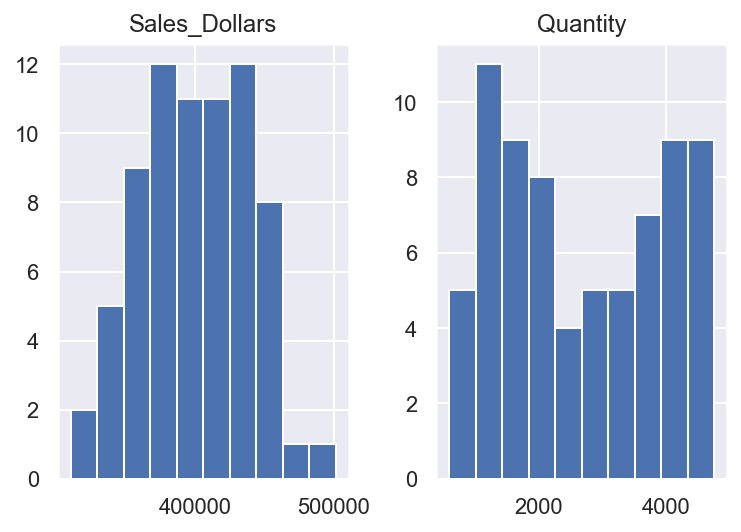

In [7]:
sales.hist()
pyplot.show()

<AxesSubplot:ylabel='Density'>

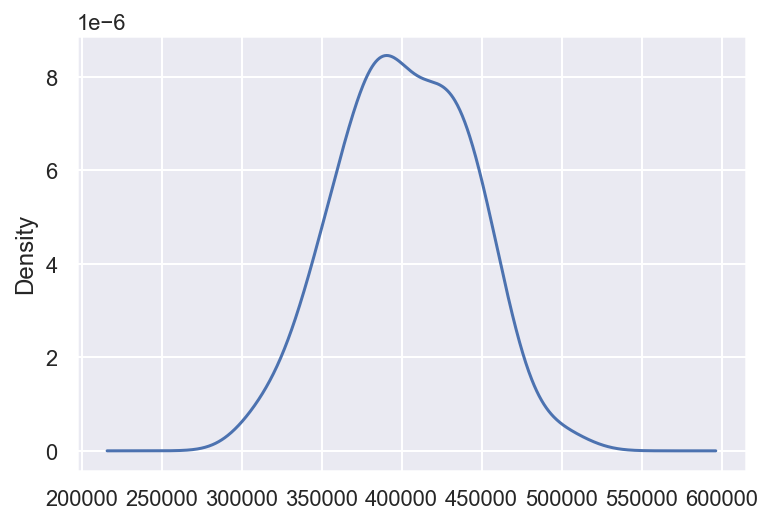

In [8]:
# Density plots
sales['Sales_Dollars'].plot(kind='kde')

<AxesSubplot:ylabel='Density'>

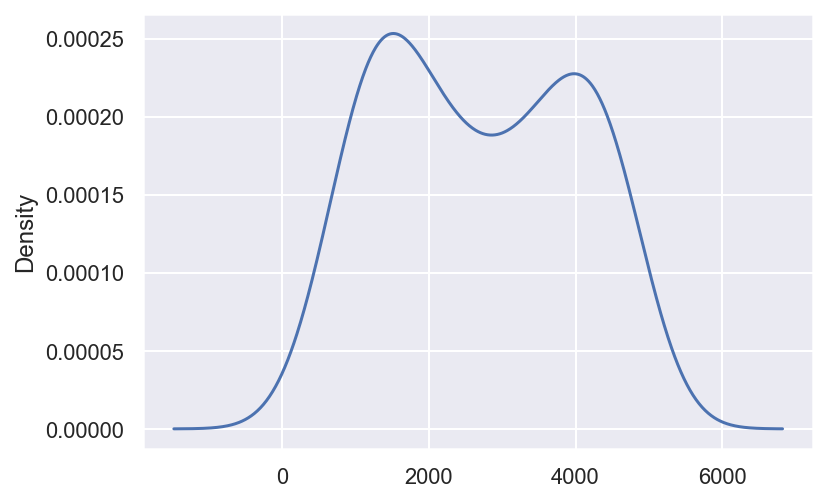

In [9]:
sales['Quantity'].plot(kind='kde')

### Box plots <a class="anchor" id="box"></a>

In [10]:
# Preprocesing data
df = sales.copy()
df.index = pd.to_datetime(df.index)  # convert Date to datetime format 
df.reset_index(inplace=True)
df.head()

# Prepare data
df['year'] = [d.year for d in df.Date]
df['month'] = [d.strftime('%b') for d in df.Date]
df['dayofweek'] = [d.strftime('%w') for d in df.Date]   # %a - abbreviated weekday name
                                                        # %A - full weekday name
                                                        # %w - weekday as a decimal number strating from 0 (Monday)

years = df['year'].unique()

In [11]:
df

,Date,Sales_Dollars,Quantity,year,month,dayofweek
0,2009-10-01,338630,2160,2009,Oct,4
1,2009-11-01,339386,785,2009,Nov,0
2,2009-12-01,400264,2118,2009,Dec,2
3,2010-01-01,314640,2544,2010,Jan,5
4,2010-02-01,311022,1288,2010,Feb,1
...,...,...,...,...,...,...
67,2015-05-01,462615,4140,2015,May,5
68,2015-06-01,448229,1135,2015,Jun,1
69,2015-07-01,457710,690,2015,Jul,3
70,2015-08-01,456340,1630,2015,Aug,6


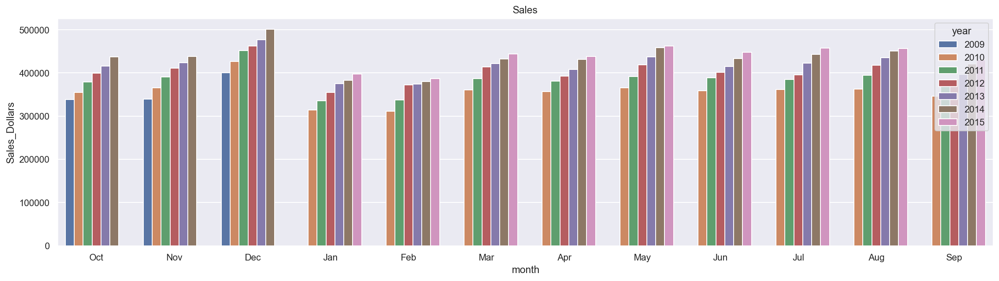

In [12]:
# Month comparison by years

fig, ax = plt.subplots(figsize=(20,5))
sns.barplot(x = "month",
            y = "Sales_Dollars",
            hue='year',
            data=df)
plt.title("Sales")
plt.show()

Text(0.5, 1.0, 'Yearly Trend')

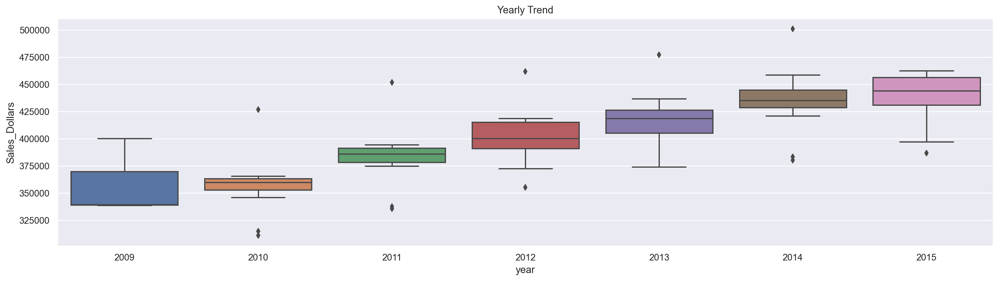

In [13]:
# Yearly boxplot

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(x = df.year,
           y = df.Sales_Dollars,
           ax = ax)
plt.title("Yearly Trend")

We can identify the trend over the years.

Text(0.5, 1.0, 'Seasonality')

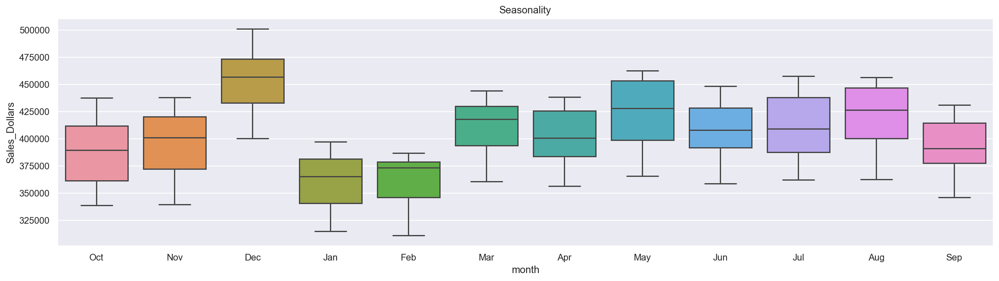

In [14]:
# Monthly boxplot

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(x = df.month,
           y = df.Sales_Dollars,
           ax = ax)
plt.title("Seasonality")

We can identify as well ther seasonality. There is a pick of sales in December..

Text(0.5, 1.0, 'Weekley Seasonality')

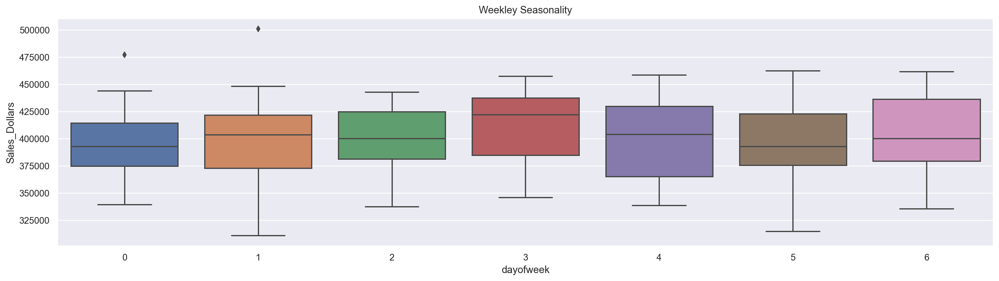

In [15]:
# Day of the week boxplot

fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(x = df.dayofweek.sort_values(),
           y = df.Sales_Dollars,
           ax = ax)
plt.title("Weekley Seasonality")

### Seasonality plot <a class="anchor" id="seasonality"></a>

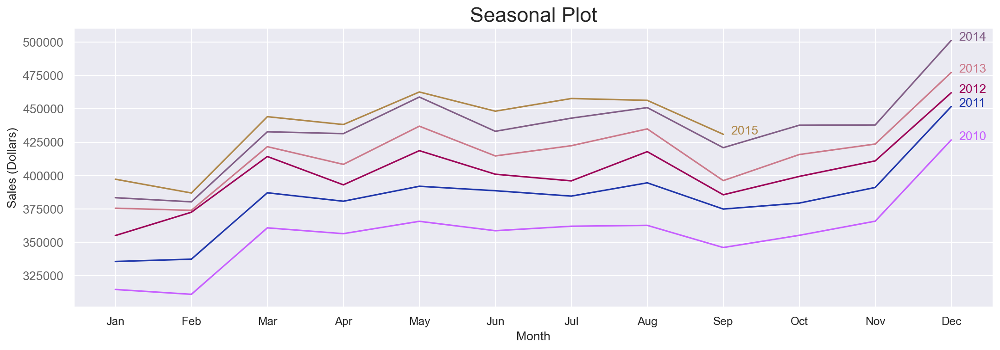

In [16]:
# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot
plt.figure(figsize=(16,5), dpi= 80)

for i, y in enumerate(years):
    if i > 0: 
        plt.plot('month', 'Sales_Dollars', data=df.loc[df.year==y, :], color=mycolors[i], label=y)
        plt.text(df.loc[df.year==y, :].shape[0]-.9, df.loc[df.year==y, 'Sales_Dollars'][-1:].values[0], 
                 y, fontsize=12, color=mycolors[i])
        
# Decoration
plt.yticks(fontsize=12, alpha=.7)
plt.title("Seasonal Plot", fontsize=20)
plt.xlabel("Month")
plt.ylabel("Sales (Dollars)")
plt.show()

In [17]:
# Figure6: Sales vs Time

import plotly.express as px

fig6 = px.line(df,
               x='month',
               y='Sales_Dollars',
               color='year',
               title='Seasonality - Monthly Sales',
               labels={
                   'Sales_Dollars': 'Sales ($)',
                   'month': 'Month',
                   'year':'Year'
                      },
               )

fig6.update_layout(xaxis_tickangle=0,
                   hovermode='closest',
                   title_x=0.5)  # center the title

fig6.update_xaxes(showline=True,
                  linewidth=0,
                  showgrid=True,
                  gridwidth=0.5)

fig6.update_yaxes(showline=True,
                  linewidth=0,
                  showgrid=True,
                  gridwidth=0.5)

## Metrics Definition <a class="anchor" id="metrics"></a>

The main metric used in time series is the Mean Squared Error (MSE). The  mean is the estimator that minimize the MSE, but this is only useful in time series without trend. When the trend is present, we should find out the proper estimator to minimize the MSE.

There are other interesting metrics like Mean Absolute Error (MAE), the Mean Squared Logarithm Error (MESE) and Median Absolute Error(MAE).

In [18]:
# Importing metrics
from sklearn.metrics import (mean_absolute_error,
                            mean_squared_error,
                            mean_squared_log_error,
                            median_absolute_error,
                            r2_score)

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs(y_true - y_pred) / y_true) * 100

Let us use first different smoothing techniques to reduce the effect due to random variation and reveal more clearly the underlying trend, seasonal and cyclic components of our time series.

## Model Implementation  <a class="anchor" id="model"></a>

### Model 1: Moving Average (MA) <a class="anchor" id="moving"></a>

Here the blog built by Y. Kashnitsky on his [mlcourse.ai](https://www.kaggle.com/datasets/kashnitsky/mlcourse) is specially interesting. He shows step by step how the smoothing techniques are applied from the formulas. This is an example:

In [19]:
def moving_average(series, n):
    """
       Calculate average of the last n observations
    """
    return np.average(series[-n:])

moving_average(sales, 2)  # prediction for the last observed two months

222419.0

Let us smooth the series to identify trend and seasonality.

In [20]:
def plotMovingAverage(
    series, window, plot_intervals=False, scale=1.96, plot_anomalies=False
):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 

    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15, 5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")

        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)

    plt.plot(series[window:], label="Actual values")
    plt.xticks(rotation=90)
    plt.legend(loc="upper left")
    plt.grid(True)

In [21]:
# Remove Quatity column
sales = sales.drop(columns="Quantity")
sales.head()

,Sales_Dollars
Date,
2009-10-01,338630
2009-11-01,339386
2009-12-01,400264
2010-01-01,314640
2010-02-01,311022


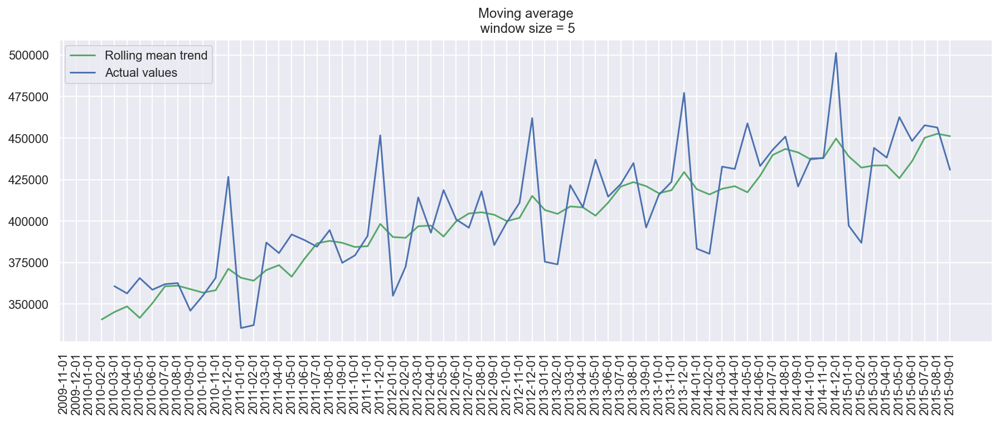

In [22]:
plotMovingAverage(sales, 5)

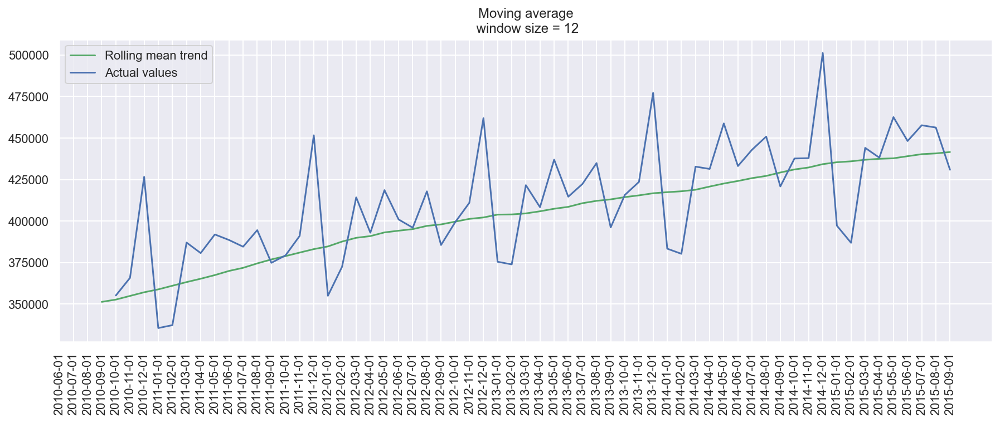

In [23]:
plotMovingAverage(sales, 12)

We have identified the yearly trend.

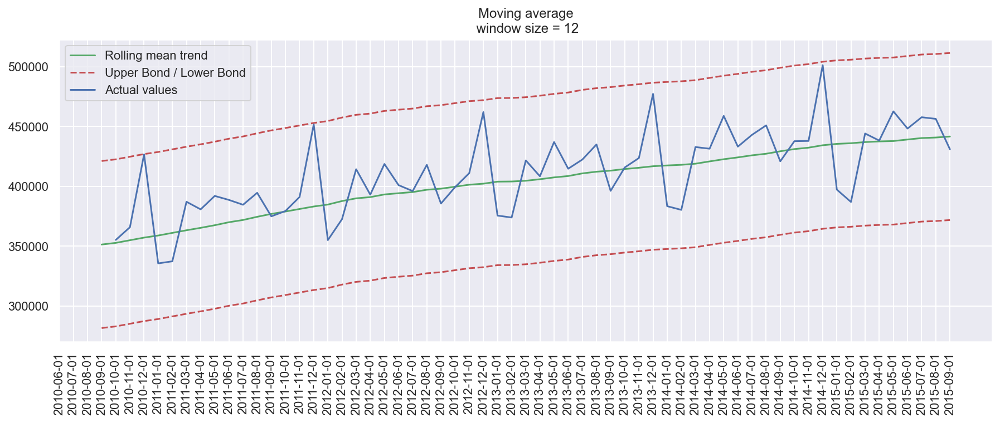

In [24]:
plotMovingAverage(sales, 12, plot_intervals=True, plot_anomalies=True)

A variant of Moving Average is the weighted average, a simple modification considering large weights for recent observation rather than the oldest ones. The total sum of weights is 1.

In [25]:
def weighted_average(series, weights):
    """
       Calculate weighted average on the series.
        Assuming weights are sorted in descending order
        (larger weights are assigned to more recent observations).
    """
    result = 0.0
    for n in range(len(weights)):
        result += series.iloc[-n - 1] * weights[n]
    return float(result)

In [26]:
weighted_average(sales, [0.6, 0.3, 0.1])

441223.19999999995

In [27]:
# just checking
0.6 * sales.iloc[-1] + 0.3 * sales.iloc[-2] + 0.1 * sales.iloc[-3]

Sales_Dollars    441223.2
dtype: float64

### Model 2: Simple Exponential Smoothing <a class="anchor" id="simple"></a>

For that particular model [1], we apply the same principle as in weighted average model: we give more importance to the recent observations than the old ones, weigthening them with the following formula:
        
        
$$\hat{y}_{t} = \alpha \cdot y_t + (1-\alpha) \cdot \hat y_{t-1} $$

where $\alpha$ is called a smoothing factor and defines how quickly is reduced the last observation. The smaller $\alpha$ is, the more influence the previous observations have and the smoother the series is.

For simplicity, I will implement the Simple Exponential Smoothing from statsmodels, because the model directly give us the value of $\alpha$ that minimizes the MSE.

In [28]:
# Simple way

simple = SimpleExpSmoothing(sales).fit()
# Prediction done for the next 3 months
pred = simple.forecast(3).rename('Sales_Dollars'%simple.model.params['smoothing_level']) 

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/holtwinters/model.py:922: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [29]:
simple.model.params

{'smoothing_level': 0.1891860465116279,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 338630.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In that particular case, the smoothing factor selected by statmodels is 0.19.

In [30]:
# Forecast
pred = pd.DataFrame(pred)
pred.head()

,Sales_Dollars
2015-10-01,442950.273424
2015-11-01,442950.273424
2015-12-01,442950.273424


In [31]:
# Concating both datasets for plotting purposes

result = pd.concat([sales, pred], axis=0)
result.tail(5)

,Sales_Dollars
2015-08-01,456340.000000
2015-09-01,430917.000000
2015-10-01 00:00:00,442950.273424
2015-11-01 00:00:00,442950.273424
2015-12-01 00:00:00,442950.273424


In [32]:
# Uniform index
result.index = pd.to_datetime(result.index)
result.tail()

,Sales_Dollars
2015-08-01,456340.000000
2015-09-01,430917.000000
2015-10-01,442950.273424
2015-11-01,442950.273424
2015-12-01,442950.273424


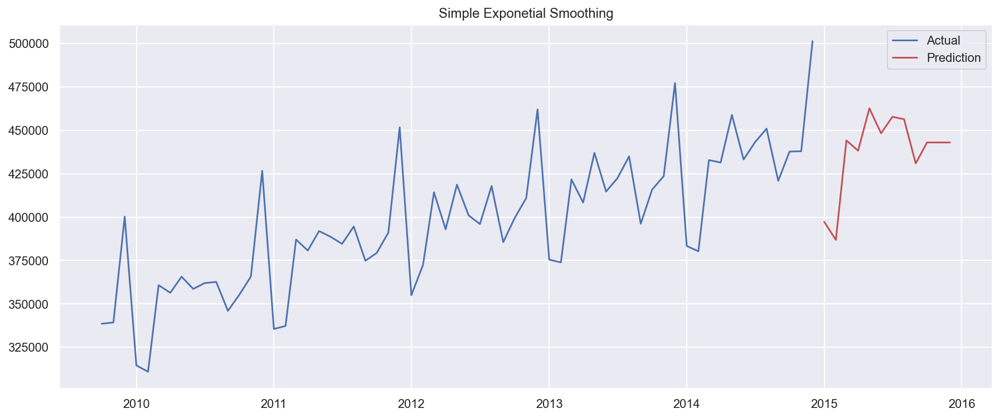

In [33]:
# Plotting

future_prediction = 12

plt.figure(figsize=(15, 6))
#plt.plot(result.values, label="Prediction")
plt.plot(result[:(len(result) - future_prediction)], label="Actual")
plt.plot(result[-future_prediction:], "r-", label="Prediction")
plt.legend(loc="best")
plt.axis("tight")
plt.title("Simple Exponetial Smoothing")
#plt.xticks(rotation=90)
plt.grid(True);

As we expected, the simple case does not take into account the trend and seasonality. Let us see the next level including the tren effect: the second exponential smoothing.

### Model 3: Second Exponential Smoothing <a class="anchor" id="second"></a>

To include the trend, we include a new constant $\beta$ called smoothing trend by the following:
    
$$\hat{y}_{t} = \alpha \cdot y_t + (1-\alpha) \cdot (\hat{y}_{t-1} + b_{t-1})$$ 

$$ b_t = \beta \cdot (\hat{y}_{t} - \hat{y}_{t-1}) + (1-\beta) \cdot b_{t-1} $$
    
where $b_t$ is related with the trend of the previous period.

In that particular case, the forecasting follows the following formula:
    
$$ F_{t+1} = \hat{y}_{t} + b_t $$  one-period-ahead forecast 

$$ F_{t+m} = \hat{y}_{t} + m b_t $$  m-periods-ahead forecast

In [34]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series) + 1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series):  # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
        trend = beta * (level - last_level) + (1 - beta) * trend
        result.append(level + trend)
    return result


def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """

    with plt.style.context("seaborn-white"):
        plt.figure(figsize=(20, 8))
        for alpha in alphas:
            for beta in betas:
                plt.plot(
                    double_exponential_smoothing(series, alpha, beta),
                    label="Alpha {}, beta {}".format(alpha, beta),
                )
        plt.plot(series, "k-", label="Actual")
        plt.legend(loc="best")
        plt.axis("tight")
        plt.title("Double Exponential Smoothing")
        plt.xticks(rotation=90)
        plt.grid(True)

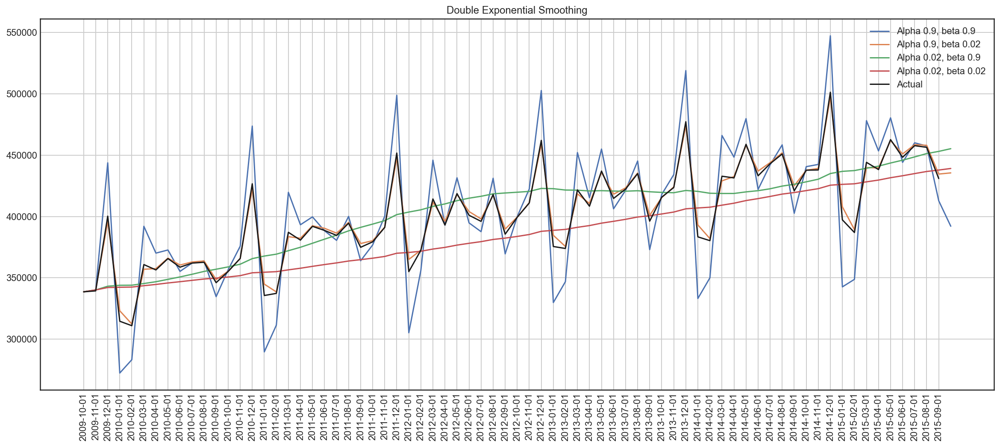

In [35]:
plotDoubleExponentialSmoothing(sales.Sales_Dollars, alphas=[0.9, 0.02], betas=[0.9, 0.02])

In [36]:
# Prediction done for 12 months

double = ExponentialSmoothing(sales, trend="add").fit()
pred = double.forecast(12).rename('Sales_Dollars'%double.model.params['smoothing_trend'])  

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/holtwinters/model.py:922: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [37]:
double.model.params

{'smoothing_level': 0.0757142857142857,
 'smoothing_trend': 0.0757142857142857,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 338630.0,
 'initial_trend': 756.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [38]:
# Preprocessing results

pred = pd.DataFrame(pred)
pred.head()

# Concating both datasets for plotting purposes

result = pd.concat([sales, pred], axis=0)
result.tail(5)

# Uniform index
result.index = pd.to_datetime(result.index)
result.tail()

,Sales_Dollars
2016-05-01,459468.614674
2016-06-01,460569.407735
2016-07-01,461670.200796
2016-08-01,462770.993857
2016-09-01,463871.786918


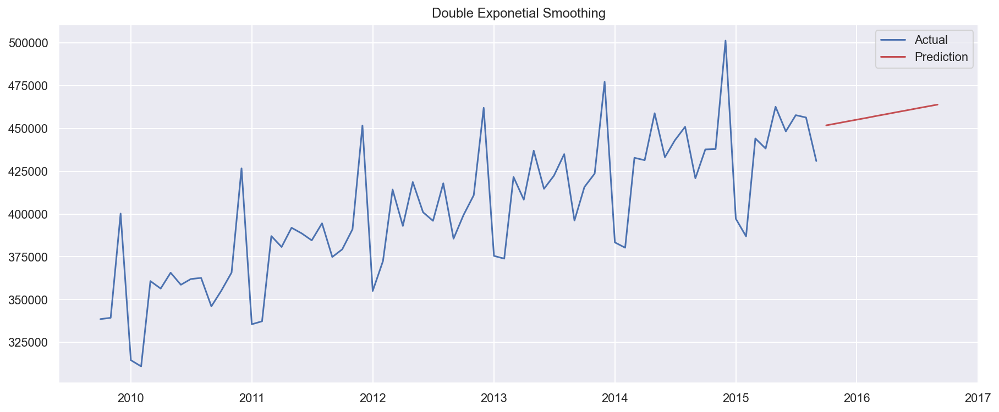

In [39]:
# Plotting future forecast
plt.figure(figsize=(15, 6))
#plt.plot(result.values, label="Prediction")
plt.plot(result[:(len(result) - future_prediction)], label="Actual")
plt.plot(result[-future_prediction:], "r-", label="Prediction")
plt.legend(loc="best")
plt.axis("tight")
plt.title("Double Exponetial Smoothing")
#plt.xticks(rotation=90)
plt.grid(True);

The trend is included in the prediction, but it does not follow the seasonality as expected.

### Model 4: Triple Exponetial Smoothing <a class="anchor" id="triple"></a>

In case there is seasonality, we include a expresion an a new paramter to model the seasonality ($\gamma$). These are the formulas to solve:
    
    
$$\ell_x = \alpha(y_x - s_{x-L}) + (1-\alpha)(\ell_{x-1} + b_{x-1})$$

$$b_x = \beta(\ell_x - \ell_{x-1}) + (1-\beta)b_{x-1}$$

$$s_x = \gamma(y_x - \ell_x) + (1-\gamma)s_{x-L}$$

$$\hat{y}_{x+m} = \ell_x + mb_x + s_{x-L+1+(m-1)modL}$$
    
where L is the period of the season. Now we can predict m future steps ahead.    

In [40]:
triple_model = ExponentialSmoothing(sales,
                                   trend="add",
                                   seasonal="add",
                                   seasonal_periods=12).fit()
pred = triple_model.forecast(future_prediction)

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/holtwinters/model.py:922: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



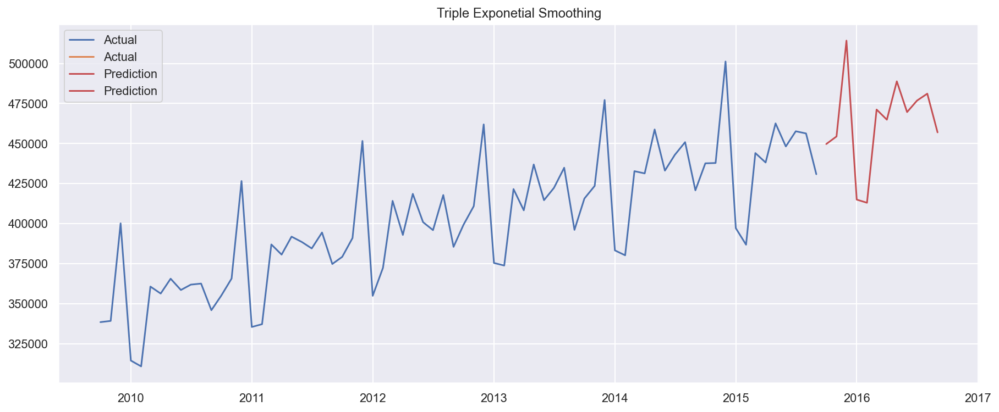

In [41]:
# Preprocessing results

pred = pd.DataFrame(pred)
#print(pred)

# Concating both datasets for plotting purposes

result = pd.concat([sales, pred], axis=0)
result.tail(5)

# Uniform index
result.index = pd.to_datetime(result.index)
result.tail()

# Plotting future forecasting
plt.figure(figsize=(15, 6))
fig1 = plt.plot(result[:(len(result) - future_prediction)], label="Actual")
fig2 = plt.plot(result[-future_prediction:], "r-", label="Prediction")
plt.legend(loc="best")
plt.axis("tight")
plt.title("Triple Exponetial Smoothing")
plt.grid(True);

Now the model follow both trend and seasonality.

### Smoothing Models Comparison <a class="anchor" id="smoothing_comparison"></a>

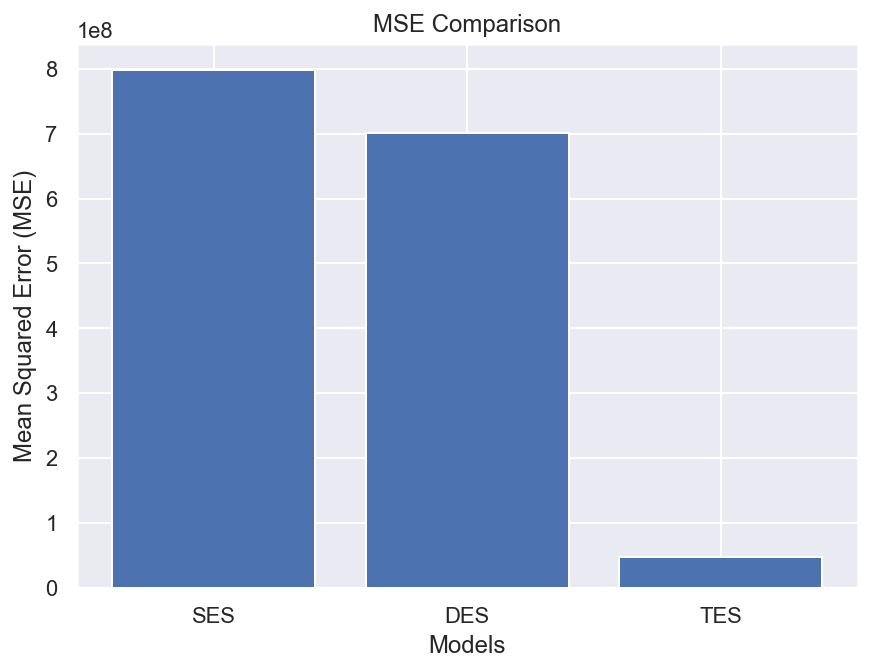

In [42]:
# MSE comparison
model_names = ["SES", "DES", "TES"]
model_mse = [round(np.mean((simple.resid)**2), 4),
            round(np.mean((double.resid)**2), 4),
            round(np.mean((triple_model.resid)**2), 4)]

plt.figure(figsize=(7,5))
plt.bar(model_names, model_mse)
plt.xlabel("Models")
plt.ylabel("Mean Squared Error (MSE)")
plt.title("MSE Comparison")
plt.show()

It is clear, that the Triple Exponetial Smoothing is the one with less MSE. But it is the ultimate model that we can apply? How good it is? Let us look at the autocorrelation and partial autocorrelation plots of the residuals.

## Dickey-Fuller Test <a class="anchor" id="dickey"></a>

### Residuals <a class="anchor" id="residuals"></a>

In [43]:
# Time series plots

def tsplot(y, lags=None, figsize=(12, 7), style="bmh"):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        ts_ax.plot(y)
        dates = triple_model.resid[24 + 1 :].index
        ts_ax.set_xticklabels(dates, rotation=90)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title(
            "Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}".format(p_value)
        )
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

In [44]:
# Checking the labels of the series plot to rotate them
triple_model.resid[24 + 1 :].index

Index(['2011-11-01', '2011-12-01', '2012-01-01', '2012-02-01', '2012-03-01',
       '2012-04-01', '2012-05-01', '2012-06-01', '2012-07-01', '2012-08-01',
       '2012-09-01', '2012-10-01', '2012-11-01', '2012-12-01', '2013-01-01',
       '2013-02-01', '2013-03-01', '2013-04-01', '2013-05-01', '2013-06-01',
       '2013-07-01', '2013-08-01', '2013-09-01', '2013-10-01', '2013-11-01',
       '2013-12-01', '2014-01-01', '2014-02-01', '2014-03-01', '2014-04-01',
       '2014-05-01', '2014-06-01', '2014-07-01', '2014-08-01', '2014-09-01',
       '2014-10-01', '2014-11-01', '2014-12-01', '2015-01-01', '2015-02-01',
       '2015-03-01', '2015-04-01', '2015-05-01', '2015-06-01', '2015-07-01',
       '2015-08-01', '2015-09-01'],
      dtype='object', name='Date')

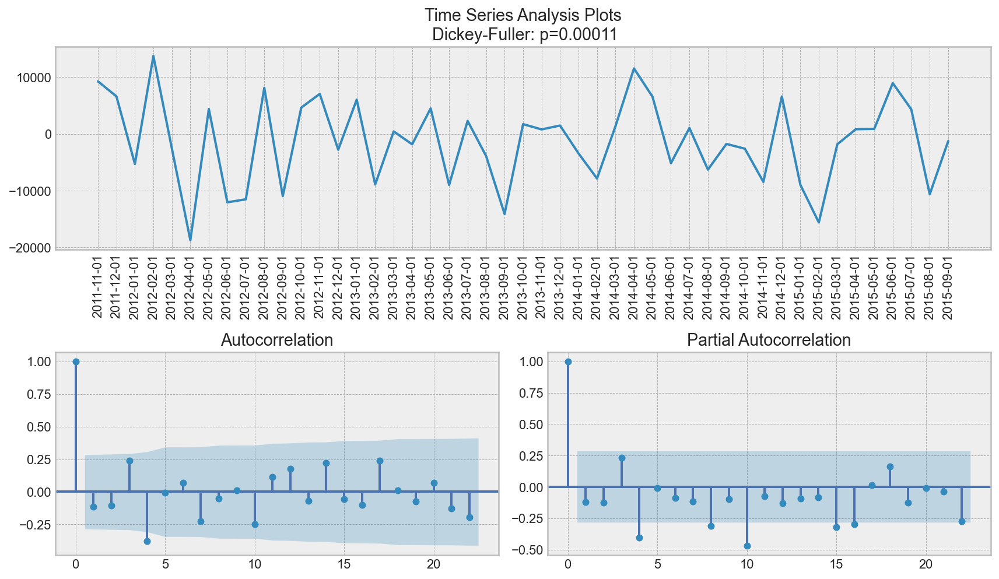

In [45]:
# Plotting information of residuals
tsplot(triple_model.resid[24 + 1 :], lags=22)

Apparently, the residuals are quite noisy, which means that the triple model works pretty good. Let us explore other models.

## 2nd Alternative way to detect trend and seasonality: Decomposition <a class="anchor" id="decomposition"></a>

Mathematically speaking every time series can be decomposed in four parts [3]: 
- Baseline or level, that is, the average value in the series.
- Trend: The increasing or decreasing value in the series.
- Seasonality: The repeating short-period-term cycle in the series
- Noise: The random variation in the series.

### Additive and Multiplicative Models

There are two ways to model the components of a time series:
- Additive: linear model where all components contributes in a linear way like y(t) = Level + Trend + Seasonality + Noise.
    Here the trend is a straight line and the seasonality has the same frequency and amplitude.
- Mutliplicative: nonlinear model (quadratic, exponential, etc) like y(t) = Level * Trend * Seasonality * Noise.
    The trend is curved and the seasonality has an increasing or decreasing frequency and/or amplitude over time.


In [46]:
sales.head()

,Sales_Dollars
Date,
2009-10-01,338630
2009-11-01,339386
2009-12-01,400264
2010-01-01,314640
2010-02-01,311022


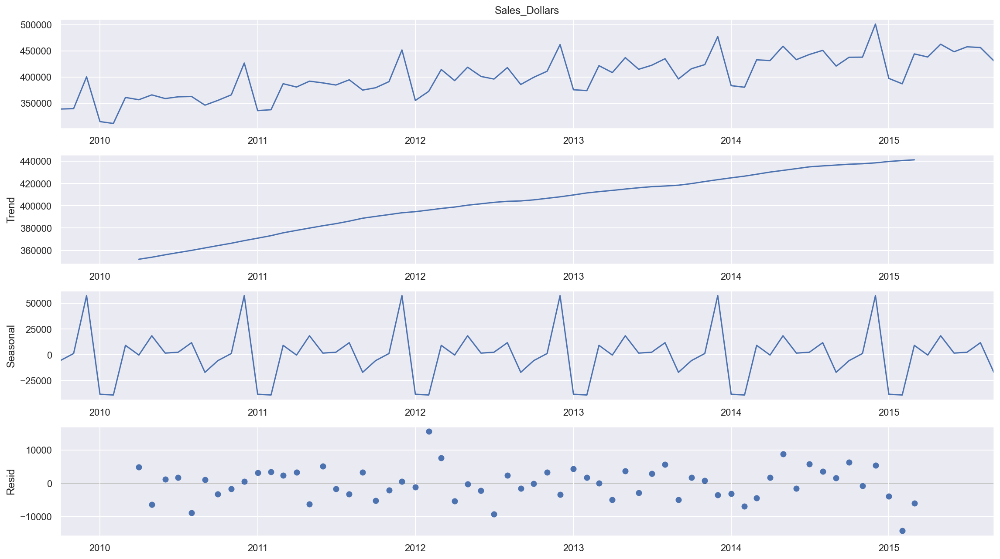

In [47]:
# Time series additive decompostion
sales.index = pd.to_datetime(sales.index)
sales.head()
dec_add = seasonal_decompose(sales.Sales_Dollars, model='additive', period=12)  # 12 month period to identify trend 

fig = dec_add.plot()
fig.set_size_inches((16, 9))
fig.tight_layout()
plt.show()

We can clearly identify the yearly-based trend and the seasonality. Let us try with multiplicative model.

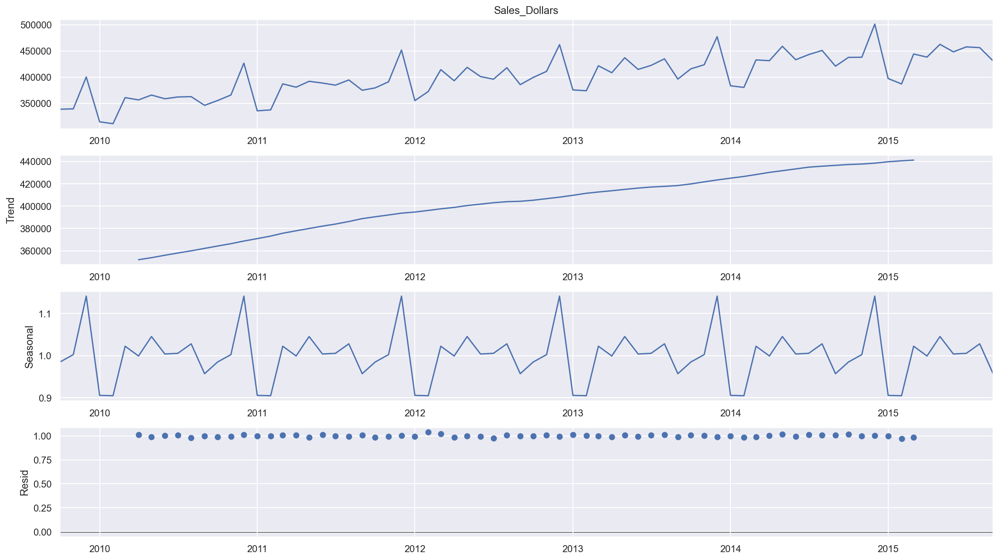

In [48]:
# time series multiplicative decomposition
dec_multi = seasonal_decompose(sales.Sales_Dollars, model='mutiplicative')  # 12 month period to identify trend 

fig = dec_multi.plot()
fig.set_size_inches((16, 9))
fig.tight_layout()
plt.show()

## 3rd Alternative way to detect trend and seasonality: ACP and PACP plots <a class="anchor" id="auto"></a>

### Autocorrelation plot

Acording to [2], the autocorrelation plot (ACP) is only one measure of randomness among the lags of the time series. Grafically speaking, the lags with more autocorrelation value than the confidence interval, are significant in terms of correlation. It is used as well to identify the seasonality and to select the p coeficient of the ARIMA model.

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

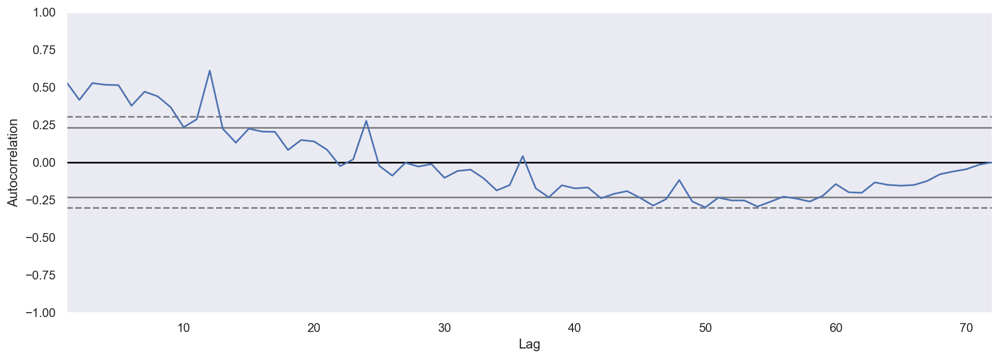

In [49]:
# Let us check the ACP of our series
plt.figure(figsize=(15,5))
autocorrelation_plot(sales)

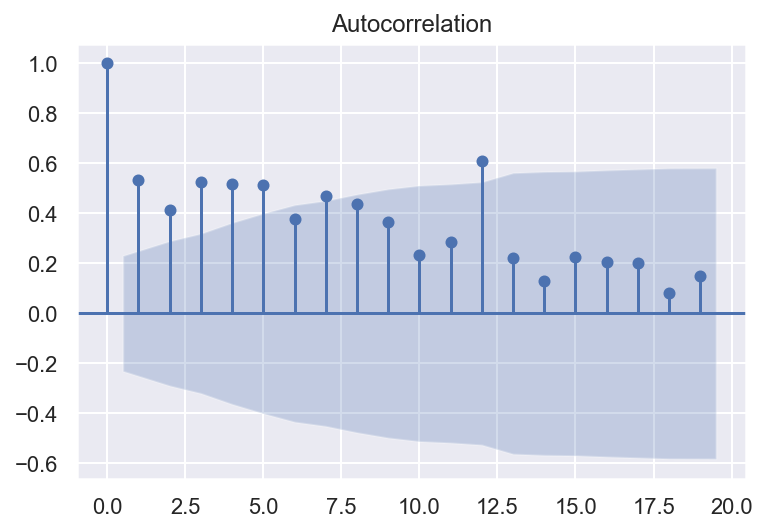

In [50]:
# An alternative way
plot_acf(sales)
plt.show()

We can identify in the first plot a seasonality pick at the end of every year. This is also shown in the second plot becasue the autocorrelation of the lag is high.

### Partial Autocorrelation Plot

According to [3] \"A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.\"

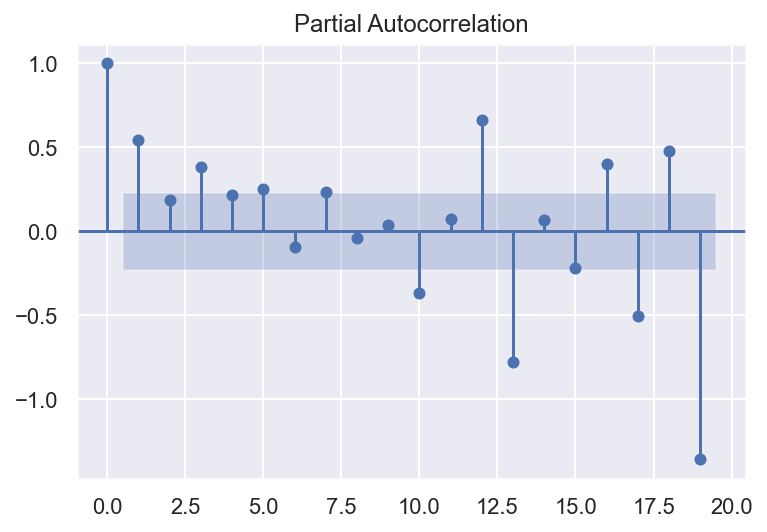

In [51]:
plot_pacf(sales)
plt.show()

Here again the lag 12 is quite important, as well the lag 13 and 19.

## Stationarity: Augmented Dicker-Fuller Test <a class="anchor" id="stationarity"></a>

A stationary time series is stationary when its mean, variance and covariance are constant. It means that the time series does not change over time, and this is the imformation required by the forecating models like ARIMA model to make predicitons.

To check the stationarity of a time series, there exist the so called Dicky-Fuller Test. It uses a null hypothesis testing to check whether the time series is stationary or not. 

In [52]:
# Dicky-Fuller Test
FD_test = sm.tsa.stattools.adfuller(sales)
FD_test

(-4.344562938177356,
 0.0003715699299691816,
 11,
 60,
 {'1%': -3.5443688564814813,
  '5%': -2.9110731481481484,
  '10%': -2.5931902777777776},
 1215.399742119931)

In [53]:
# According to the documentation, we obtain the following values
"""
Returns
-------
adf : float
    The test statistic.
pvalue : float
    MacKinnon"s approximate p-value based on MacKinnon (1994, 2010).
usedlag : int
    The number of lags used.
nobs : int
    The number of observations used for the ADF regression and calculation
    of the critical values.
critical values : dict
    Critical values for the test statistic at the 1 %, 5 %, and 10 %
    levels. Based on MacKinnon (2010).
icbest : float
    The maximized information criterion if autolag is not None.
resstore : ResultStore, optional
    A dummy class with results attached as attributes.
"""

'\nReturns\n-------\nadf : float\n    The test statistic.\npvalue : float\n    MacKinnon"s approximate p-value based on MacKinnon (1994, 2010).\nusedlag : int\n    The number of lags used.\nnobs : int\n    The number of observations used for the ADF regression and calculation\n    of the critical values.\ncritical values : dict\n    Critical values for the test statistic at the 1 %, 5 %, and 10 %\n    levels. Based on MacKinnon (2010).\nicbest : float\n    The maximized information criterion if autolag is not None.\nresstore : ResultStore, optional\n    A dummy class with results attached as attributes.\n'

In [54]:
print('T-statistic: {}'.format(FD_test[0]))
print('p-value: {}'.format(FD_test[1]))

T-statistic: -4.344562938177356
p-value: 0.0003715699299691816


In this case, p-value is less than 5%, so the null-hypothesis is rejected and the time series is stationary. 

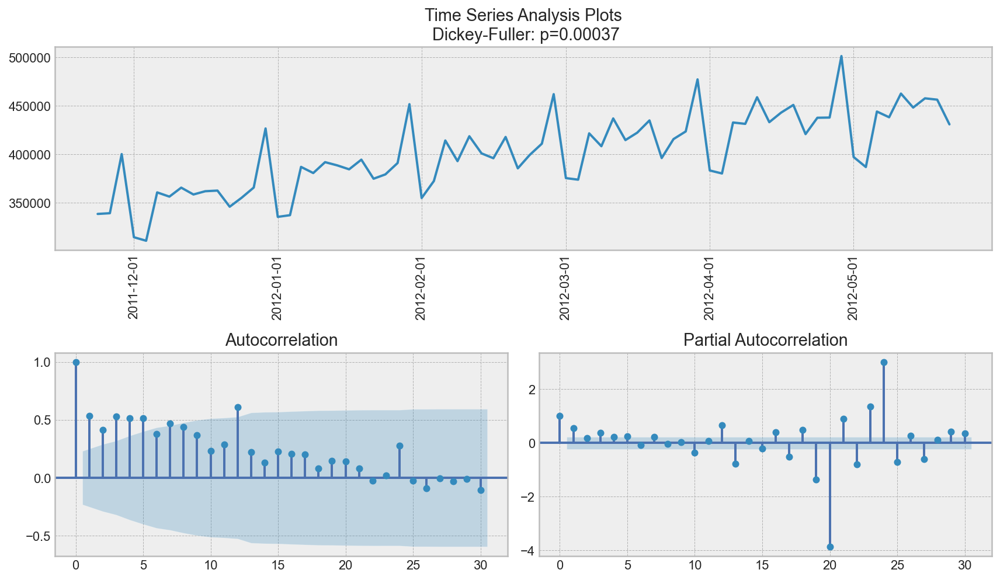

In [55]:
# We can use the previous function as well to study the stationarity
tsplot(sales.Sales_Dollars, lags=30)

Although the Dicker-Fuller test was succesful in terms of stationarity, there are still too significant lags in the ACP and PACP. Let us apply differencing substracting the series from itself with lag 12 to substract the strong seasonality.

In [56]:
# Apply differencing
sales_diff = sales - sales.shift(12)

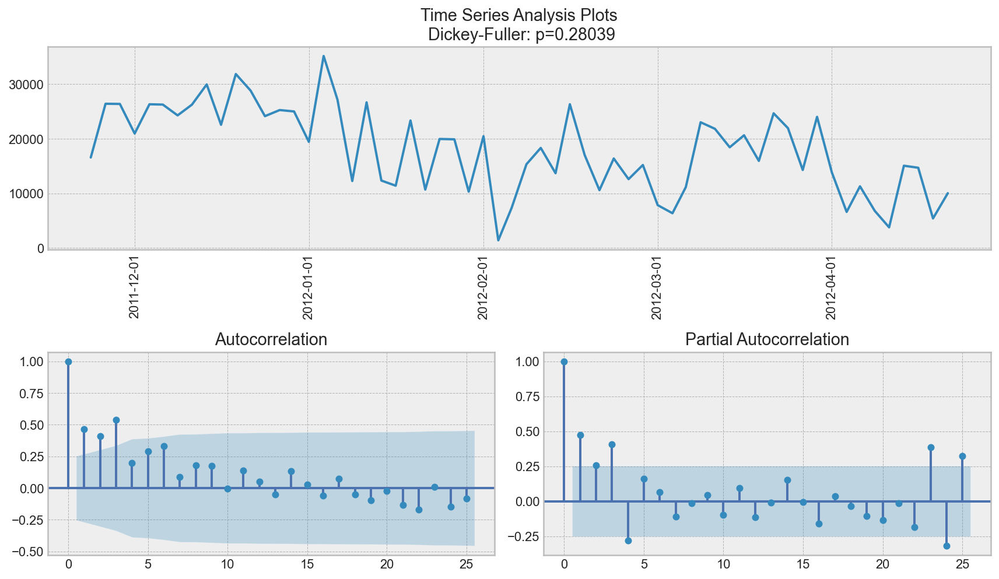

In [57]:
# Plot results
tsplot(sales_diff.Sales_Dollars[12:], lags=25)

The number of significant lags has been reduced, but the series is not stationary. So we reject the differencing method for our particular time series.

## Model 5: SARIMA Model <a class="anchor" id="sarima"></a>

Due to the strong seasonal component, the Seasonal Autoregression Moving Average (SARIMA) model is selected. In this particular case, we have to select 7 different coefficients:
- p from the Autoregression Model (AM)
- q from the Moving Average model (MA)
- d, the number of nonseasonal differences needed to make the series stationary. In this case 1 becasue the series was already stationary.
- s, the seasonal period length of the series.
- P, order of autoregression for the seasonal component of the model, which can be derived from PACF. In our case 3.
- Q, similar using the ACP. 4?
- D, order of the seasonal integration.
    

To do the things quickly, let us test different models and we will select the best one.

In [58]:
# Setting initial values and some bounds for them
ps = range(2, 5)
d = 1
qs = range(2, 5)
Ps = range(0, 2)
D = 1
Qs = range(0, 2)
s = 24  # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [59]:
# Hyperparameters tunning
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """

    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                sales.Sales_Dollars,
                order=(param[0], d, param[1]),
                seasonal_order=(param[2], D, param[3], s),
            ).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ["parameters", "aic"]
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by="aic", ascending=True).reset_index(
        drop=True
    )

    return result_table

In [60]:
# Run optimization
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/36 [00:00<?, ?it/s]

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/comm

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/comm

In [61]:
# Show tunning results
result_table.head()

,parameters,aic
0,"(2, 2, 0, 0)",985.569042
1,"(2, 3, 0, 0)",985.641450
2,"(2, 2, 1, 0)",986.112627
3,"(2, 2, 0, 1)",986.114365
4,"(4, 2, 0, 0)",986.744713


In [62]:
# Set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

best_model = sm.tsa.statespace.SARIMAX(
    sales.Sales_Dollars,
    order=(p, d, q),
    seasonal_order=(P, D, Q, s)
).fit(disp=-1)

print(best_model.summary())

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/home/xavier/snap/jupyter/common/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



                                      SARIMAX Results                                      
Dep. Variable:                       Sales_Dollars   No. Observations:                   72
Model:             SARIMAX(2, 1, 2)x(0, 1, [], 24)   Log Likelihood                -487.785
Date:                             Mon, 30 Oct 2023   AIC                            985.569
Time:                                     11:32:56   BIC                            994.820
Sample:                                 10-01-2009   HQIC                           989.050
                                      - 09-01-2015                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1650      0.031    -38.190      0.000      -1.225      -1.105
ar.L2         -0.9979      

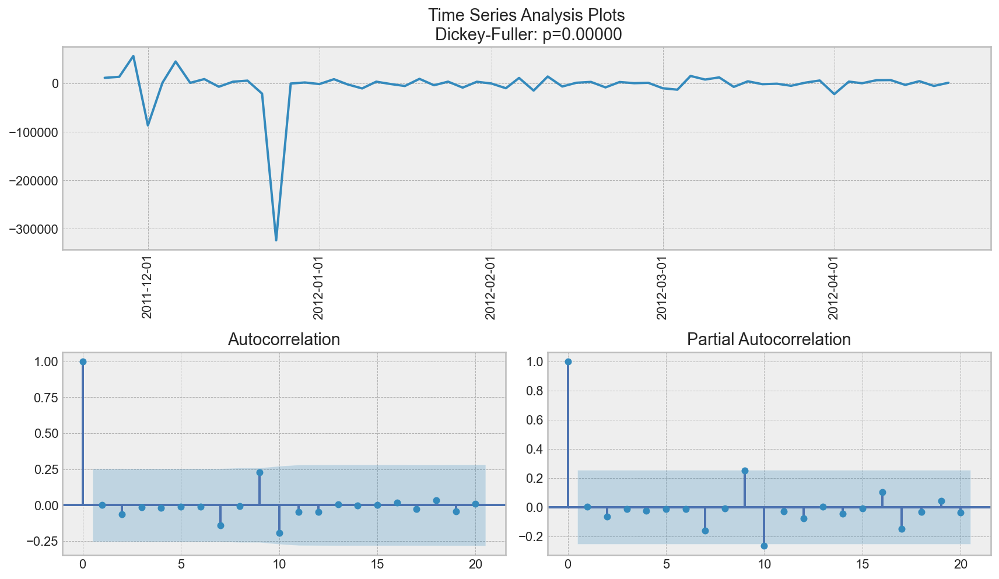

In [63]:
# Plot residuals to check the quality of the model
tsplot(best_model.resid[12:], lags=20)

The residuals show us how gut is the model: apparently they are random, gut!

In [64]:
# Plotting SARIMA future forecasting

def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ["actual"]
    data["arima_model"] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data["arima_model"][: s + d] = np.NaN

    # forecasting on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(
        data["actual"][s + d :], data["arima_model"][s + d :]
    )
    mse = mean_squared_error(data["actual"][s + d :], data["arima_model"][s + d :]
                            )
    
    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {0:.2f}% \n".format(error) + 
             "Mean Squared Error: {0:.2f}".format(mse))
    plt.plot(forecast, color="r", label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color="lightgrey")
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);

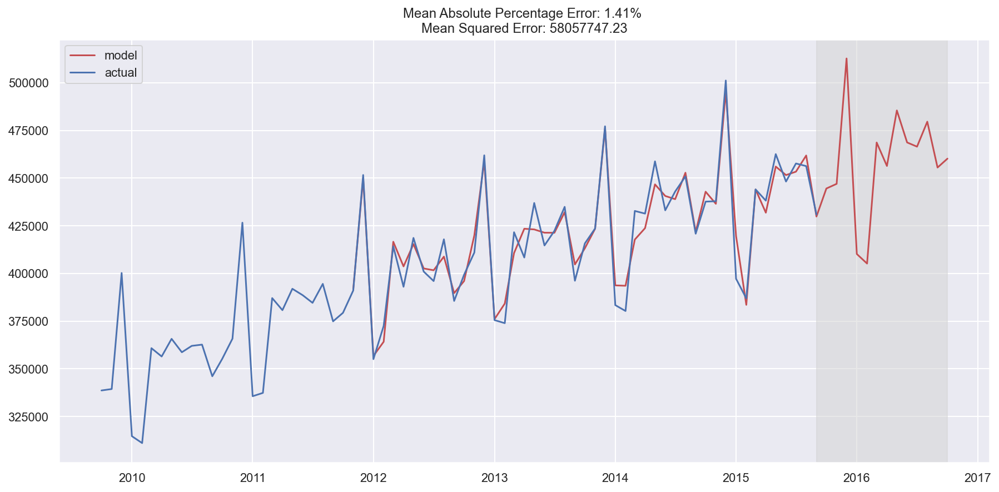

In [65]:
plotSARIMA(sales, best_model, future_prediction)

The average value is quite small, only 1.4%!

In [66]:
# Plotting SARIMA future forecasting

def mse_SARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ["actual"]
    data["arima_model"] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data["arima_model"][: s + d] = np.NaN

    # forecasting on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate mse
    mse = mean_squared_error(data["actual"][s + d :], data["arima_model"][s + d :])
                             
    return mse
                             
mse_sarima = mse_SARIMA(sales, best_model, future_prediction)                             

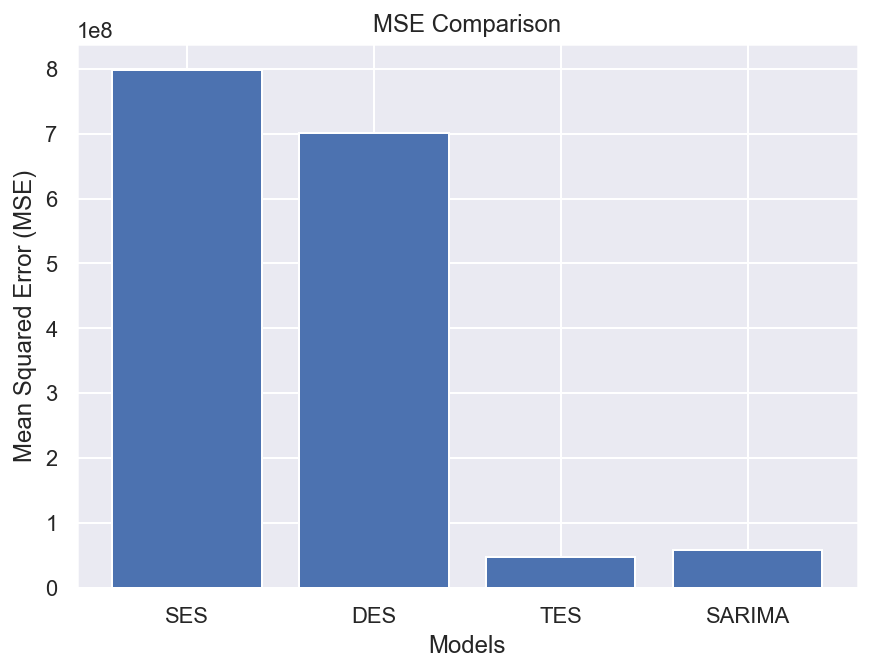

In [67]:
# MSE comparison including SARIMA results

model_names = ["SES", "DES", "TES", "SARIMA"]
model_mse = [round(np.mean((simple.resid)**2), 4),
            round(np.mean((double.resid)**2), 4),
            round(np.mean((triple_model.resid)**2), 4),
            mse_sarima
            ]

plt.figure(figsize=(7,5))
plt.bar(model_names, model_mse)
plt.xlabel("Models")
plt.ylabel("Mean Squared Error (MSE)")
plt.title("MSE Comparison")
plt.show()

Triple Exponential Smoothing has less MSE than SARIMA.

## Machine Learning Models <a class="anchor" id="ml"></a>

After applying the classic models for time series, let us see how the regression Machine Learning (ML) algorithms deal with time series.
According to [1], it is a simple alternative than ARIMA models, because regression is easier to implement and to mantain in case of production.

### Feature Extraction <a class="anchor" id="extraction"></a>

These are the features used for time series [1]:
1. Lag features.
2. Date and time features: decompose the dates is usually usefull. Example: decompose month by weeks or days, represent holidays as boolean features.
3. Target encoding: Use statistics like max/min value of a series in a window, average/median value in a window, window variance.
4. Rolling window. Similar to the last case, but taking statistics selecting a window size.  
5. Forecasts from other models.

### 1. Lag Features <a class="anchor" id="lag"></a>

A common technique used, is shifting the sereis n lags back. In this case, we get the feature column where the current value of time series is aligned with its value at time t-n. Then, we will forecast n steps ahead from having observed the current state of the series. We have to be very carefull selecting the n steps back, because taking to large value of back steps, we will have the information n lags before, which can be "to old" to predict the next future. 

In our dataset, we select lag 12 because we have identified a strong year seasonality. That means, that the slaes obtained in a particular month is somehow related woth the same month of last year.

In [68]:
# Create a copy of sales
data = pd.DataFrame(sales.Sales_Dollars.copy())
data.columns = ["y"]

In [69]:
# Adding the n steps back: from 1 to 13 because the sales are based on month
for i in range(1, 13):
    data["lag_{}".format(i)] = data.y.shift(i)

data_lag = data.copy()
data_lag.tail()

,y,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
Date,,,,,,,,,,,,,
2015-05-01,462615,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0,433152.0,458822.0
2015-06-01,448229,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0,433152.0
2015-07-01,457710,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0
2015-08-01,456340,457710.0,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0
2015-09-01,430917,456340.0,457710.0,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0


In [70]:
# Let's train the model
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """

    # get the index after which test set starts
    test_index = int(len(X) * (1 - test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]

    return X_train, X_test, y_train, y_test

In [71]:
# Scaling features
scaler = StandardScaler()

#### Model 6: Linear Regression with lags features <a class="anchor" id="reg_lag"></a>

In [72]:
# Splitting dataset

y = data_lag.dropna().y
X = data_lag.dropna().drop(["y"], axis=1)
test_size = 0.30

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=test_size)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

target_coding_reg = LinearRegression()
target_coding_reg.fit(X_train_scaled, y_train)

LinearRegression()

In [73]:
# Implement the model
time_lag_reg = LinearRegression()
time_lag_reg.fit(X_train_scaled, y_train)

LinearRegression()

In [74]:
# Checking overfitting
time_lag_reg.score(X_train_scaled, y_train)

0.9683516264714358

In [75]:
# Model accuracy
time_lag_reg_acc = time_lag_reg.score(X_test_scaled, y_test)
time_lag_reg_acc

0.8643351414730583

There is ovefitting: the model works much better with the training dataset than the test dataset.

In [76]:
# MSE calculation
pred = time_lag_reg.predict(X_test_scaled)
time_lag_mse = mean_squared_error(y_test, pred)
time_lag_mse

80018513.57083997

In [77]:
# Plot the results and feature coefficients

def plotModelResults(
    model, X_train=X_train, X_test=X_test):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """

    prediction = model.predict(X_test)

    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "r", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)

    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)


def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """

    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind="bar")
    plt.grid(True, axis="y")
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles="dashed");

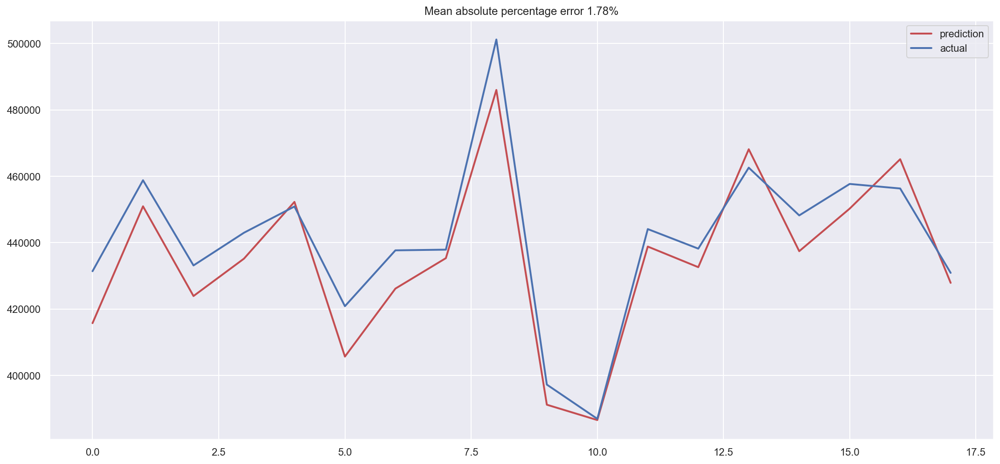

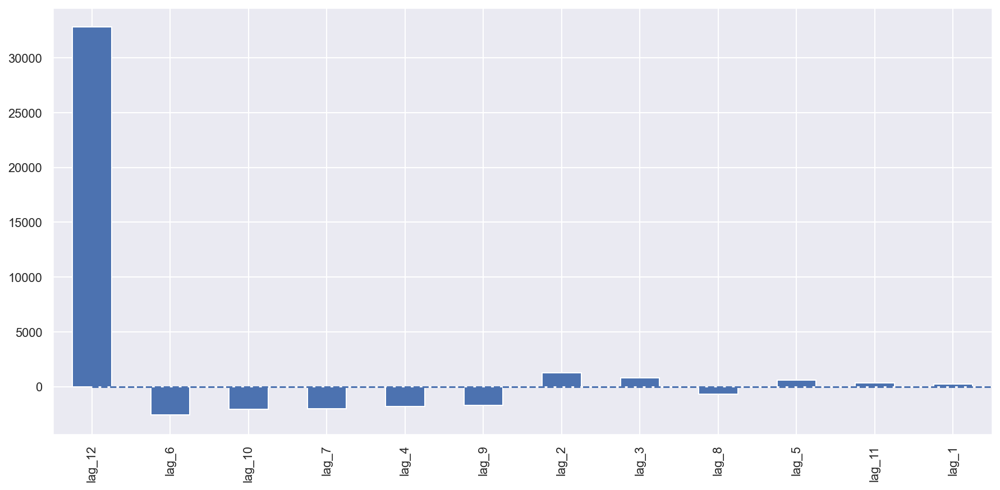

In [78]:
plotModelResults(time_lag_reg,
                X_train=X_train_scaled,
                X_test=X_test_scaled)
plotCoefficients(time_lag_reg)

The result obtained is worst than SARIMA and the new model suffers due to overfitting: the lag 12 is extensively used by the model. Lags 11 and 1 are not important.
Let us try to add date features and a boolean for weekends. We have to transform the index.

#### Regularization <a class="anchor" id="regu"></a>

To reduce the overfitting, let us use regularization:

##### Model 7: Lasso with lags features <a class="anchor" id="lasso_lag"></a>

In [79]:
# Lasso: 10 cross validation performance
lassocv = LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
lassocv.fit(X_train_scaled, y_train)

alpha = lassocv.alpha_
print(alpha)

time_lag_lasso_reg = Lasso(alpha=alpha)
time_lag_lasso_reg.fit(X_train_scaled, y_train)

time_lag_lasso_reg_acc = time_lag_lasso_reg.score(X_test_scaled, y_test)
time_lag_lasso_reg_acc

97.52916070824439


0.8640144139990421

In [80]:
# MSE calculation
pred = time_lag_lasso_reg.predict(X_test_scaled)
time_lag_lasso_mse = mean_squared_error(y_test, pred)
time_lag_lasso_mse

80207686.62575464

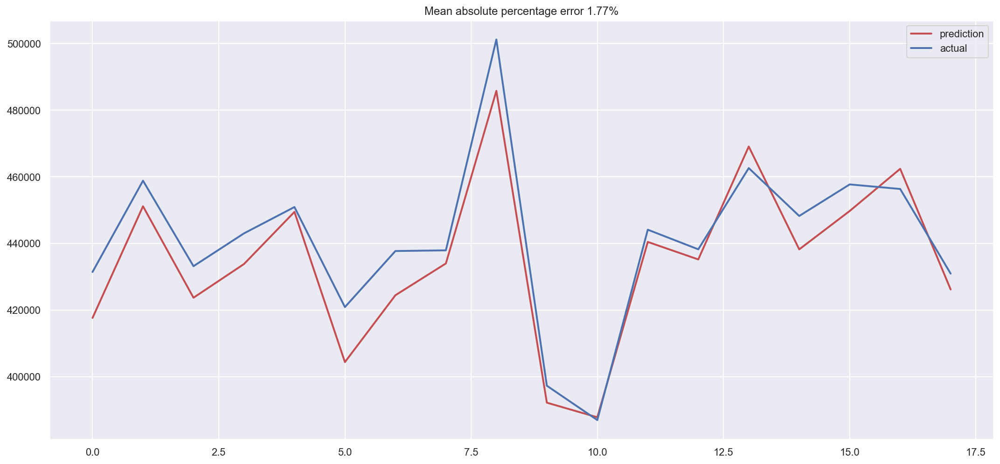

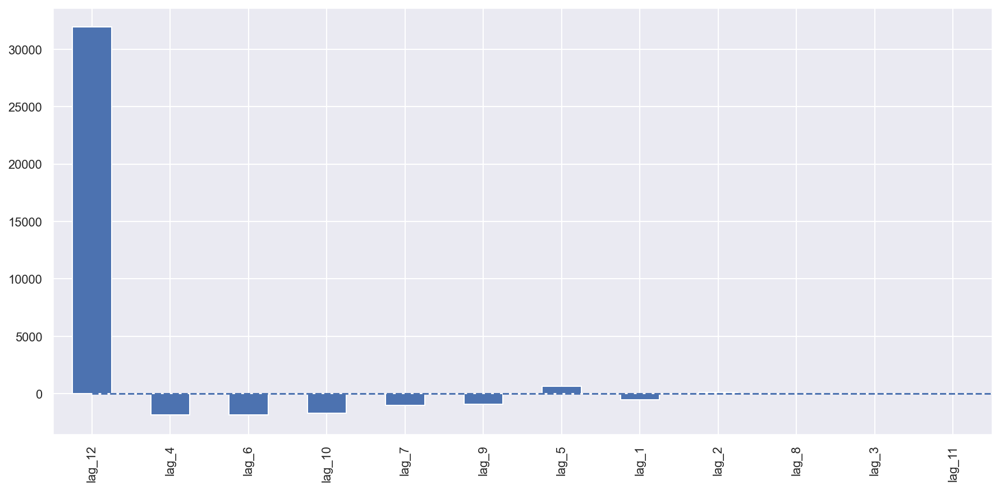

In [81]:
plotModelResults(time_lag_lasso_reg,
                X_train=X_train_scaled,
                X_test=X_test_scaled)
plotCoefficients(time_lag_lasso_reg)

##### Model 8: Ridge with lags features <a class="anchor" id="ridge_lag"></a>

ridge alpha coefficient: 0.1799568617663827
Accuracy: 0.8620082844440106


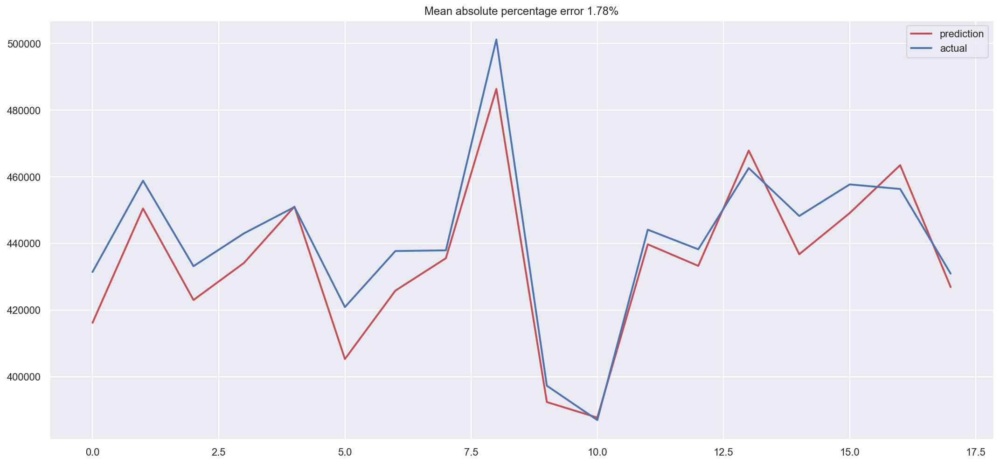

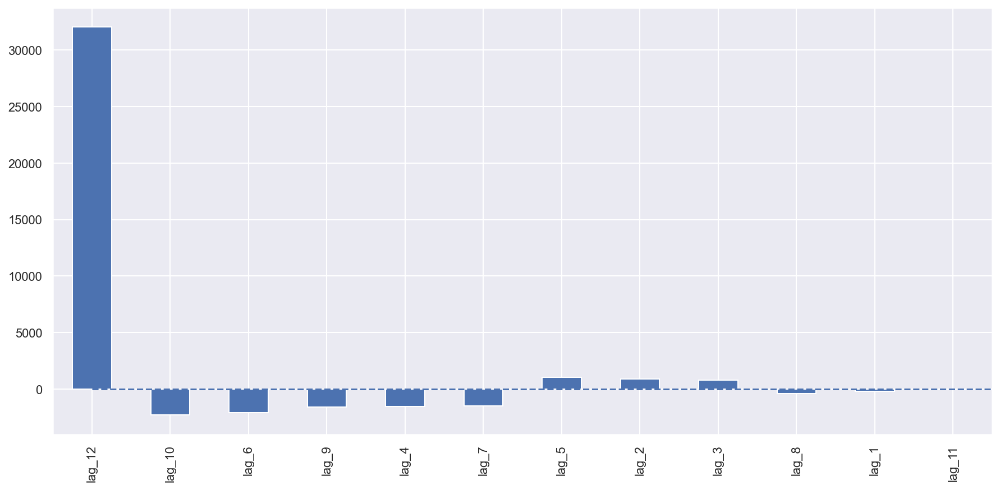

In [82]:
# Ridge

alphas = np.random.uniform(low=0, high=10, size=(50,))
ridgecv = RidgeCV(alphas=alphas, cv=10, normalize=True)
ridgecv.fit(X_train_scaled, y_train)

print('ridge alpha coefficient: {}'.format(ridgecv.alpha_))

time_lag_ridge_reg = Ridge(alpha=ridgecv.alpha_)
time_lag_ridge_reg.fit(X_train_scaled, y_train)

# Model accuracy
time_lag_ridge_reg_acc = time_lag_ridge_reg.score(X_test_scaled, y_test)
print('Accuracy: {}'.format(time_lag_ridge_reg_acc))

time_lag_ridge_reg.score(X_train_scaled, y_train)

plotModelResults(
    time_lag_ridge_reg,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)
plotCoefficients(time_lag_ridge_reg)

In [83]:
# MSE calculation
pred = time_lag_ridge_reg.predict(X_test_scaled)
time_lag_ridge_mse = mean_squared_error(y_test, pred)
time_lag_ridge_mse

81390951.81887227

#### Model 9: Random Forest <a class="anchor" id="random_forest_lag"></a>

In [84]:
rand_for_lag = RandomForestRegressor(random_state=1)
rand_for_lag.fit(X_train_scaled, y_train)

rand_for_lag.score(X_train_scaled, y_train)

0.9838928009649451

In [85]:
rand_for_lag_acc = rand_for_lag.score(X_test_scaled, y_test)
rand_for_lag_acc

0.7949891874831347

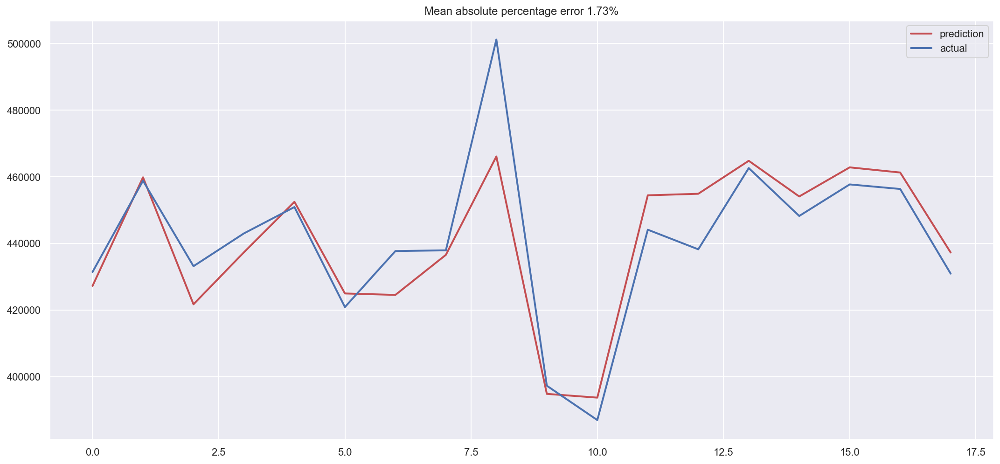

In [86]:
plotModelResults(
    rand_for_lag,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)

In [87]:
# MSE calculation
pred = rand_for_lag.predict(X_test_scaled)
rand_for_lag_mse = mean_squared_error(y_test, pred)
rand_for_lag_mse

120920484.94851682

#### Model 10: XGBoost <a class="anchor" id="xgboost_lag"></a>

In [88]:
xgb_lag = XGBRegressor()
xgb_lag.fit(X_train_scaled, y_train,
       eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
       verbose=1000);

xgb_lag.score(X_train_scaled, y_train)

[0]	validation_0-rmse:283884.28125	validation_1-rmse:324876.59375
[99]	validation_0-rmse:0.04286	validation_1-rmse:12367.85840


0.9999999999979837

In [89]:
# Model accuracy
xgb_lag_acc = xgb_lag.score(X_test_scaled, y_test)
xgb_lag_acc

0.7406621520655874

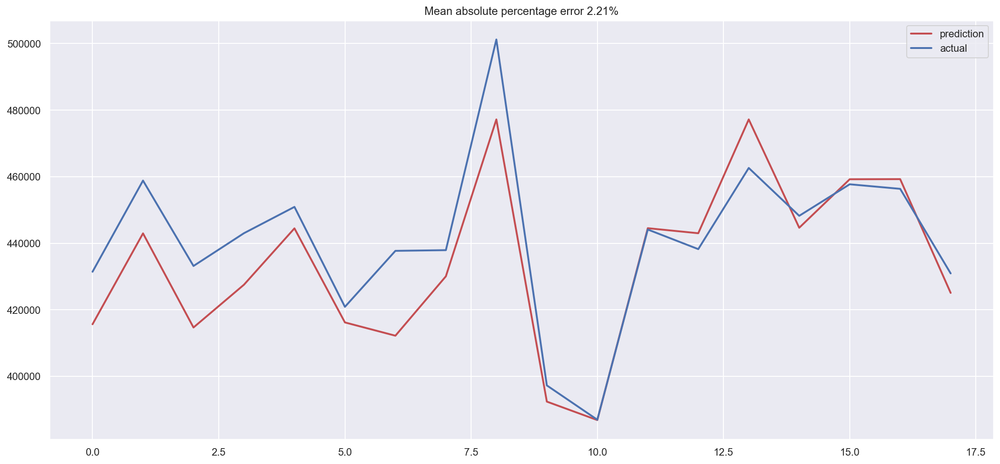

In [90]:
plotModelResults(
    xgb_lag,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
)

In [91]:
# MSE calculation
pred = time_lag_ridge_reg.predict(X_test_scaled)
xgb_lag_mse = mean_squared_error(y_test, pred)
xgb_lag_mse

81390951.81887227

### 2. Date and Time Features <a class="anchor" id="date_time"></a>

In [92]:
# Creating new date lags and boolean weekends
# Note: I have played with different date features to obtain the best accuracy

data.index = pd.to_datetime(data.index)
data["weekday"] = data.index.weekday
#data["dayofweek"] = data.index.dayofweek
#data["dayofyear"] = data.index.dayofyear
#data["dayofmonth"] = data.index.day
data["week"] = data.index.week
#data["weekofyear"] = data.index.weekofyear
data["month"] = data.index.month
data["quarter"] = data.index.quarter
data["year"] = data.index.year
data["is_weekend"] = data.weekday.isin([5, 6]) * 1  # encoding the weekends

data_date = data.copy()
data_date.tail()

,y,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,weekday,week,month,quarter,year,is_weekend
Date,,,,,,,,,,,,,,,,,,,
2015-05-01,462615,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0,433152.0,458822.0,4,18,5,2,2015,0
2015-06-01,448229,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0,433152.0,0,23,6,2,2015,0
2015-07-01,457710,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,443005.0,2,27,7,3,2015,0
2015-08-01,456340,457710.0,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,450913.0,5,31,8,3,2015,1
2015-09-01,430917,456340.0,457710.0,448229.0,462615.0,438217.0,444110.0,386935.0,397252.0,501232.0,437910.0,437702.0,420871.0,1,36,9,3,2015,0


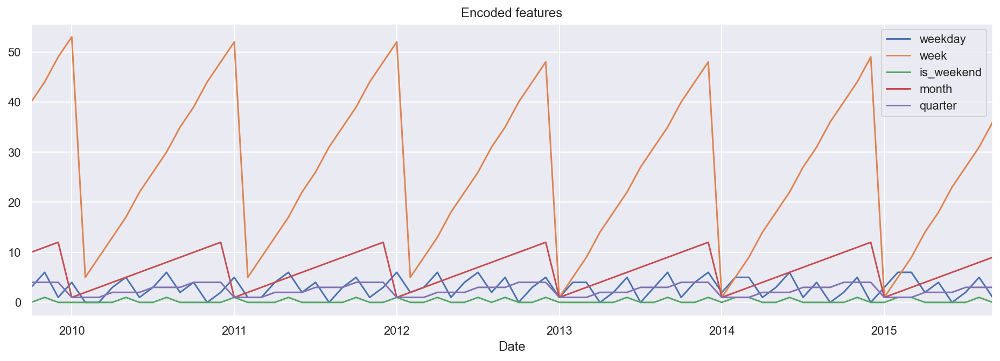

In [93]:
# Plotting date transformation

plt.figure(figsize=(16, 5))
plt.title("Encoded features")
data.weekday.plot(label="weekday")
#data.dayofweek.plot(label="dayofweek")
#data.dayofyear.plot(label="dayofyear")
#data.dayofmonth.plot(label="dayofmonth")
#data.weekofyear.plot(label="weekofyear")
data.week.plot(label="week")
data.is_weekend.plot(label="is_weekend")
data.month.plot(label="month")
data.quarter.plot(label="quarter")
#data.year.plot(label="year")
plt.legend()
plt.grid(True);

Since we have different scales of features and dates, let us scale everything into the same scale.

In [94]:
data.head()

,y,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,weekday,week,month,quarter,year,is_weekend
Date,,,,,,,,,,,,,,,,,,,
2009-10-01,338630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,40,10,4,2009,0
2009-11-01,339386,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,44,11,4,2009,1
2009-12-01,400264,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,49,12,4,2009,0
2010-01-01,314640,400264.0,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,53,1,1,2010,0
2010-02-01,311022,314640.0,400264.0,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,5,2,1,2010,0


##### Model 11: Regression with dates features <a class="anchor" id="reg_date"></a>

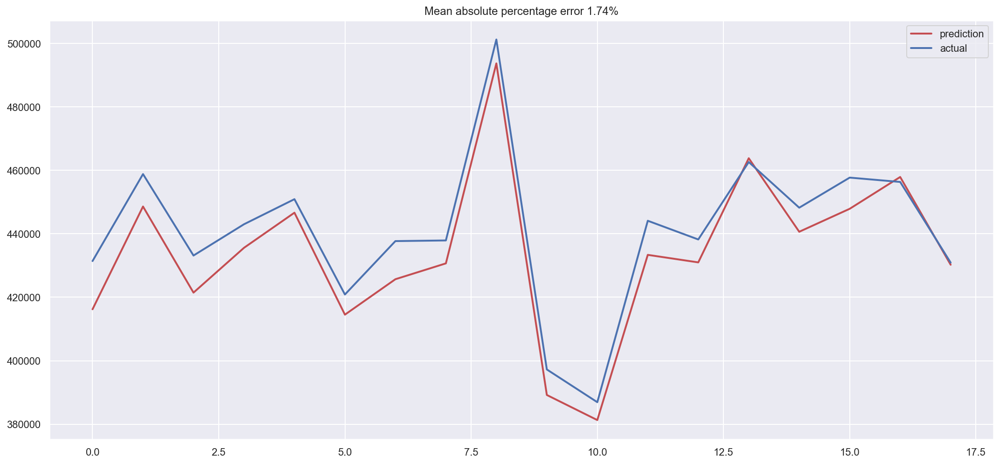

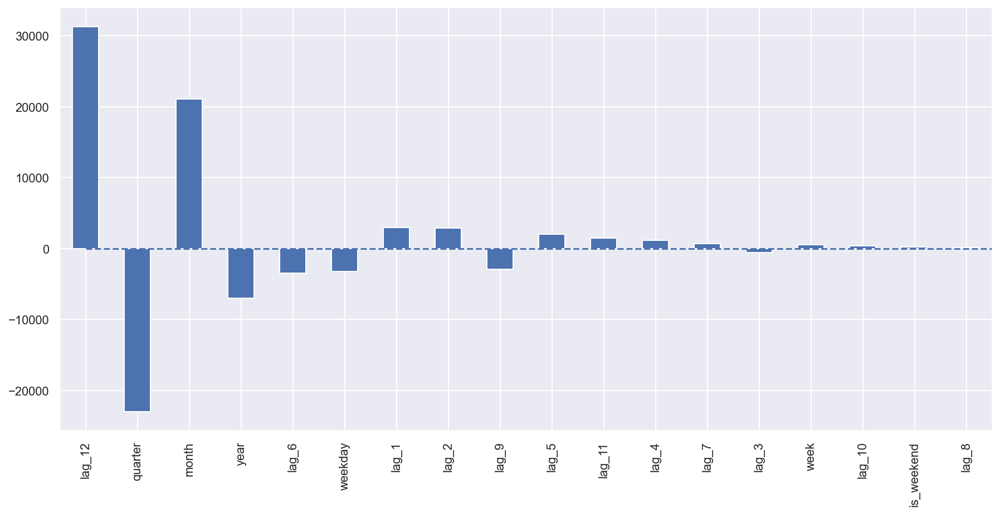

In [95]:
# Implement linear regression model

y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

date_features_model = LinearRegression()
date_features_model.fit(X_train_scaled, y_train)

plotModelResults(date_features_model, X_train=X_train_scaled, X_test=X_test_scaled)
plotCoefficients(date_features_model)

The new date indexs are used by the model to fit the regression model.

In [96]:
# Accuracy for the training dataset
date_features_model.score(X_train_scaled, y_train)

0.9784913723326975

In [97]:
# Model accuracy
date_features_model_ac = date_features_model.score(X_test_scaled, y_test)
date_features_model_ac

0.881195955075092

The accuracy has been lighty increased, it seems that the new features based on date index work.

In [98]:
# MSE calculation
pred = date_features_model.predict(X_test_scaled)
date_features_mse = mean_squared_error(y_test, pred)
date_features_mse

70073585.63092105

#### Model 12: Lasso with date features <a class="anchor" id="lasso_date"></a>

73.7772334429687
Accuracy: 0.9025336518113751


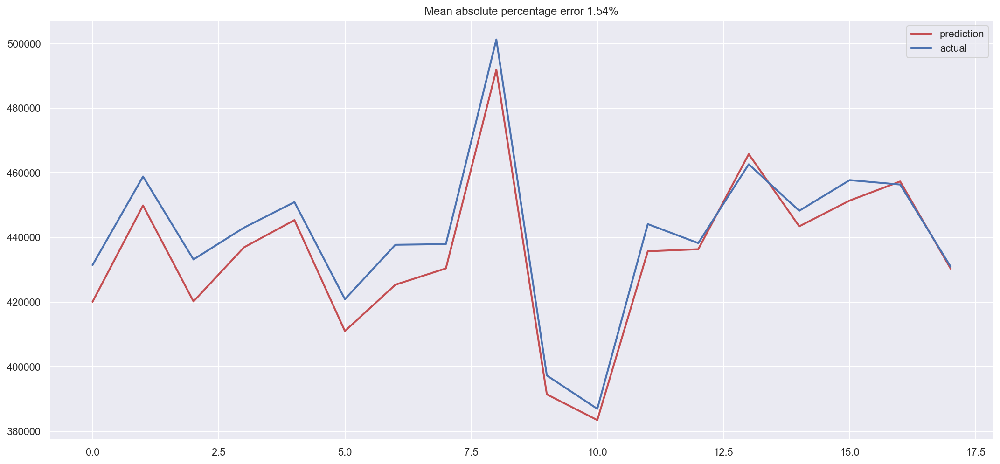

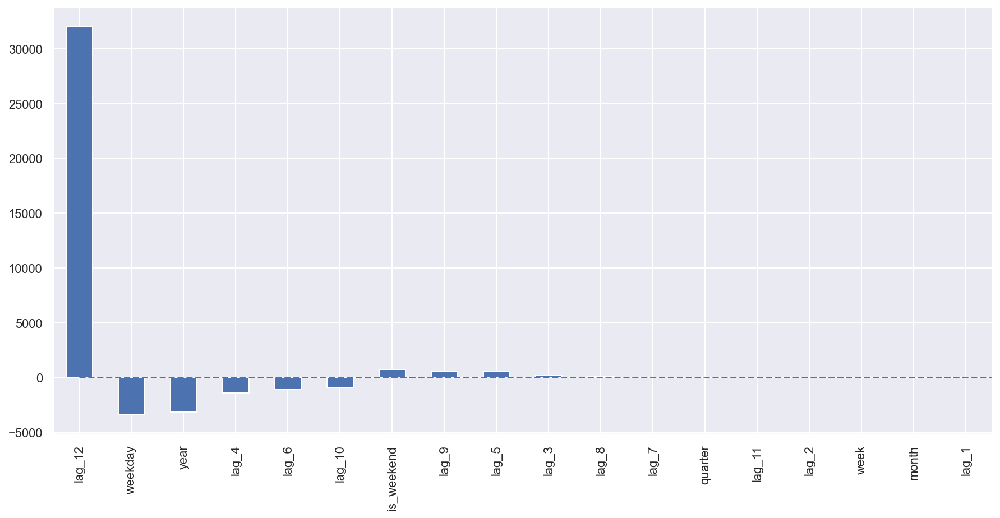

In [99]:
# Lasso: 10 cross validation performance
lassocv = LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
lassocv.fit(X_train_scaled, y_train)

alpha = lassocv.alpha_
print(alpha)

date_features_lasso_reg = Lasso(alpha=alpha)
date_features_lasso_reg.fit(X_train_scaled, y_train)

date_features_lasso_reg_acc = date_features_lasso_reg.score(X_test_scaled, y_test)
print('Accuracy: {}'.format(date_features_lasso_reg_acc))

plotModelResults(date_features_lasso_reg,
                X_train=X_train_scaled,
                X_test=X_test_scaled)
plotCoefficients(date_features_lasso_reg)

In [100]:
# MSE calculation
pred = date_features_lasso_reg.predict(X_test_scaled)
date_features_lasso_mse = mean_squared_error(y_test, pred)
date_features_lasso_mse

57488080.47946231

#### Model 13: Ridge with Data features <a class="anchor" id="ridge_date"></a>

ridge alpha coefficient: 0.03112260776901077
Accuracy: 0.876518929516558


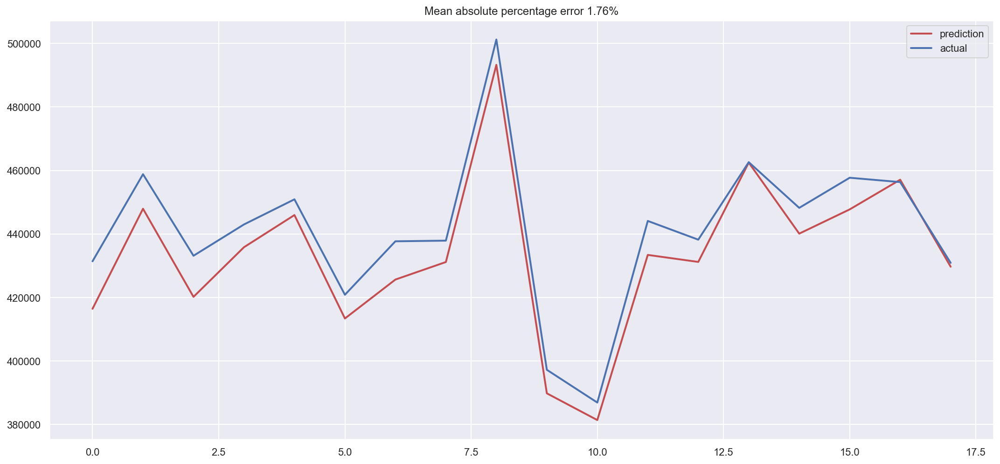

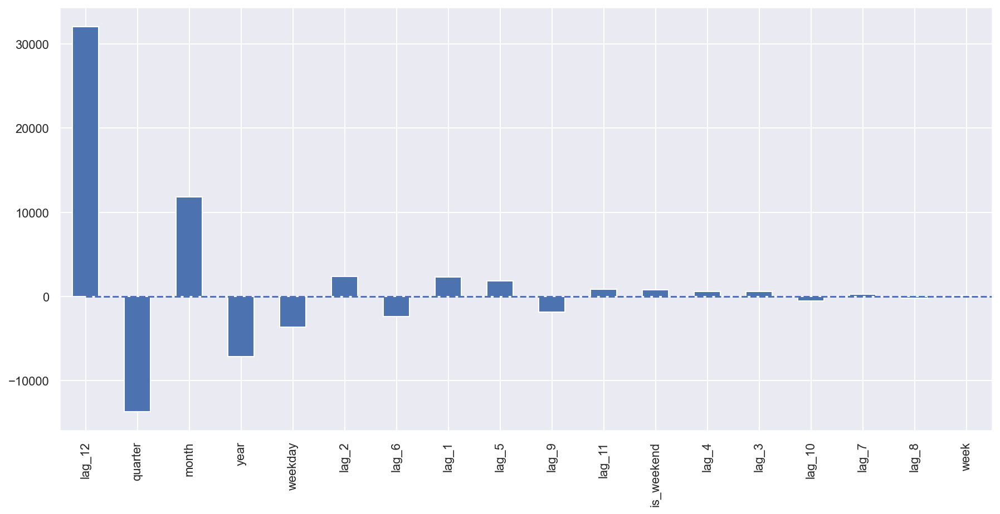

In [101]:
# Ridge

alphas = np.random.uniform(low=0, high=10, size=(50,))
ridgecv = RidgeCV(alphas=alphas, cv=10, normalize=True)
ridgecv.fit(X_train_scaled, y_train)

print('ridge alpha coefficient: {}'.format(ridgecv.alpha_))

date_features_ridge_reg = Ridge(alpha=ridgecv.alpha_)
date_features_ridge_reg.fit(X_train_scaled, y_train)

# Model accuracy
date_features_ridge_reg_acc = date_features_ridge_reg.score(X_test_scaled, y_test)
print('Accuracy: {}'.format(date_features_ridge_reg_acc))

date_features_ridge_reg.score(X_train_scaled, y_train)

plotModelResults(
    date_features_ridge_reg,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)
plotCoefficients(date_features_ridge_reg)

In [102]:
# MSE calculation
pred = date_features_ridge_reg.predict(X_test_scaled)
date_features_ridge_mse = mean_squared_error(y_test, pred)
date_features_ridge_mse

72832211.83073679

#### Model 14: Random Forest <a class="anchor" id="random_forest_date"></a>

In [103]:
rand_for_date = RandomForestRegressor(random_state=1)
rand_for_date.fit(X_train_scaled, y_train)

rand_for_date.score(X_train_scaled, y_train)

0.9835315370213559

In [104]:
rand_for_date_acc = rand_for_date.score(X_test_scaled, y_test)
rand_for_date_acc

0.8110005856132847

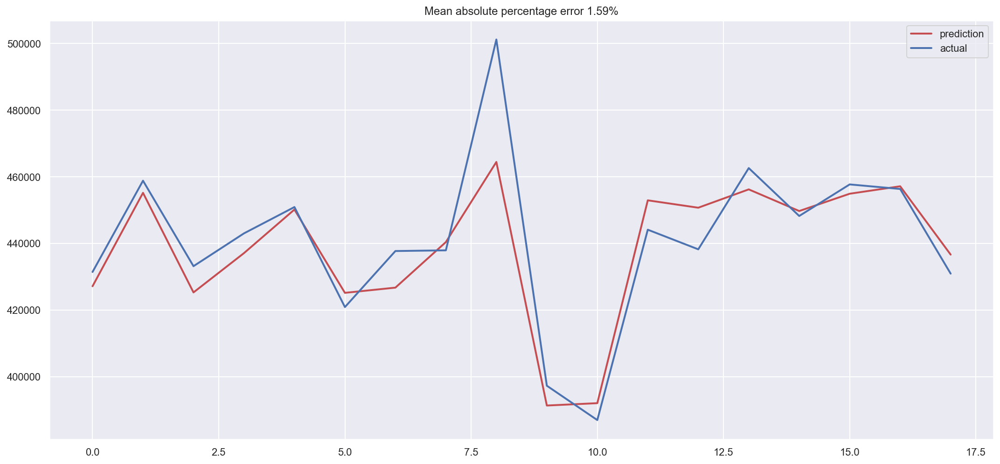

In [105]:
plotModelResults(
    rand_for_date,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)

In [106]:
# MSE calculation
pred = rand_for_date.predict(X_test_scaled)
rand_for_date_mse = mean_squared_error(y_test, pred)
rand_for_date_mse

111476563.41661114

#### Model 15: XGBoost <a class="anchor" id="xgboost_date"></a>

In [107]:
xgb_date = XGBRegressor()
xgb_date.fit(X_train_scaled, y_train,
       eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
       verbose=1000);

xgb_date.score(X_train_scaled, y_train)

[0]	validation_0-rmse:283884.28125	validation_1-rmse:324876.59375
[99]	validation_0-rmse:0.03917	validation_1-rmse:12551.92481


0.9999999999983155

In [108]:
# Model accuracy
xgb_date_acc = xgb_date.score(X_test_scaled, y_test)
xgb_date_acc

0.7328854583800678

In [109]:
# MSE calculation
pred = xgb_date.predict(X_test_scaled)
xgb_date_mse = mean_squared_error(y_test, pred)
xgb_date_mse

157550811.6520725

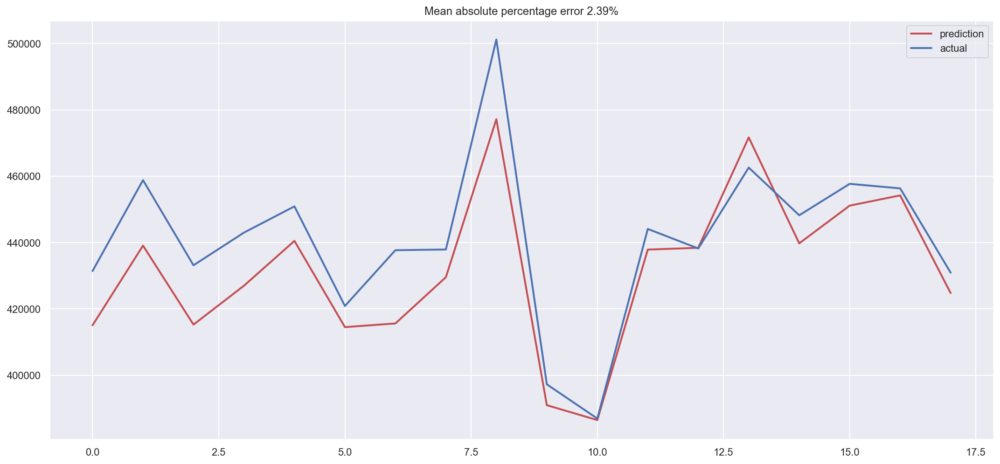

In [110]:
plotModelResults(
    xgb_date,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
)

### 3. Target encoding <a class="anchor" id="target"></a>

We can encode using the mean value of the target variable. In this case, for weekday, week, month, quarter and years.

In [111]:
# Computing means
def code_mean(data, cat_feature, real_feature):
    """
       Returns a dictionary where keys are unique categories of the cat_feature
       and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

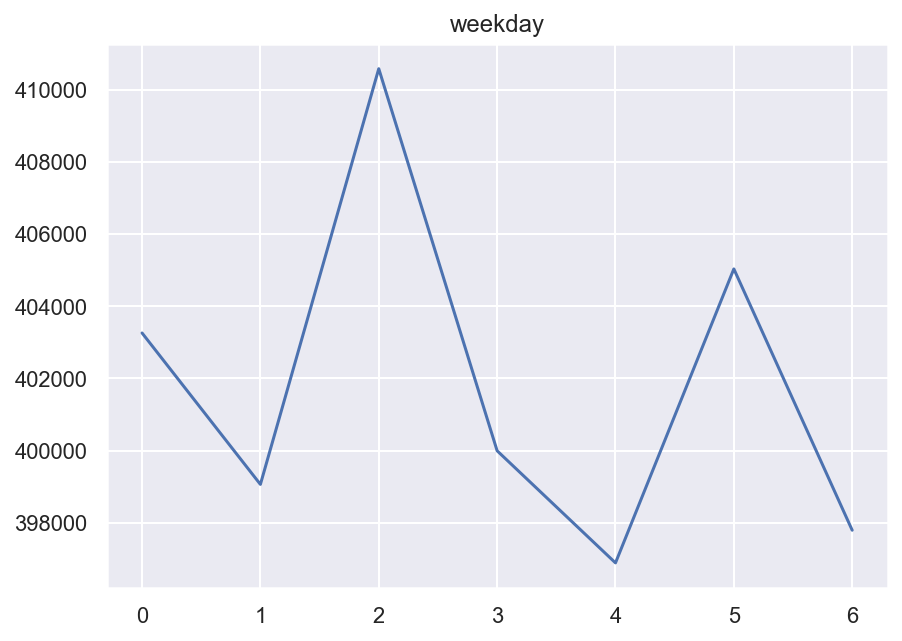

In [112]:
# Average by weekday

average_weekday = code_mean(data, "weekday", "y")

# Plotting
plt.figure(figsize=(7,5))
lists = sorted(average_weekday.items())  # sorted by key, return a list of tuples
x, y = zip(*lists)
plt.plot(x, y)
plt.title("weekday")
plt.grid(True)
plt.show()

In terms of sales, there are two pics on Wednesdays and Saturdays.

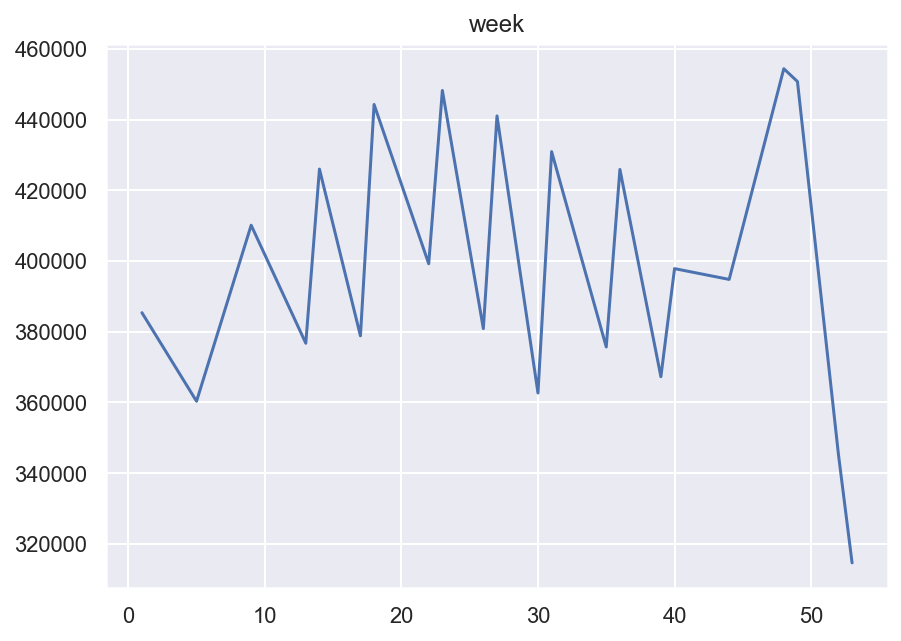

In [113]:
# Average by week

average_week = code_mean(data, "week", "y")

# Plotting
plt.figure(figsize=(7,5))
lists = sorted(average_week.items())  # sorted by key, return a list of tuples
x, y = zip(*lists)
plt.plot(x, y)
plt.title("week")
plt.grid(True)
plt.show()

There are two pics of sales: on summer and Christmas time.

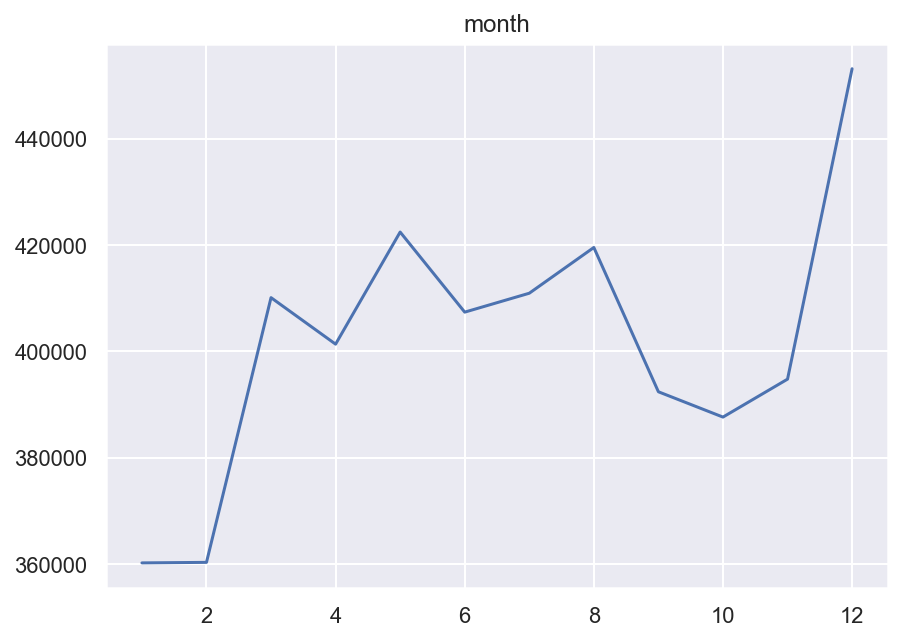

In [114]:
# Average fby month

average_month = code_mean(data, "month", "y")

# Plotting
plt.figure(figsize=(7,5))
lists = sorted(average_month.items())  # sorted by key, return a list of tuples
x, y = zip(*lists)
plt.plot(x, y)
plt.title("month")
plt.grid(True)
plt.show()

December is clearly the best month.

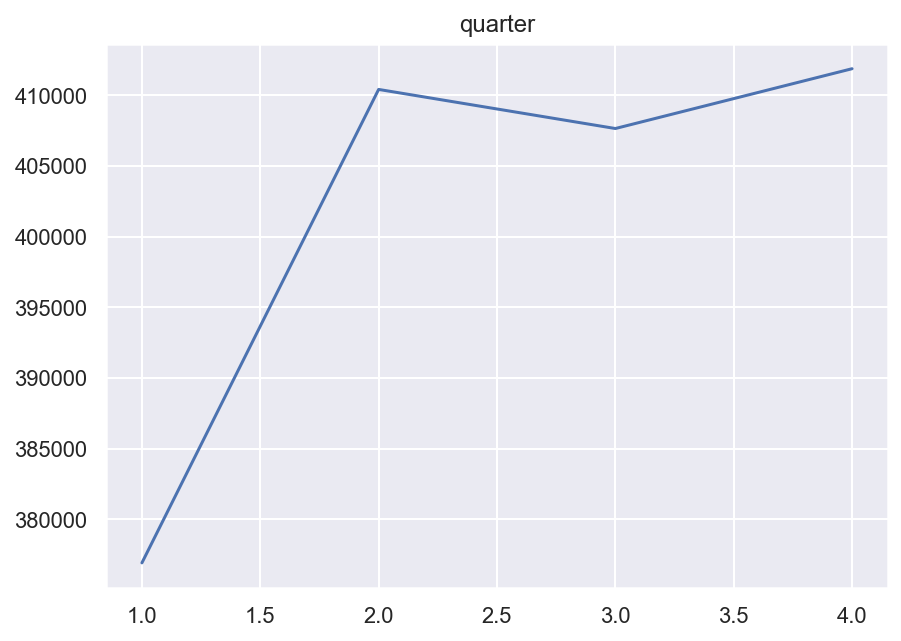

In [115]:
# Average by quarters

average_quarter = code_mean(data, "quarter", "y")

# Plotting
plt.figure(figsize=(7,5))
lists = sorted(average_quarter.items())  # sorted by key, return a list of tuples
x, y = zip(*lists)
plt.plot(x, y)
plt.title("quarter")
plt.grid(True)
plt.show()

There are more sales during the 4th quarter.

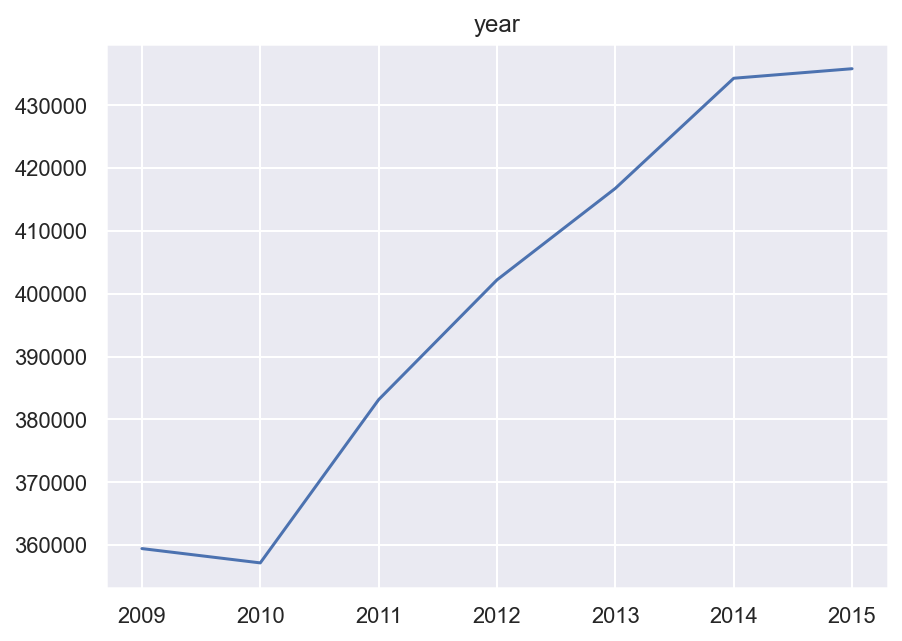

In [116]:
# Average by year

average_year = code_mean(data, "year", "y")

# Plotting
plt.figure(figsize=(7,5))
lists = sorted(average_year.items())  # sorted by key, return a list of tuples
x, y = zip(*lists)
plt.plot(x, y)
plt.title("year")
plt.grid(True)
plt.show()

This result confirms waht we have already seen looking at the trend.

In [117]:
# Now, we add the averages as new features

data_target_encoding = data.copy()

test_size = 0.30
test_index = int(len(data_target_encoding.dropna()) * (1 - test_size))
data_target_encoding["weekday_average"] = list(
    map(code_mean(data_target_encoding[:test_index], "weekday", "y").get, data_target_encoding.weekday)
)
data_target_encoding["week_average"] = list(
    map(code_mean(data_target_encoding[:test_index], "week", "y").get, data_target_encoding.week)
)
data_target_encoding["month_average"] = list(
    map(code_mean(data_target_encoding[:test_index], "month", "y").get, data_target_encoding.month)
)
data_target_encoding["quarter_average"] = list(
    map(code_mean(data_target_encoding[:test_index], "quarter", "y").get, data_target_encoding.quarter)
)
data_target_encoding["year_average"] = list(
    map(code_mean(data_target_encoding[:test_index], "year", "y").get, data_target_encoding.year)
)

# drop encoded variables
data_target_encoding.drop(["weekday", "week", "month", "quarter", "year"], axis=1, inplace=True)

In [118]:
data_target_encoding.head()

,y,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,is_weekend,weekday_average,week_average,month_average,quarter_average,year_average
Date,,,,,,,,,,,,,,,,,,,
2009-10-01,338630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,386992.571429,368985.50,368136.75,393366.333333,359426.666667
2009-11-01,339386,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,373025.166667,376817.00,376817.00,393366.333333,359426.666667
2009-12-01,400264,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,381235.571429,400264.00,435145.25,393366.333333,359426.666667
2010-01-01,314640,400264.0,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,375968.285714,314640.00,345210.75,363291.833333,357148.500000
2010-02-01,311022,314640.0,400264.0,339386.0,338630.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,366307.800000,348708.75,348708.75,363291.833333,357148.500000


#### Model 16: Regression with average encoding <a class="anchor" id="reg_target"></a>

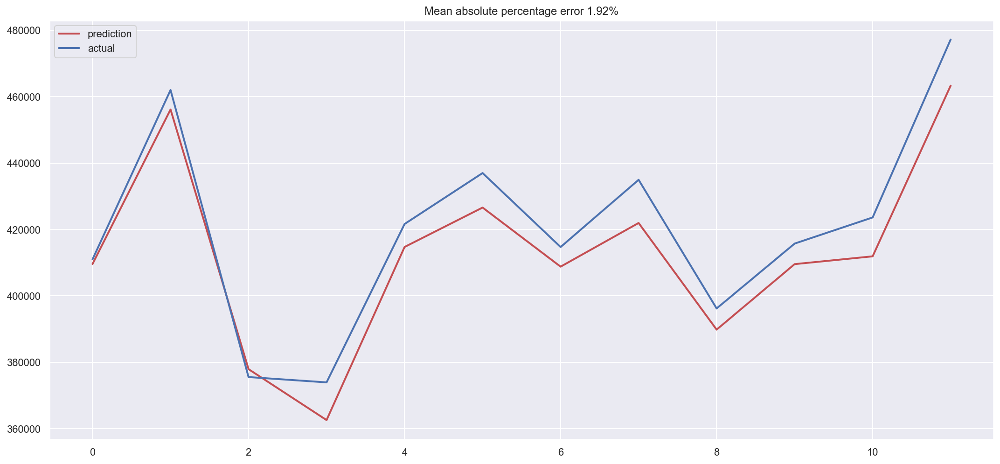

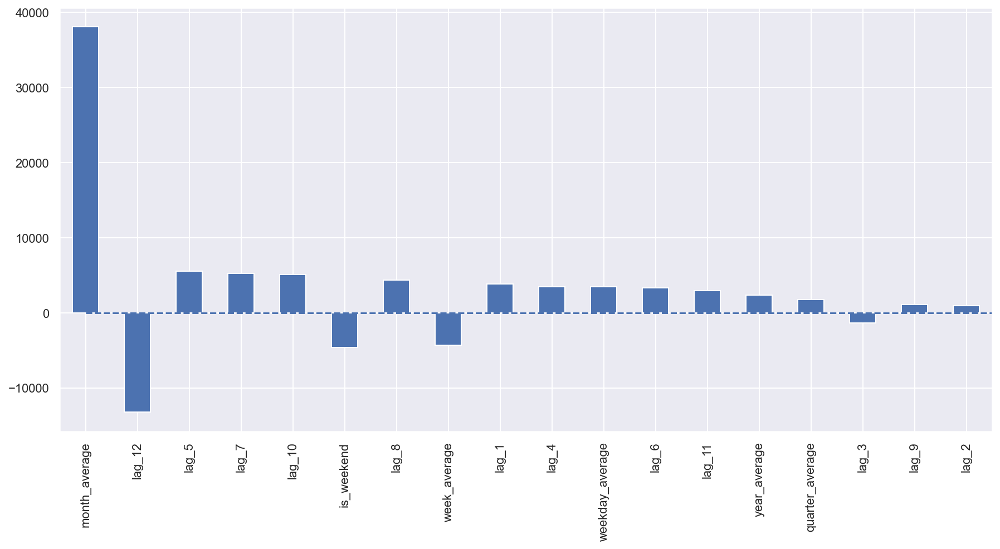

In [119]:
# Splitting dataset and implementing the model
y = data_target_encoding.dropna().y
X = data_target_encoding.dropna().drop(["y"], axis=1)
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=test_size)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

target_coding_reg = LinearRegression()
target_coding_reg.fit(X_train_scaled, y_train)

plotModelResults(
    target_coding_reg,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)

plotCoefficients(target_coding_reg)

month_average is used by the model, but the MAPE is increased up to 1.9%.

The model gives more important to the month_average feature than the others. Is there overfitting?

In [120]:
target_coding_reg.score(X_train_scaled, y_train)

0.9960384685555361

In [121]:
target_coding_reg_acc = target_coding_reg.score(X_test_scaled, y_test)
target_coding_reg_acc

0.9091953368676648

Indeed, there is still overfitting. Let us apply regularization techniques to try to reduce it. On the other hand, the accuracy has been increased.

In [122]:
# MSE calculation
pred = target_coding_reg.predict(X_test_scaled)
target_encoding_mse = mean_squared_error(y_test, pred)
target_encoding_mse

78357863.8102468

##### Model 17: Lasso with average encoding <a class="anchor" id="lasso_target"></a>

In [123]:
# We reject the target encoding method due to the results

y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [124]:
# 10 cross validation performance
target_encoding_lasso_reg = LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
target_encoding_lasso_reg.fit(X_train_scaled, y_train)

LassoCV(cv=10, max_iter=100000, normalize=True)

In [125]:
alpha = lassocv.alpha_
alpha

73.7772334429687

In [126]:
target_encoding_lasso_reg = Lasso(alpha=alpha)
target_encoding_lasso_reg.fit(X_train_scaled, y_train)

Lasso(alpha=73.7772334429687)

In [127]:
target_encoding_lasso_reg_acc = target_encoding_lasso_reg.score(X_test_scaled, y_test)
target_encoding_lasso_reg_acc

0.9025336518113751

The accuracy has not been improved.

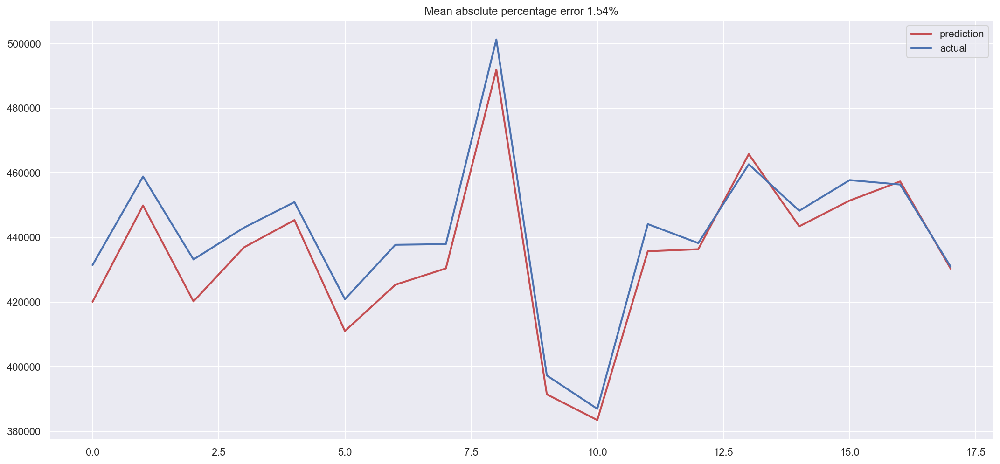

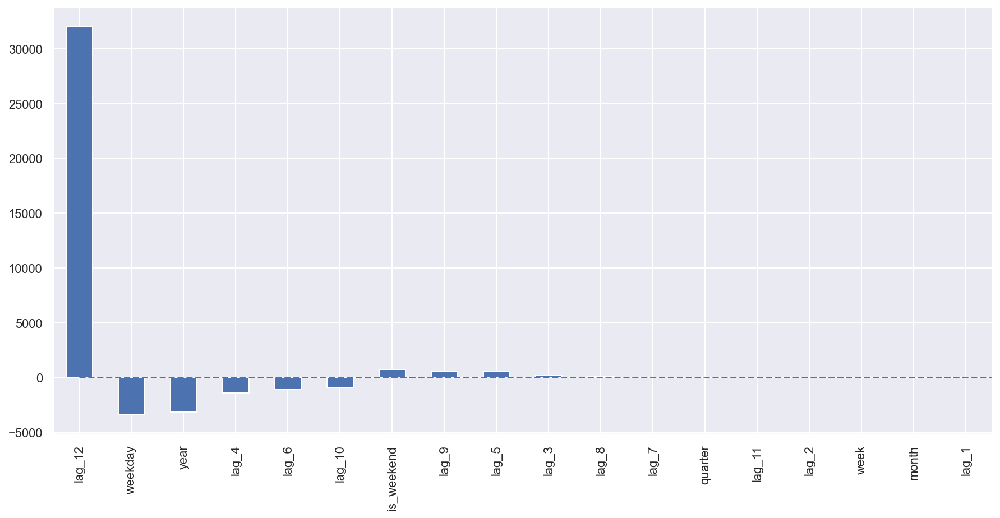

In [128]:
plotModelResults(
    target_encoding_lasso_reg,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)
plotCoefficients(target_encoding_lasso_reg)

There is improvement, the MAPE is 1.5%.

In [129]:
# MSE calculation
pred = target_encoding_lasso_reg.predict(X_test_scaled)
target_encoding_lasso_mse = mean_squared_error(y_test, pred)
target_encoding_lasso_mse

57488080.47946231

#### Model 18: Ridge with average encoding <a class="anchor" id="ridge_target"></a>

In [130]:
# We use an array of random values to find the best alpha
alphas = np.random.uniform(low=0, high=10, size=(50,))
target_encoding_ridge_reg = RidgeCV(alphas=alphas, cv=10, normalize=True)
target_encoding_ridge_reg.fit(X_train_scaled, y_train)

RidgeCV(alphas=array([5.67399855e+00, 7.04084072e+00, 1.37441158e+00, 1.45359416e-01,
       9.91414972e+00, 1.44915253e+00, 8.20294569e+00, 2.36474011e+00,
       3.35918448e+00, 4.54738421e+00, 8.02556442e+00, 4.83999557e+00,
       3.53523256e-01, 1.63497342e+00, 9.63810660e+00, 8.71663565e+00,
       1.28385313e+00, 9.82548044e+00, 4.41412693e-01, 6.99229468e+00,
       1.18610375e+00, 5.95007344e+0...
       2.73369903e+00, 5.35778869e+00, 1.75300053e+00, 3.60008259e+00,
       6.80427269e+00, 5.71717081e+00, 5.78583800e+00, 7.28093052e+00,
       4.34327774e+00, 7.51342267e+00, 9.74814978e+00, 4.47509471e+00,
       4.94672553e+00, 8.16912809e-01, 8.08109369e-03, 5.17882654e+00,
       3.50388275e+00, 6.24480755e+00, 1.00270412e+00, 3.92555100e+00,
       6.50299814e+00, 8.40255041e+00]),
        cv=10, normalize=True)

In [131]:
ridgecv.alpha_

0.03112260776901077

In [132]:
target_encoding_ridge_reg = Ridge(alpha=ridgecv.alpha_)
target_encoding_ridge_reg.fit(X_train_scaled, y_train)

Ridge(alpha=0.03112260776901077)

In [133]:
# Model accuracy
target_encoding_ridge_reg_acc = target_encoding_ridge_reg.score(X_test_scaled, y_test)
target_encoding_ridge_reg_acc

0.876518929516558

In [134]:
target_encoding_ridge_reg.score(X_train_scaled, y_train)

0.9783156724777862

The accuracy has been increased and the overfitting has been reduced.

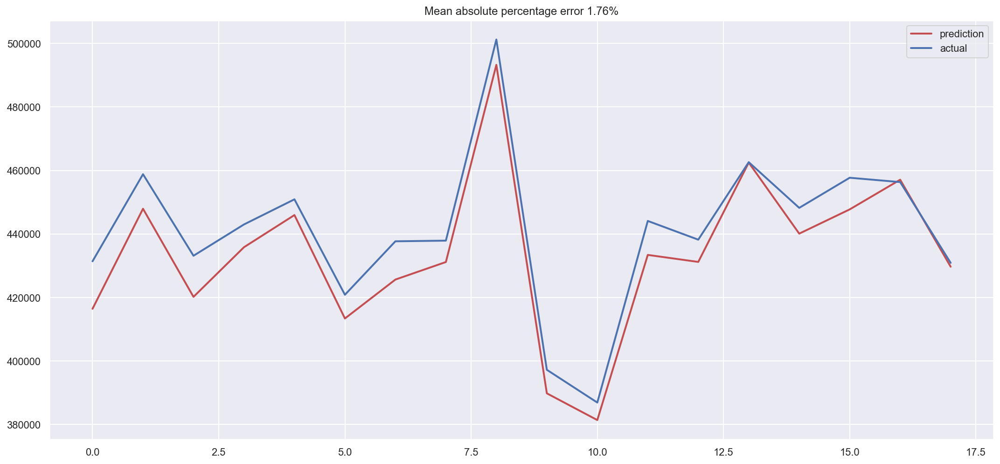

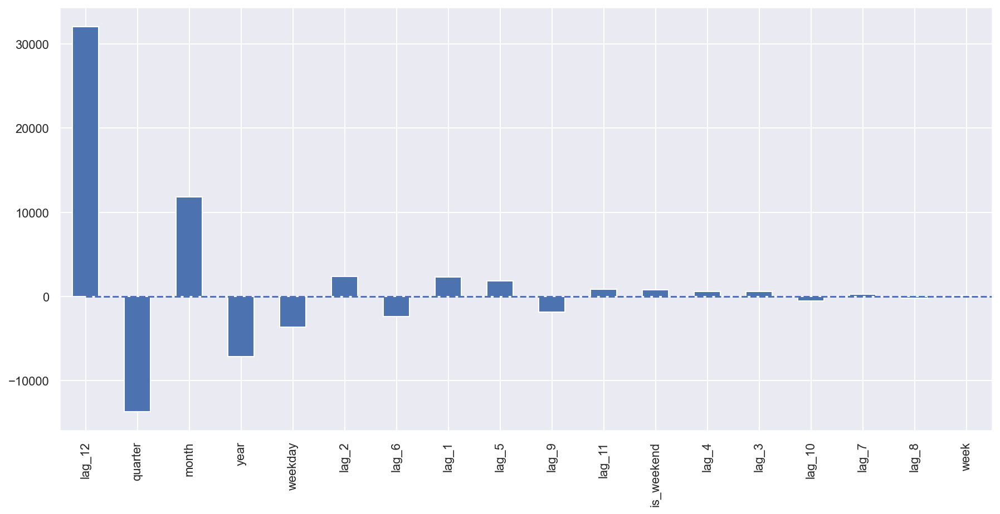

In [135]:
plotModelResults(
    target_encoding_ridge_reg,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)
plotCoefficients(target_encoding_ridge_reg)

Both accuracy and MAPE have not been improved.

In [136]:
# MSE calculation
pred = target_encoding_ridge_reg.predict(X_test_scaled)
target_encoding_ridge_mse = mean_squared_error(y_test, pred)
target_encoding_ridge_mse

72832211.83073679

#### Model 19: Random Forest <a class="anchor" id="random_forest_target"></a>

In [137]:
rand_for_target = RandomForestRegressor(random_state=1)
rand_for_target.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=1)

In [138]:
rand_for_target.score(X_train_scaled, y_train)

0.9835315370213559

In [139]:
rand_for_target_acc = rand_for_target.score(X_test_scaled, y_test)
rand_for_target_acc

0.8110005856132847

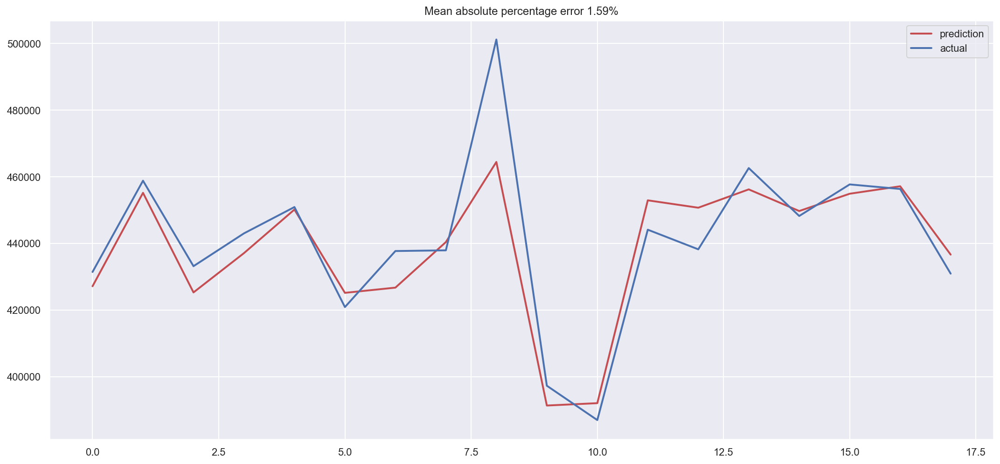

In [140]:
plotModelResults(
    rand_for_target,
    X_train=X_train_scaled,
    X_test=X_test_scaled
)

Both accuracy and MAPE are the same.

In [141]:
# MSE calculation
pred = rand_for_target.predict(X_test_scaled)
rand_for_target_mse = mean_squared_error(y_test, pred)
rand_for_target_mse

111476563.41661114

#### Model 20: XGBoost <a class="anchor" id="xgboost_target"></a>

In [142]:
# We use the data processed with time series lags and dat features methods because they give us the best accuracy
data.columns

Index(['y', 'lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
       'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12', 'weekday', 'week',
       'month', 'quarter', 'year', 'is_weekend'],
      dtype='object')

In [143]:
feat = ['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
       'lag_8', 'lag_9', 'lag_10', 'lag_11', 'lag_12', 'weekday', 'week',
       'month', 'quarter', 'year', 'is_weekend']

In [144]:
xgb_target = XGBRegressor()
xgb_target.fit(X_train_scaled, y_train,
       eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
       verbose=1000);

[0]	validation_0-rmse:283884.28125	validation_1-rmse:324876.59375
[99]	validation_0-rmse:0.03917	validation_1-rmse:12551.92383


In [145]:
xgb_target.score(X_train_scaled, y_train)

0.9999999999983155

In [146]:
# Model accuracy
xgb_target_acc = xgb_target.score(X_test_scaled, y_test)
xgb_target_acc

0.7328854583800678

In [147]:
# MSE calculation
pred = xgb_target.predict(X_test_scaled)
xgb_target_mse = mean_squared_error(y_test, pred)
xgb_target_mse

157550811.6520725

There is overfitting.

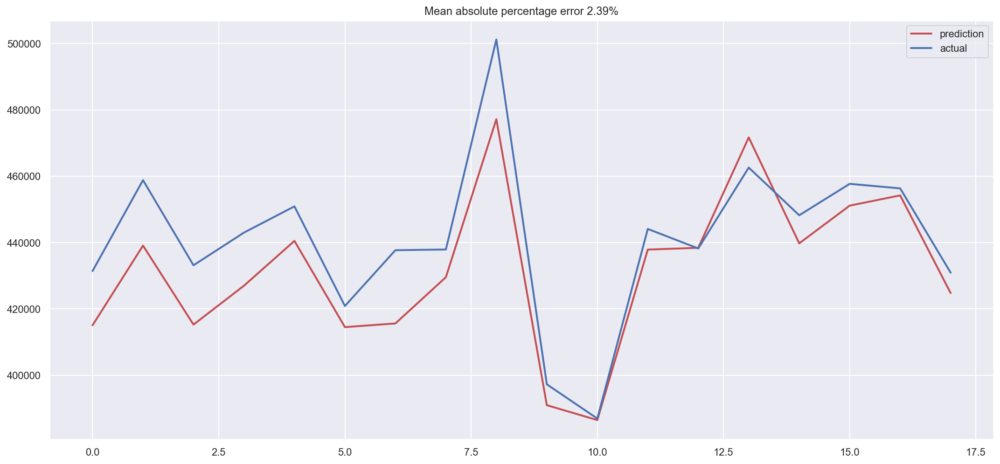

In [148]:
plotModelResults(
    xgb_target,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
)

In [149]:
# Feature importance on xgboost
xgb_target.get_booster().feature_names

['f0',
 'f1',
 'f2',
 'f3',
 'f4',
 'f5',
 'f6',
 'f7',
 'f8',
 'f9',
 'f10',
 'f11',
 'f12',
 'f13',
 'f14',
 'f15',
 'f16',
 'f17']

In [150]:
fi = pd.DataFrame(data=xgb_target.feature_importances_,
            index=feat,
            columns=['importance'])

<Figure size 864x432 with 0 Axes>

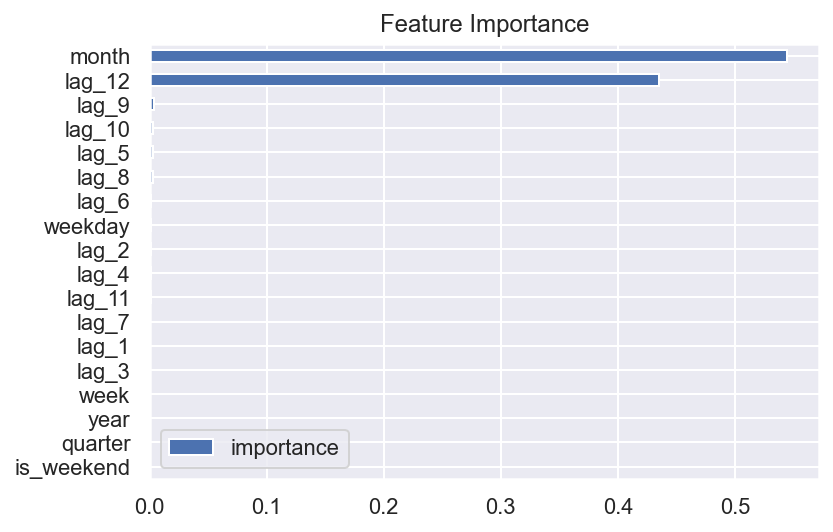

In [151]:
# Plot feature importance
plt.figure(figsize=(12, 6))
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

The model has used mainly lag_12 and week_average as features to make the regression.

In [152]:
# Forecast
prediction = xgb_target.predict(X_test_scaled)
prediction

array([415056.4 , 439087.06, 415261.34, 426991.6 , 440500.5 , 414506.38,
       415610.97, 429555.03, 477204.9 , 390968.  , 386477.16, 437883.03,
       438420.4 , 471700.3 , 439762.53, 451142.56, 454220.94, 424758.34],
      dtype=float32)

In [153]:
len_pred = len(prediction)

In [154]:
prediction = pd.DataFrame(data=prediction,
                          index = data[-len_pred:].index,
                         columns=['prediction'])
prediction

,prediction
Date,
2014-04-01,415056.40625
2014-05-01,439087.06250
2014-06-01,415261.34375
2014-07-01,426991.59375
2014-08-01,440500.50000
2014-09-01,414506.37500
2014-10-01,415610.96875
2014-11-01,429555.03125
2014-12-01,477204.90625


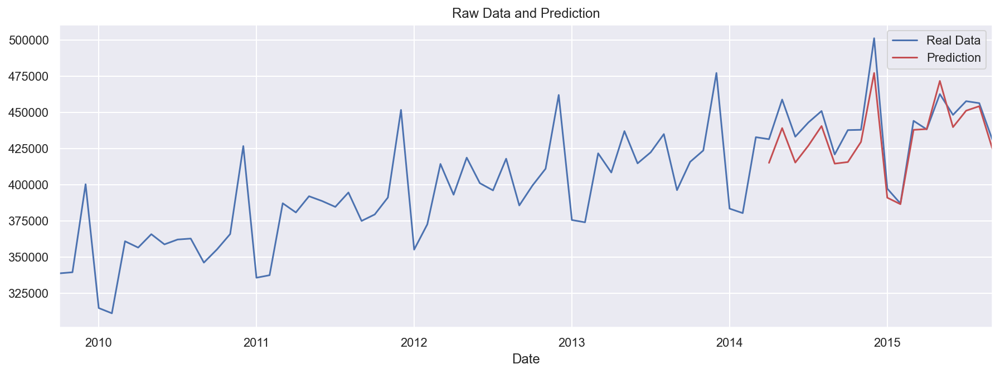

In [155]:
# Plot forecasting
ax = data[['y']].plot(figsize=(15,5))
prediction[['prediction']].plot(ax=ax, style="r-")
plt.legend(['Real Data', 'Prediction'])
ax.set_title('Raw Data and Prediction')
plt.show()

In [156]:
# Calculate error
prediction['error'] = np.abs(data['y'][-len_pred:] - prediction['prediction'])
prediction

,prediction,error
Date,,
2014-04-01,415056.40625,16358.59375
2014-05-01,439087.06250,19734.93750
2014-06-01,415261.34375,17890.65625
2014-07-01,426991.59375,16013.40625
2014-08-01,440500.50000,10412.50000
2014-09-01,414506.37500,6364.62500
2014-10-01,415610.96875,22091.03125
2014-11-01,429555.03125,8354.96875
2014-12-01,477204.90625,24027.09375


### Time Series Cross Validation <a class="anchor" id="cv1"></a>

Let us introduce cross validation to improve the accuracy of our models.

In [157]:
tss = TimeSeriesSplit(n_splits=5)
data = data.sort_index()

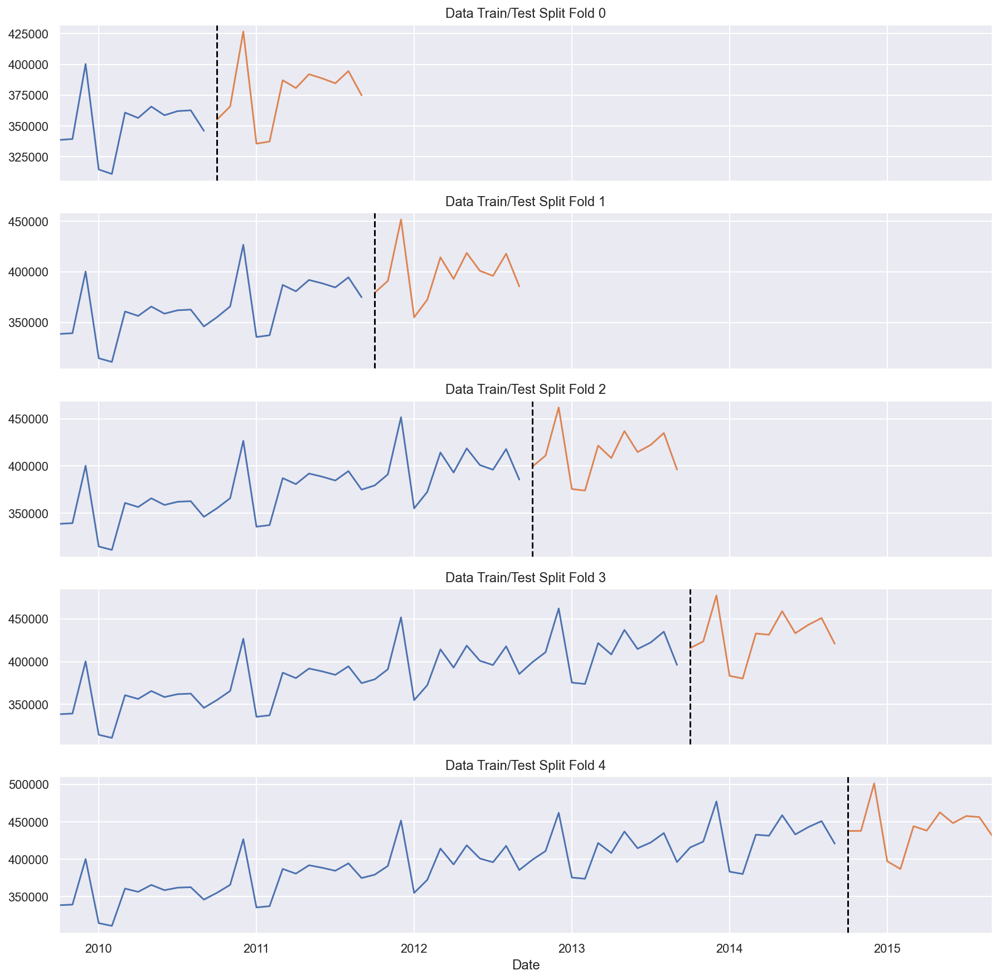

In [158]:
# Visualize Time Series Cross Validation
fig, axs = plt.subplots(5, 1, figsize=(15,15), sharex=True)

fold=0
for train_idx, val_idx in tss.split(data):
    train = data.iloc[train_idx]
    test = data.iloc[val_idx]
    train['y'].plot(ax=axs[fold], label='Training Set', title=f'Data Train/Test Split Fold {fold}')
    test['y'].plot(ax=axs[fold], label='test Set')
    axs[fold].axvline(test.index.min(), color='black', ls='--')
    fold +=1
    

In [159]:
train_idx

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59])

In [160]:
val_idx

array([60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71])

In [161]:
# Train using cross validation

fold = 0
preds = []
scores = []
for train_idx, val_idx in tss.split(data):
    train = data.iloc[train_idx]
    test = data.iloc[val_idx]

    # Model
    model = XGBRegressor(base_score=0.5,
                            booster='gbtree',
                            n_estimators=5000,
                            #early_stopping_rounds=50,
                            objective='reg:squarederror',
                            max_depth=3,
                            learning_rate=0.01)
    model.fit(X_train_scaled, y_train,
             eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
              verbose=1000)
    y_pred = model.predict(X_test_scaled)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred))
    scores.append(score)

[0]	validation_0-rmse:396521.40625	validation_1-rmse:437737.62500
[1000]	validation_0-rmse:880.75647	validation_1-rmse:11062.39551
[2000]	validation_0-rmse:91.34151	validation_1-rmse:10788.40234
[3000]	validation_0-rmse:12.02446	validation_1-rmse:10758.30469
[4000]	validation_0-rmse:3.50965	validation_1-rmse:10755.35449
[4999]	validation_0-rmse:3.50965	validation_1-rmse:10755.35352
[0]	validation_0-rmse:396521.40625	validation_1-rmse:437737.62500
[1000]	validation_0-rmse:880.75653	validation_1-rmse:11062.39551
[2000]	validation_0-rmse:91.34151	validation_1-rmse:10788.40332
[3000]	validation_0-rmse:12.02446	validation_1-rmse:10758.30469
[4000]	validation_0-rmse:3.50965	validation_1-rmse:10755.35352
[4999]	validation_0-rmse:3.50965	validation_1-rmse:10755.35352
[0]	validation_0-rmse:396521.40625	validation_1-rmse:437737.62500
[1000]	validation_0-rmse:880.75647	validation_1-rmse:11062.39551
[2000]	validation_0-rmse:91.34151	validation_1-rmse:10788.40234
[3000]	validation_0-rmse:12.02446	v

In [162]:
scores

[10755.35361653287,
 10755.35361653287,
 10755.35361653287,
 10755.35361653287,
 10755.35361653287]

In [163]:
print(f'Scores scross folds {np.mean(scores):0.4f}')

Scores scross folds 10755.3536


In [164]:
# Forecasting with cross validation

xgb_new = XGBRegressor(base_score=0.5,
                            booster='gbtree',
                            n_estimators=5000,
                            #early_stopping_rounds=50,
                            objective='reg:squarederror',
                            max_depth=3,
                            learning_rate=0.01)
xgb_new.fit(X_train_scaled, y_train,
             eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
              verbose=1000)
y_pred = model.predict(X_test_scaled)

[0]	validation_0-rmse:396521.40625	validation_1-rmse:437737.62500
[1000]	validation_0-rmse:880.75647	validation_1-rmse:11062.39551
[2000]	validation_0-rmse:91.34151	validation_1-rmse:10788.40332
[3000]	validation_0-rmse:12.02446	validation_1-rmse:10758.30469
[4000]	validation_0-rmse:3.50965	validation_1-rmse:10755.35352
[4999]	validation_0-rmse:3.50965	validation_1-rmse:10755.35352


              prediction
Date                    
2014-04-01  416758.46875
2014-05-01  444178.71875
2014-06-01  417520.78125
2014-07-01  434426.68750
2014-08-01  445326.12500
2014-09-01  414534.90625
2014-10-01  417944.56250
2014-11-01  431376.46875
2014-12-01  475427.43750
2015-01-01  391469.65625
2015-02-01  387561.87500
2015-03-01  444956.84375
2015-04-01  441112.46875
2015-05-01  470813.59375
2015-06-01  444935.65625
2015-07-01  459844.15625
2015-08-01  459654.50000
2015-09-01  425604.34375


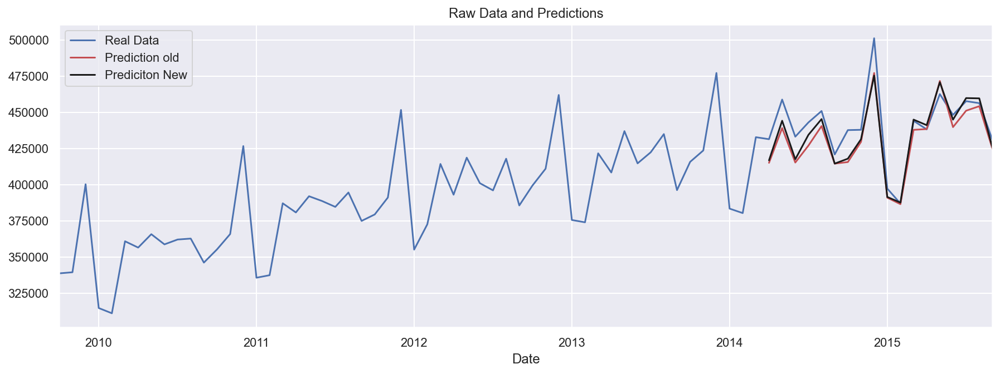

In [165]:
prediction_new = pd.DataFrame(data=y_pred,
                          index = data[-len_pred:].index,
                         columns=['prediction'])
print(prediction_new)

# Plot forecasting
ax = data[['y']].plot(figsize=(15,5))
prediction[['prediction']].plot(ax=ax, style="r-")
prediction_new[['prediction']].plot(ax=ax, style="k-")
plt.legend(['Real Data', 'Prediction old', 'Prediciton New'])
ax.set_title('Raw Data and Predictions')
plt.show()

Graphically, both predictions are the same.

In [166]:
# Calculate error
prediction_new['error'] = np.abs(data['y'][-len_pred:] - prediction_new['prediction'])
prediction_new

,prediction,error
Date,,
2014-04-01,416758.46875,14656.53125
2014-05-01,444178.71875,14643.28125
2014-06-01,417520.78125,15631.21875
2014-07-01,434426.68750,8578.31250
2014-08-01,445326.12500,5586.87500
2014-09-01,414534.90625,6336.09375
2014-10-01,417944.56250,19757.43750
2014-11-01,431376.46875,6533.53125
2014-12-01,475427.43750,25804.56250


In [167]:
# Model accuracy
xgb_new_acc = xgb_new.score(X_test_scaled, y_test)
xgb_new_acc

0.8038780177167312

In [168]:
# Mean Squared Error between real data and predictions
xgb_new_mse = mean_squared_error(data['y'][-len_pred:], y_pred)
xgb_new_mse

115677631.41666667

### Model 17: Prophet [5] <a class="anchor" id="prophet"></a>

In [169]:
# Install library
#!pip install prophet

In [170]:
import logging

#from fbprophet import Prophet
from prophet import Prophet

logging.getLogger().setLevel(logging.ERROR)

In [171]:
# Convert dataframe into the format required by Prophet
df = sales['Sales_Dollars'].reset_index()
df.columns = ["ds", "y"]
# Converting timezones (issue https://github.com/facebook/prophet/issues/831)
#df["ds"] = df["ds"].dt.tz_convert(None)
df.tail()

,ds,y
67,2015-05-01,462615
68,2015-06-01,448229
69,2015-07-01,457710
70,2015-08-01,456340
71,2015-09-01,430917


In [172]:
# Splitting data between historical and prediction parts
prediction_size = int(len(df)*test_size) # we select the same test size used in the others models
print(prediction_size)
train_df = df[:-prediction_size]
train_df.tail()

21


,ds,y
46,2013-08-01,434950
47,2013-09-01,396199
48,2013-10-01,415740
49,2013-11-01,423611
50,2013-12-01,477205


In [173]:
# Now we built the Prophet object
prophet_model = Prophet()
prophet_model.fit(train_df);

11:33:39 - cmdstanpy - INFO - Chain [1] start processing
11:33:39 - cmdstanpy - INFO - Chain [1] done processing


In [174]:
# We create a dataframe which will contain all dates from the history 
future = prophet_model.make_future_dataframe(periods=prediction_size, freq='MS')
future.tail()

,ds
67,2015-05-01
68,2015-06-01
69,2015-07-01
70,2015-08-01
71,2015-09-01


In [175]:
# We make prediction: yhat
forecast = prophet_model.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
67,2015-05-01,447984.878136,451538.038263,460071.937564,445724.056221,450289.957300,7874.813902,7874.813902,7874.813902,7874.813902,7874.813902,7874.813902,0.0,0.0,0.0,455859.692038
68,2015-06-01,449284.842617,447045.154009,456043.138841,446787.311793,451816.442260,2413.386259,2413.386259,2413.386259,2413.386259,2413.386259,2413.386259,0.0,0.0,0.0,451698.228875
69,2015-07-01,450542.872759,447176.659984,455898.696937,447823.737766,453290.318713,1014.339320,1014.339320,1014.339320,1014.339320,1014.339320,1014.339320,0.0,0.0,0.0,451557.212079
70,2015-08-01,451842.837239,450391.557357,459635.507997,448868.208742,454828.531239,3249.568375,3249.568375,3249.568375,3249.568375,3249.568375,3249.568375,0.0,0.0,0.0,455092.405614
71,2015-09-01,453142.801719,432137.053094,441705.971375,449877.467937,456360.876986,-16269.221672,-16269.221672,-16269.221672,-16269.221672,-16269.221672,-16269.221672,0.0,0.0,0.0,436873.580047


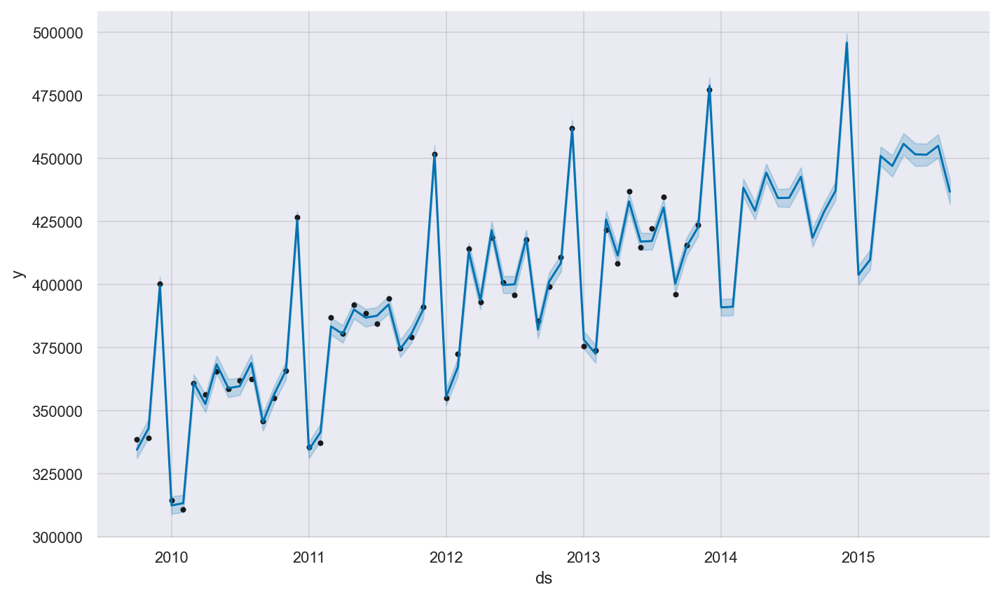

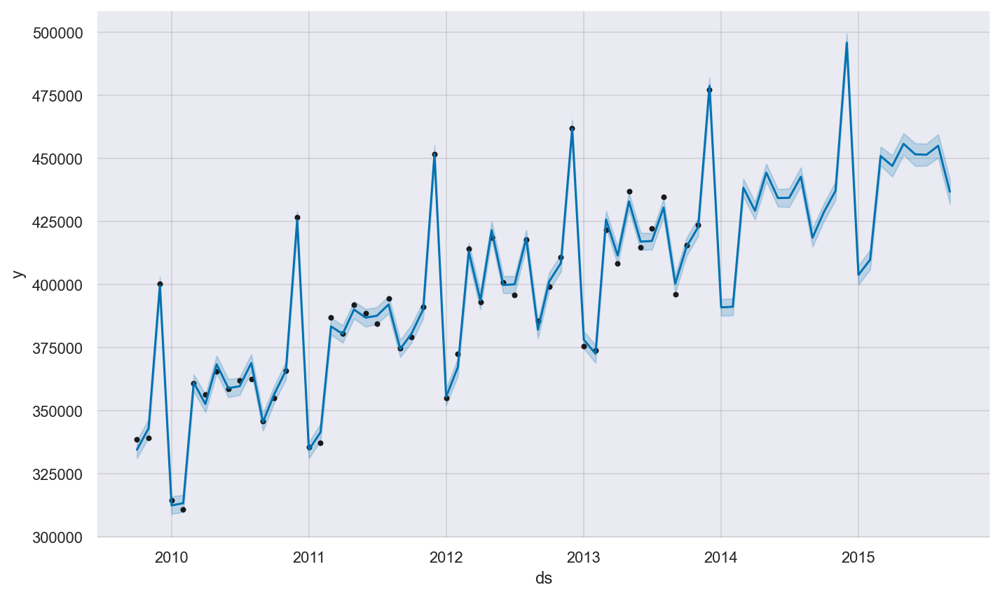

In [176]:
# Plotting results
prophet_model.plot(forecast)

In [177]:
prophet_model_acc = r2_score(df.y[-prediction_size:], forecast.yhat[-prediction_size:])
prophet_model_acc

0.9110602281486505

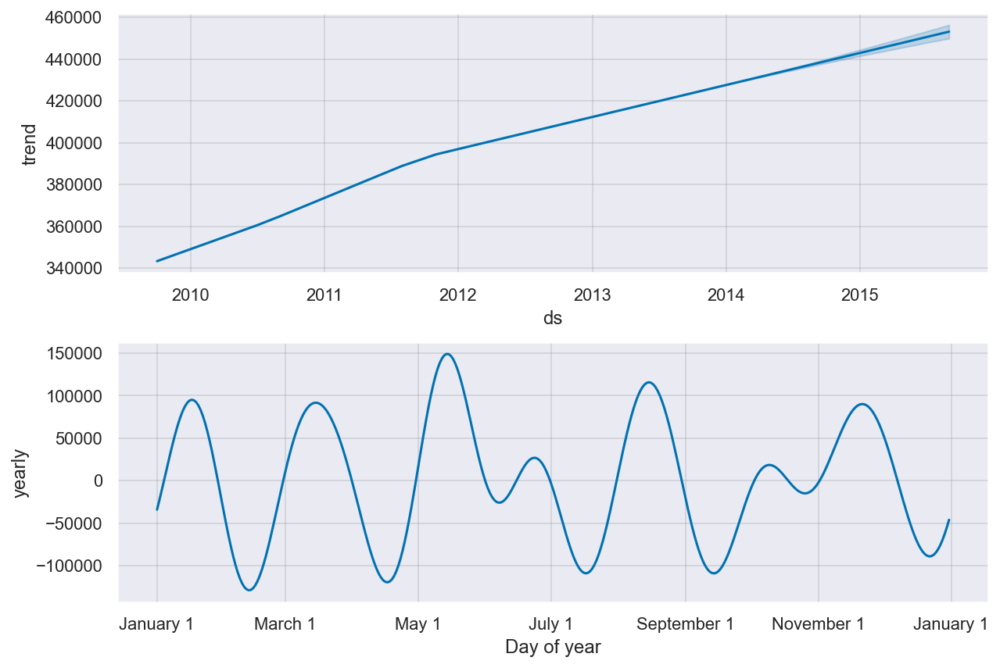

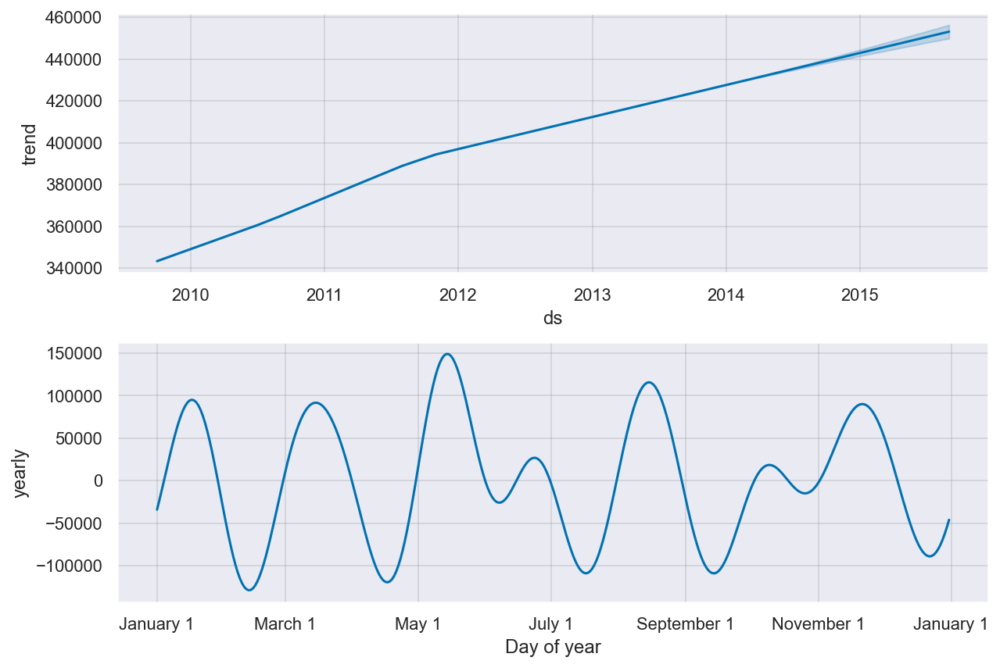

In [178]:
# Plotting trend and seasonalities
prophet_model.plot_components(forecast)

#### Forecasting quality evolution <a class="anchor" id="quality"></a>

To calculate metrics we need to join df and forecast dataframe.

In [179]:
print(", ".join(forecast.columns))

ds, trend, yhat_lower, yhat_upper, trend_lower, trend_upper, additive_terms, additive_terms_lower, additive_terms_upper, yearly, yearly_lower, yearly_upper, multiplicative_terms, multiplicative_terms_lower, multiplicative_terms_upper, yhat


In [180]:
def make_comparison_dataframe(historical, forecast):
    """Join the history with the forecast.
    
       The resulting dataset will contain columns 'yhat', 'yhat_lower', 'yhat_upper' and 'y'.
    """
    return forecast.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(
        historical.set_index("ds")
    )

In [181]:
df_merged = make_comparison_dataframe(df, forecast)
df_merged

,yhat,yhat_lower,yhat_upper,y
ds,,,,
2009-10-01,334624.217360,331252.571278,338352.513438,338630
2009-11-01,343098.297540,339471.136312,346562.167705,339386
2009-12-01,399721.247161,396083.450367,403176.072143,400264
2010-01-01,312523.711083,309177.466381,316084.280250,314640
2010-02-01,313402.589876,309938.321857,316648.701752,311022
...,...,...,...,...
2015-05-01,455859.692038,451538.038263,460071.937564,462615
2015-06-01,451698.228875,447045.154009,456043.138841,448229
2015-07-01,451557.212079,447176.659984,455898.696937,457710


In [182]:
# Compute errors
def calculate_forecast_errors(df, prediction_size):
    """Calculate MAPE and MAE of the forecast.
    
       Args:
           df: joined dataset with 'y' and 'yhat' columns.
           prediction_size: number of days at the end to predict.
    """

    # Make a copy
    df = df.copy()

    # Now we calculate the values of e_i and p_i according to the formulas given in the article above.
    df["e"] = df["y"] - df["yhat"]
    df["p"] = 100 * df["e"] / df["y"]

    # Recall that we held out the values of the last `prediction_size` days
    # in order to predict them and measure the quality of the model.

    # Now cut out the part of the data which we made our prediction for.
    predicted_part = df[-prediction_size:]

    # Define the function that averages absolute error values over the predicted part.
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))

    # Now we can calculate MAPE and MAE and return the resulting dictionary of errors.
    return {"MAPE(%)": error_mean("p"), "MAE": error_mean("e")}

In [183]:
for err_name, err_value in calculate_forecast_errors(df_merged, prediction_size).items():
    print(err_name, err_value)

MAPE(%) 1.6188121132979245
MAE 6886.802286118153


In [184]:
prophet_model_mse = mean_squared_error(df.y[-prediction_size:], forecast.yhat[-prediction_size:])
prophet_model_mse

71638449.67647284

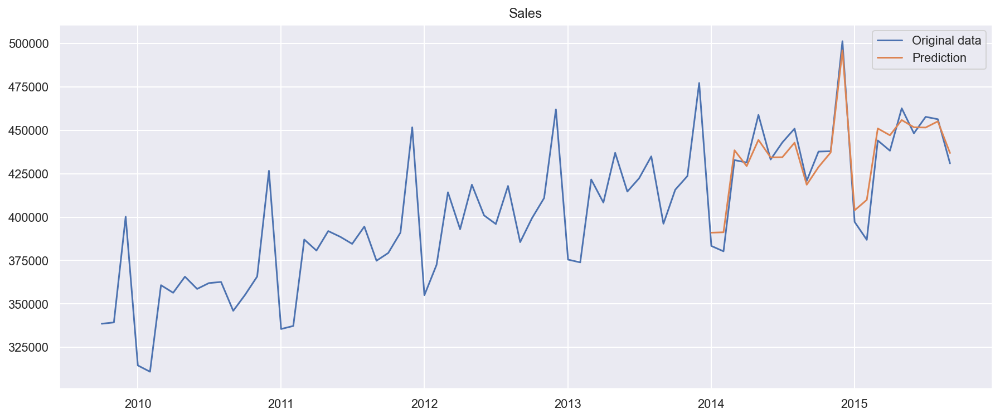

In [185]:
# Plotting result

plt.figure(figsize=(15, 6))
plt.plot(sales.Sales_Dollars)
plt.plot(df_merged[-prediction_size:].yhat)
plt.title("Sales")
plt.legend(['Original data', 'Prediction'])
plt.xticks(rotation = 0) # Rotates X-Axis Ticks 
plt.grid(True)
plt.show()

In [186]:
# Plotting interactive results 

def show_forecast(cmp_df, num_predictions, num_values, title):
    """
    Objective: Visualize the forecast
    cmp_df: dataset
    num_predictions: predicted sales weeks
    num_values: actual sales weeks
    title: plot title in string
    """

    def create_go(name, column, num, **kwargs):
        points = cmp_df.tail(num)
        args = dict(name=name, x=points.index, y=points[column], mode="lines")
        args.update(kwargs)
        return go.Scatter(**args)

    lower_bound = create_go(
        "Lower Bound",
        "yhat_lower",
        num_predictions,
        line=dict(width=0),
        marker=dict(color="gray"),
    )
    upper_bound = create_go(
        "Upper Bound",
        "yhat_upper",
        num_predictions,
        line=dict(width=0),
        marker=dict(color="gray"),
        fillcolor="rgba(68, 68, 68, 0.3)",
        fill="tonexty",
    )
    forecast = create_go(
        "Forecast", "yhat", num_predictions, line=dict(color="rgb(31, 119, 180)")
    )
    actual = create_go("Actual", "y", num_values, marker=dict(color="red"))

    # In this case the order of the series is important because of the filling
    data = [lower_bound, upper_bound, forecast, actual]

    layout = go.Layout(yaxis=dict(title="Sales"),
                       xaxis=dict(title="Date"),
                       title=title,
                       showlegend=True)
    fig = go.Figure(data=data, layout=layout)
    iplot(fig, show_link=False)


show_forecast(df_merged, prediction_size, 72, "Sales Prediction Prophet")

#### Box-Cox Transformation <a class="anchor" id="box-cox"></a>

In [187]:
def inverse_boxcox(y, lambda_):
    return np.exp(y) if lambda_ == 0 else np.exp(np.log(lambda_ * y + 1) / lambda_)

In [188]:
# Preparing dataset
train_df2 = train_df.copy().set_index("ds")

In [189]:
# Apply Box-Cox Transf.
train_df2["y"], lambda_prophet = scs.boxcox(train_df2["y"])
train_df2.reset_index(inplace=True)

In [190]:
# Create new model
prophet_model2 = Prophet()
prophet_model2.fit(train_df2)
future2 = prophet_model2.make_future_dataframe(periods=prediction_size, freq='MS')
forecast2 = prophet_model2.predict(future2)
len(forecast2)

11:33:44 - cmdstanpy - INFO - Chain [1] start processing
11:33:44 - cmdstanpy - INFO - Chain [1] done processing


72

In [191]:
forecast2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2009-10-01,1538.201416,1512.373714,1528.012939,1538.201416,1538.201416,-18.180793,-18.180793,-18.180793,-18.180793,-18.180793,-18.180793,0.0,0.0,0.0,1520.020624
1,2009-11-01,1542.523127,1531.399083,1546.326003,1542.523127,1542.523127,-3.720864,-3.720864,-3.720864,-3.720864,-3.720864,-3.720864,0.0,0.0,0.0,1538.802263
2,2009-12-01,1546.705428,1653.149768,1669.155850,1546.705428,1546.705428,114.488565,114.488565,114.488565,114.488565,114.488565,114.488565,0.0,0.0,0.0,1661.193993
3,2010-01-01,1551.027139,1460.716988,1475.967897,1551.027139,1551.027139,-82.526306,-82.526306,-82.526306,-82.526306,-82.526306,-82.526306,0.0,0.0,0.0,1468.500833
4,2010-02-01,1555.348849,1462.084591,1477.797261,1555.348849,1555.348849,-85.011455,-85.011455,-85.011455,-85.011455,-85.011455,-85.011455,0.0,0.0,0.0,1470.337394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2015-05-01,1767.869576,1776.373443,1797.285323,1761.216877,1773.807981,18.930986,18.930986,18.930986,18.930986,18.930986,18.930986,0.0,0.0,0.0,1786.800561
68,2015-06-01,1770.600567,1766.165023,1787.443135,1763.438916,1777.151114,6.526386,6.526386,6.526386,6.526386,6.526386,6.526386,0.0,0.0,0.0,1777.126953
69,2015-07-01,1773.243463,1765.110187,1787.439119,1765.546371,1780.353317,3.415035,3.415035,3.415035,3.415035,3.415035,3.415035,0.0,0.0,0.0,1776.658498
70,2015-08-01,1775.974455,1773.099731,1795.104089,1767.618704,1783.620179,8.307129,8.307129,8.307129,8.307129,8.307129,8.307129,0.0,0.0,0.0,1784.281584


In [192]:
# Invers Box-Cox Transf.
for column in ["yhat", "yhat_lower", "yhat_upper"]:
    forecast2[column] = inverse_boxcox(forecast2[column], lambda_prophet)

In [193]:
df2_merged = make_comparison_dataframe(df, forecast2)
for err_name, err_value in calculate_forecast_errors(df2_merged, prediction_size).items():
    print(err_name, err_value)

MAPE(%) 1.4660384659156567
MAE 6266.397188006876


In [194]:
# Accuracy 

prophet_model2_acc = r2_score(df.y[-prediction_size:], forecast2.yhat[-prediction_size:])
prophet_model2_acc

0.92647025583919

In [195]:
prophet_model2_mse = mean_squared_error(df.y[-prediction_size:], forecast2.yhat[-prediction_size:])
prophet_model2_mse

59226111.86356651

The MAE has been slightly reduced.

In [196]:
show_forecast(df2_merged, prediction_size, 72, "Box-Cox Transformation")

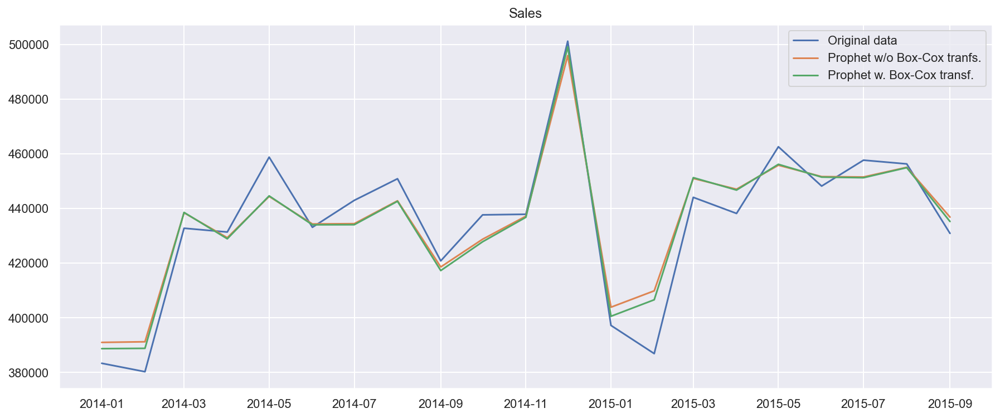

In [197]:
# Plotting comparison

plt.figure(figsize=(15, 6))
plt.plot(sales[-prediction_size:].Sales_Dollars)
plt.plot(df_merged[-prediction_size:].yhat)
plt.plot(df2_merged[-prediction_size:].yhat)
plt.title("Sales")
plt.legend(['Original data', 'Prophet w/o Box-Cox tranfs.' , 'Prophet w. Box-Cox transf.'])
plt.xticks(rotation = 0) # Rotates X-Axis Ticks 
plt.grid(True)
plt.show()

Graphically there is no difference.

#### Hyperparameters Tunning <a class="anchor" id="ht"></a>

According to the [documentation](https://facebook.github.io/prophet/docs/diagnostics.html#cross-validation), the most important paramters are the following:
                                 
1. changepoint_prior_scale: It determines the flexibility of the trend, and in particular how much the trend changes at the trend changepoint.
2. seasonality_prior_scale: This parameter controls the flexibility of the seasonality. Similarly, a large value allows the seasonality to fit large fluctuations, a small value shrinks the magnitude of the seasonality.
                                 

In [198]:
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5, 0.7, 0.9],  # adjusting trend flexibility: increasing it will make the trend more flexible
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],  # adjusts the extent to which the seasonality model will fit the data.
    'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],  # to control holidays overfitting: reducing it  dampens holiday effect
    'seasonality_mode': ['additive', 'multiplicative']
}

grid = ParameterGrid(param_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 240


In [199]:
start = df.ds[0]
start
end = df.ds[71]
end

model_parameters = pd.DataFrame(columns = ['MSE','Parameters'])

for p in grid:
    test = pd.DataFrame()
    print(p)
    #random.seed(0)
    train_model = Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         seasonality_mode = p['seasonality_mode'],
                         #weekly_seasonality=True,
                         #daily_seasonality = True,
                         yearly_seasonality = True,  # Fourier terms to change the seasonality cycles
                         #mcmc_samples = 6, # Uncertainty in seasonality: we assume the previous 6 months 
                         interval_width=0.95)  # width of uncertainty: 0.95 means thta we assume same frequency 
                                               # and magnitude of rate changes as the past
    
    train_model.fit(train_df2)
    future = train_model.make_future_dataframe(periods=prediction_size, freq='MS',include_history = False)
    forecast = train_model.predict(future)
    
    # Invers Box-Cox Transf.
    for column in ["yhat", "yhat_lower", "yhat_upper"]:
        forecast[column] = inverse_boxcox(forecast[column], lambda_prophet)
        
    MSE = mean_squared_error(df.y[-prediction_size:], forecast.yhat[-prediction_size:])
    #prophet_model2_mse
    #test=train_forecast[['ds','yhat']]
    #Actual = df[(df['ds']>start) & (df['ds']<=end)]
    #MSE = mean_squared_error(Actual['y'][-prediction_size:],abs(test['yhat']))
    print('Mean Squared Error(MSE)------------------------------------',MSE)
    model_parameters = model_parameters.append({'MSE':MSE,'Parameters':p},ignore_index=True)

11:33:45 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:33:46 - cmdstanpy - INFO - Chain [1] done processing
11:33:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:33:46 - cmdstanpy - INFO - Chain [1] done processing
11:33:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:33:47 - cmdstanpy - INFO - Chain [1] done processing
11:33:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:33:48 - cmdstanpy - INFO - Chain [1] done processing
11:33:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:33:48 - cmdstanpy - INFO - Chain [1] done processing
11:33:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:33:49 - cmdstanpy - INFO - Chain [1] done processing
11:33:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:33:50 - cmdstanpy - INFO - Chain [1] done processing
11:33:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:33:50 - cmdstanpy - INFO - Chain [1] done processing
11:33:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:33:51 - cmdstanpy - INFO - Chain [1] done processing
11:33:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:33:51 - cmdstanpy - INFO - Chain [1] done processing
11:33:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:33:52 - cmdstanpy - INFO - Chain [1] done processing
11:33:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:33:52 - cmdstanpy - INFO - Chain [1] done processing
11:33:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:33:53 - cmdstanpy - INFO - Chain [1] done processing
11:33:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:33:53 - cmdstanpy - INFO - Chain [1] done processing
11:33:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:33:54 - cmdstanpy - INFO - Chain [1] done processing
11:33:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:33:54 - cmdstanpy - INFO - Chain [1] done processing
11:33:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:33:55 - cmdstanpy - INFO - Chain [1] done processing
11:33:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:33:55 - cmdstanpy - INFO - Chain [1] done processing
11:33:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:33:56 - cmdstanpy - INFO - Chain [1] done processing
11:33:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:33:56 - cmdstanpy - INFO - Chain [1] done processing
11:33:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:33:57 - cmdstanpy - INFO - Chain [1] done processing
11:33:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:33:57 - cmdstanpy - INFO - Chain [1] done processing
11:33:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:33:58 - cmdstanpy - INFO - Chain [1] done processing
11:33:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:33:58 - cmdstanpy - INFO - Chain [1] done processing
11:33:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:33:59 - cmdstanpy - INFO - Chain [1] done processing
11:33:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:33:59 - cmdstanpy - INFO - Chain [1] done processing
11:33:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:00 - cmdstanpy - INFO - Chain [1] done processing
11:34:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:00 - cmdstanpy - INFO - Chain [1] done processing
11:34:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:01 - cmdstanpy - INFO - Chain [1] done processing
11:34:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:01 - cmdstanpy - INFO - Chain [1] done processing
11:34:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:02 - cmdstanpy - INFO - Chain [1] done processing
11:34:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:03 - cmdstanpy - INFO - Chain [1] done processing
11:34:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:03 - cmdstanpy - INFO - Chain [1] done processing
11:34:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:04 - cmdstanpy - INFO - Chain [1] done processing
11:34:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:04 - cmdstanpy - INFO - Chain [1] done processing
11:34:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:05 - cmdstanpy - INFO - Chain [1] done processing
11:34:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 213369113.2637324
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:06 - cmdstanpy - INFO - Chain [1] done processing
11:34:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:06 - cmdstanpy - INFO - Chain [1] done processing
11:34:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:07 - cmdstanpy - INFO - Chain [1] done processing
11:34:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:07 - cmdstanpy - INFO - Chain [1] done processing
11:34:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 193246967.74551183
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:08 - cmdstanpy - INFO - Chain [1] done processing
11:34:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:08 - cmdstanpy - INFO - Chain [1] done processing
11:34:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:09 - cmdstanpy - INFO - Chain [1] done processing
11:34:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:09 - cmdstanpy - INFO - Chain [1] done processing
11:34:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:10 - cmdstanpy - INFO - Chain [1] done processing
11:34:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:11 - cmdstanpy - INFO - Chain [1] done processing
11:34:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:11 - cmdstanpy - INFO - Chain [1] done processing
11:34:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:11 - cmdstanpy - INFO - Chain [1] done processing
11:34:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:12 - cmdstanpy - INFO - Chain [1] done processing
11:34:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:13 - cmdstanpy - INFO - Chain [1] done processing
11:34:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:13 - cmdstanpy - INFO - Chain [1] done processing
11:34:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:14 - cmdstanpy - INFO - Chain [1] done processing
11:34:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:15 - cmdstanpy - INFO - Chain [1] done processing
11:34:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:15 - cmdstanpy - INFO - Chain [1] done processing
11:34:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:16 - cmdstanpy - INFO - Chain [1] done processing
11:34:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:16 - cmdstanpy - INFO - Chain [1] done processing
11:34:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:17 - cmdstanpy - INFO - Chain [1] done processing
11:34:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:19 - cmdstanpy - INFO - Chain [1] done processing
11:34:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:20 - cmdstanpy - INFO - Chain [1] done processing
11:34:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:20 - cmdstanpy - INFO - Chain [1] done processing
11:34:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:21 - cmdstanpy - INFO - Chain [1] done processing
11:34:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:21 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:23 - cmdstanpy - INFO - Chain [1] done processing
11:34:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:23 - cmdstanpy - INFO - Chain [1] done processing
11:34:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:24 - cmdstanpy - INFO - Chain [1] done processing
11:34:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:24 - cmdstanpy - INFO - Chain [1] done processing
11:34:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:25 - cmdstanpy - INFO - Chain [1] done processing
11:34:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:25 - cmdstanpy - INFO - Chain [1] done processing
11:34:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:27 - cmdstanpy - INFO - Chain [1] done processing
11:34:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:28 - cmdstanpy - INFO - Chain [1] done processing
11:34:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:28 - cmdstanpy - INFO - Chain [1] done processing
11:34:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 60664468.49725081
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.01, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 50844523.63134781
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:31 - cmdstanpy - INFO - Chain [1] done processing
11:34:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:31 - cmdstanpy - INFO - Chain [1] done processing
11:34:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:32 - cmdstanpy - INFO - Chain [1] done processing
11:34:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:34 - cmdstanpy - INFO - Chain [1] done processing
11:34:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:35 - cmdstanpy - INFO - Chain [1] done processing
11:34:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:36 - cmdstanpy - INFO - Chain [1] done processing
11:34:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:36 - cmdstanpy - INFO - Chain [1] done processing
11:34:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:37 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:39 - cmdstanpy - INFO - Chain [1] done processing
11:34:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:40 - cmdstanpy - INFO - Chain [1] done processing
11:34:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:43 - cmdstanpy - INFO - Chain [1] done processing
11:34:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:44 - cmdstanpy - INFO - Chain [1] done processing
11:34:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:44 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:46 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:46 - cmdstanpy - INFO - Chain [1] done processing
11:34:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:47 - cmdstanpy - INFO - Chain [1] done processing
11:34:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:48 - cmdstanpy - INFO - Chain [1] done processing
11:34:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:48 - cmdstanpy - INFO - Chain [1] done processing
11:34:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:50 - cmdstanpy - INFO - Chain [1] done processing
11:34:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:50 - cmdstanpy - INFO - Chain [1] done processing
11:34:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:51 - cmdstanpy - INFO - Chain [1] done processing
11:34:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:51 - cmdstanpy - INFO - Chain [1] done processing
11:34:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:52 - cmdstanpy - INFO - Chain [1] done processing
11:34:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:52 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:54 - cmdstanpy - INFO - Chain [1] done processing
11:34:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 58225579.38364359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:55 - cmdstanpy - INFO - Chain [1] done processing
11:34:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:34:55 - cmdstanpy - INFO - Chain [1] done processing
11:34:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:34:56 - cmdstanpy - INFO - Chain [1] done processing
11:34:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 49519280.796853915
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:34:58 - cmdstanpy - INFO - Chain [1] done processing
11:34:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:34:58 - cmdstanpy - INFO - Chain [1] done processing
11:34:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:34:59 - cmdstanpy - INFO - Chain [1] done processing
11:34:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:34:59 - cmdstanpy - INFO - Chain [1] done processing
11:35:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:00 - cmdstanpy - INFO - Chain [1] done processing
11:35:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:02 - cmdstanpy - INFO - Chain [1] done processing
11:35:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:03 - cmdstanpy - INFO - Chain [1] done processing
11:35:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:03 - cmdstanpy - INFO - Chain [1] done processing
11:35:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:04 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:06 - cmdstanpy - INFO - Chain [1] done processing
11:35:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:07 - cmdstanpy - INFO - Chain [1] done processing
11:35:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:10 - cmdstanpy - INFO - Chain [1] done processing
11:35:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:10 - cmdstanpy - INFO - Chain [1] done processing
11:35:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:11 - cmdstanpy - INFO - Chain [1] done processing
11:35:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:13 - cmdstanpy - INFO - Chain [1] done processing
11:35:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:13 - cmdstanpy - INFO - Chain [1] done processing
11:35:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:14 - cmdstanpy - INFO - Chain [1] done processing
11:35:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:15 - cmdstanpy - INFO - Chain [1] done processing
11:35:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:15 - cmdstanpy - INFO - Chain [1] done processing
11:35:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:17 - cmdstanpy - INFO - Chain [1] done processing
11:35:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:18 - cmdstanpy - INFO - Chain [1] done processing
11:35:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:18 - cmdstanpy - INFO - Chain [1] done processing
11:35:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:19 - cmdstanpy - INFO - Chain [1] done processing
11:35:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 46105279.184833094
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:21 - cmdstanpy - INFO - Chain [1] done processing
11:35:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:22 - cmdstanpy - INFO - Chain [1] done processing
11:35:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:22 - cmdstanpy - INFO - Chain [1] done processing
11:35:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 64981063.58118864
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:24 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:24 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:25 - cmdstanpy - INFO - Chain [1] done processing
11:35:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:25 - cmdstanpy - INFO - Chain [1] done processing
11:35:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:26 - cmdstanpy - INFO - Chain [1] done processing
11:35:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:26 - cmdstanpy - INFO - Chain [1] done processing
11:35:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:26 - cmdstanpy - INFO - Chain [1] done processing
11:35:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:28 - cmdstanpy - INFO - Chain [1] done processing
11:35:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:28 - cmdstanpy - INFO - Chain [1] done processing
11:35:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:29 - cmdstanpy - INFO - Chain [1] done processing
11:35:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:29 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:32 - cmdstanpy - INFO - Chain [1] done processing
11:35:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:33 - cmdstanpy - INFO - Chain [1] done processing
11:35:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:34 - cmdstanpy - INFO - Chain [1] done processing
11:35:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:34 - cmdstanpy - INFO - Chain [1] done processing
11:35:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:34 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:36 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:37 - cmdstanpy - INFO - Chain [1] done processing
11:35:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:37 - cmdstanpy - INFO - Chain [1] done processing
11:35:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:39 - cmdstanpy - INFO - Chain [1] done processing
11:35:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:39 - cmdstanpy - INFO - Chain [1] done processing
11:35:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:40 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:42 - cmdstanpy - INFO - Chain [1] done processing
11:35:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:42 - cmdstanpy - INFO - Chain [1] done processing
11:35:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:43 - cmdstanpy - INFO - Chain [1] done processing
11:35:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45915194.77365597
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:45 - cmdstanpy - INFO - Chain [1] done processing
11:35:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:45 - cmdstanpy - INFO - Chain [1] done processing
11:35:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 56333762.6472352
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:46 - cmdstanpy - INFO - Chain [1] done processing
11:35:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:46 - cmdstanpy - INFO - Chain [1] done processing
11:35:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:47 - cmdstanpy - INFO - Chain [1] done processing
11:35:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:47 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:51 - cmdstanpy - INFO - Chain [1] done processing
11:35:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:52 - cmdstanpy - INFO - Chain [1] done processing
11:35:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:52 - cmdstanpy - INFO - Chain [1] done processing
11:35:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:54 - cmdstanpy - INFO - Chain [1] done processing
11:35:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:55 - cmdstanpy - INFO - Chain [1] done processing
11:35:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:35:57 - cmdstanpy - INFO - Chain [1] done processing
11:35:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:35:57 - cmdstanpy - INFO - Chain [1] done processing
11:35:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:35:57 - cmdstanpy - INFO - Chain [1] done processing
11:35:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:35:58 - cmdstanpy - INFO - Chain [1] done processing
11:35:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:35:58 - cmdstanpy - INFO - Chain [1] done processing
11:35:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:35:59 - cmdstanpy - INFO - Chain [1] done processing
11:35:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:35:59 - cmdstanpy - INFO - Chain [1] done processing
11:36:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:36:00 - cmdstanpy - INFO - Chain [1] done processing
11:36:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:36:01 - cmdstanpy - INFO - Chain [1] done processing
11:36:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:36:01 - cmdstanpy - INFO - Chain [1] done processing
11:36:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}


11:36:03 - cmdstanpy - INFO - Chain [1] done processing
11:36:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


11:36:04 - cmdstanpy - INFO - Chain [1] done processing
11:36:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


11:36:04 - cmdstanpy - INFO - Chain [1] done processing
11:36:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}


11:36:05 - cmdstanpy - INFO - Chain [1] done processing
11:36:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 48309389.83772714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}


11:36:05 - cmdstanpy - INFO - Chain [1] done processing
11:36:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}


11:36:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Squared Error(MSE)------------------------------------ 45743842.98821024


In [200]:
parameters = model_parameters.sort_values(by=['MSE'])
parameters = parameters.reset_index(drop=True)

with pd.option_context('display.max_colwidth', None):
    display(parameters)

,MSE,Parameters
0,4.574384e+07,"{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.5, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}"
1,4.574384e+07,"{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0}"
2,4.574384e+07,"{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}"
3,4.574384e+07,"{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01}"
4,4.574384e+07,"{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}"
...,...,...
235,2.133691e+08,"{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.3, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}"
236,2.133691e+08,"{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}"
237,2.133691e+08,"{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.4, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01}"
238,2.133691e+08,"{'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 0.2, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0}"


In [201]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.9,
 'holidays_prior_scale': 0.5,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 10.0}

In [202]:
# Setup and train model with holidays
prophet_model3 = Prophet(changepoint_prior_scale= 0.9,
                      holidays_prior_scale = 0.5,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale= 10,
                      #weekly_seasonality=True,
                      #daily_seasonality = True,
                      yearly_seasonality = True,
                      #mcmc_samples = 6,
                      interval_width=0.95)
prophet_model3.fit(train_df2)

11:36:07 - cmdstanpy - INFO - Chain [1] start processing
11:36:07 - cmdstanpy - INFO - Chain [1] done processing


In [203]:
future3 = prophet_model3.make_future_dataframe(periods=prediction_size, freq='MS')
forecast3 = prophet_model3.predict(future3)

# Invers Box-Cox Transf.
for column in ["yhat", "yhat_lower", "yhat_upper"]:
    forecast3[column] = inverse_boxcox(forecast3[column], lambda_prophet)

df3_merged = make_comparison_dataframe(df, forecast3)

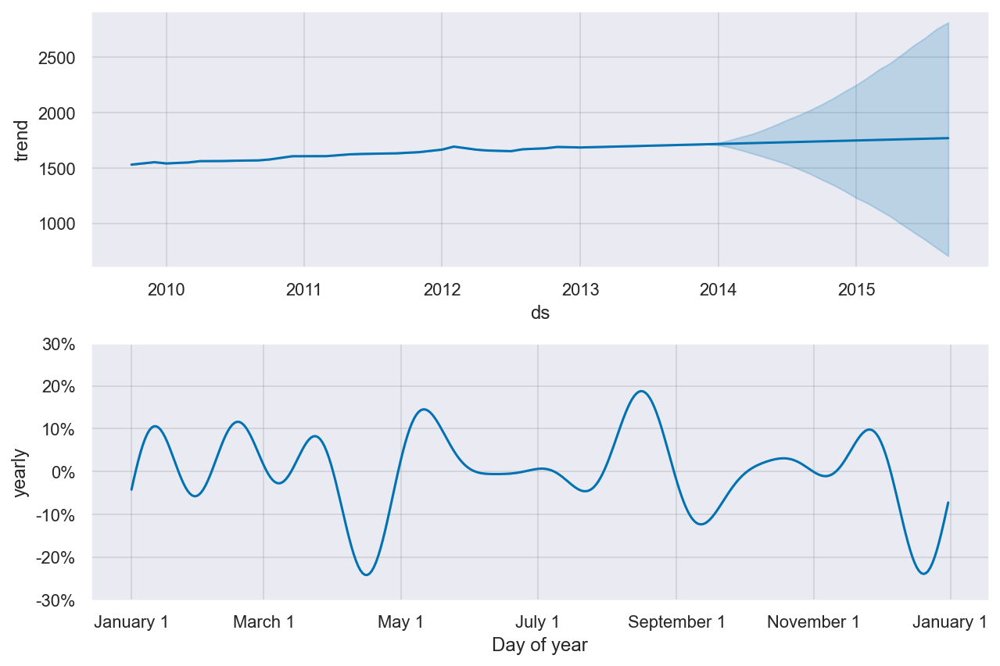

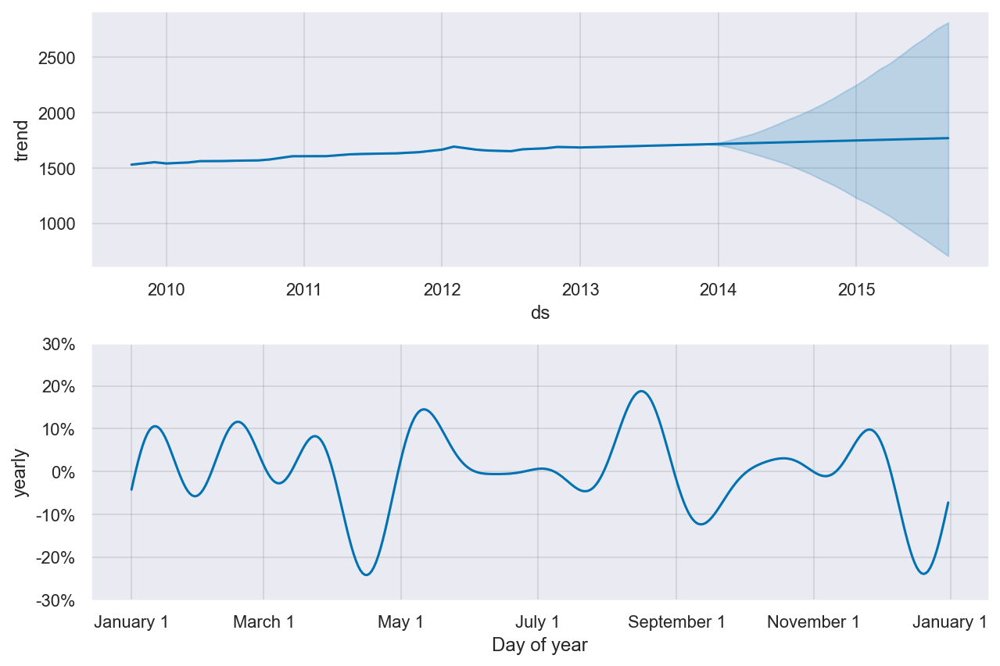

In [204]:
prophet_model3.plot_components(forecast3)

In [205]:
show_forecast(df3_merged, prediction_size, 72, "Hyperparameters Tunning")

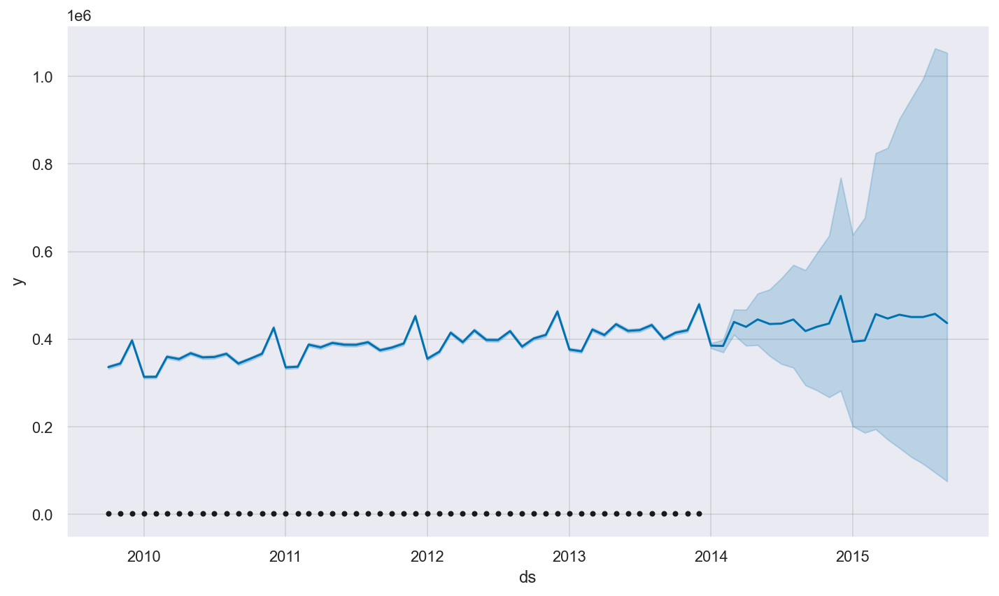

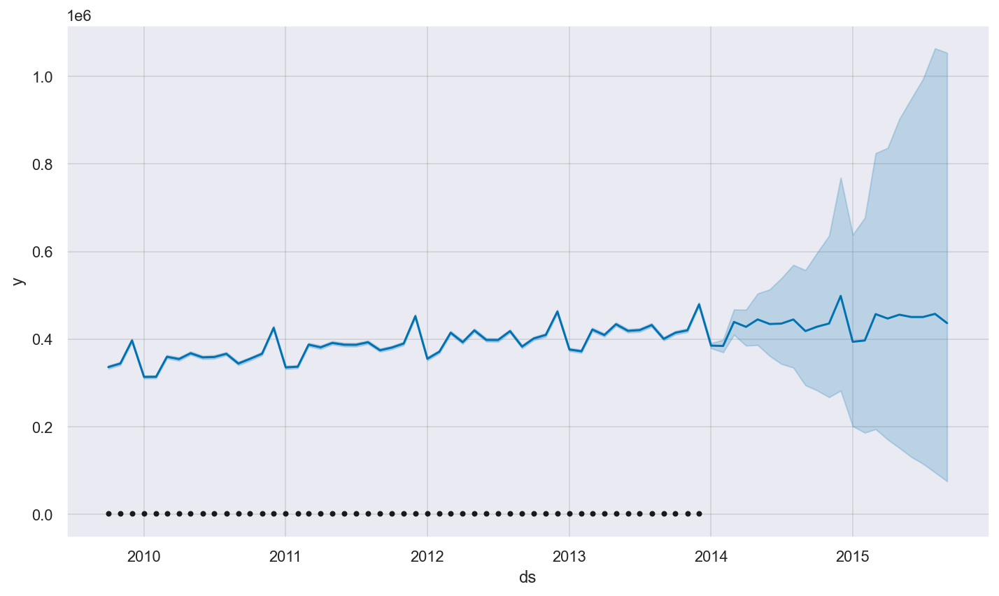

In [206]:
# The same plot but created from prophet libray
prophet_model3.plot(forecast3)

In [207]:
# Accuracy 
prophet_model3_acc = r2_score(df.y[-prediction_size:], forecast3.yhat[-prediction_size:])
print(prophet_model3_acc)

# MSE
prophet_model3_mse = mean_squared_error(df.y[-prediction_size:], forecast3.yhat[-prediction_size:])
prophet_model3_mse

0.9432086124511497


45743842.98821024

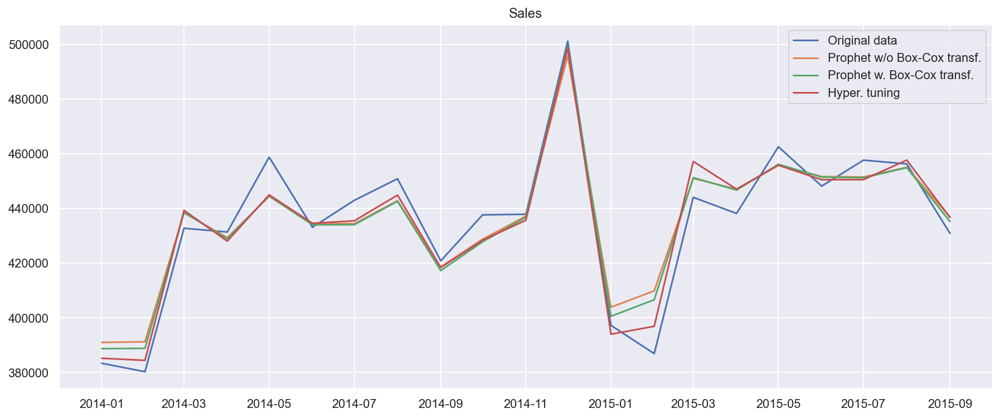

In [208]:
# Plotting comparison

plt.figure(figsize=(15, 6))
plt.plot(sales[-prediction_size:].Sales_Dollars)
plt.plot(df_merged[-prediction_size:].yhat)
plt.plot(df2_merged[-prediction_size:].yhat)
plt.plot(df3_merged[-prediction_size:].yhat)
plt.title("Sales")
plt.legend(['Original data','Prophet w/o Box-Cox transf.', 'Prophet w. Box-Cox transf.', 'Hyper. tuning'])
plt.xticks(rotation = 0) # Rotates X-Axis Ticks 
plt.grid(True)
plt.show()

#### Cross validation <a class="anchor" id="cv2"></a>

Very useful to measure forecast error using historical data.  This is done by selecting cutoff points in the history, and for each of them fitting the model using data only up to that cutoff point. We can then compare the forecasted values to the actual values.

In [209]:
df_cv = cross_validation(prophet_model3, initial='735 days', period='180 days', horizon='365 days')
df_cv.head()

  0%|          | 0/3 [00:00<?, ?it/s]

11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:37:03 - cmdstanpy - INFO - Chain [1] done processing
11:37:03 - cmdstanpy - INFO - Chain [1] start processing
11:37:04 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2012-01-01,1631.343624,1606.791747,1660.310259,1566.125855,2011-12-07
1,2012-02-01,1719.693114,1638.200534,1806.510710,1606.183424,2011-12-07
2,2012-03-01,1986.833643,1816.597197,2171.215220,1698.478188,2011-12-07
3,2012-04-01,2078.285986,1786.506786,2374.825820,1652.107746,2011-12-07
4,2012-05-01,2069.074718,1684.202905,2462.468017,1707.883950,2011-12-07


In [210]:
df_cv.cutoff.unique()

array(['2011-12-07T00:00:00.000000000', '2012-06-04T00:00:00.000000000',
       '2012-12-01T00:00:00.000000000'], dtype='datetime64[ns]')

In [211]:
# Metrics form Cross Validation
df_metrics = performance_metrics(df_cv)
df_metrics

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,31 days,2085.832201,45.670912,42.306715,0.026497,0.023522,0.026273,0.333333
1,56 days,4962.862989,70.447590,58.404022,0.036173,0.023522,0.035428,0.333333
2,58 days,4829.230801,69.492667,54.748321,0.033897,0.023522,0.033177,0.333333
3,62 days,6674.135099,81.695380,69.938503,0.043353,0.051891,0.043000,0.333333
4,85 days,30095.607957,173.480858,128.220425,0.076387,0.051891,0.072411,0.333333
5,89 days,30066.258821,173.396248,126.854732,0.075660,0.051891,0.071698,0.333333
6,90 days,29277.659252,171.107157,121.645944,0.071563,0.039600,0.067407,0.666667
7,116 days,62104.000589,249.206743,167.586872,0.100959,0.039600,0.091407,0.666667
8,119 days,64146.359036,253.271315,190.940426,0.114945,0.047273,0.105769,0.666667
9,121 days,64660.857476,254.284993,194.456674,0.117254,0.047273,0.108181,0.666667


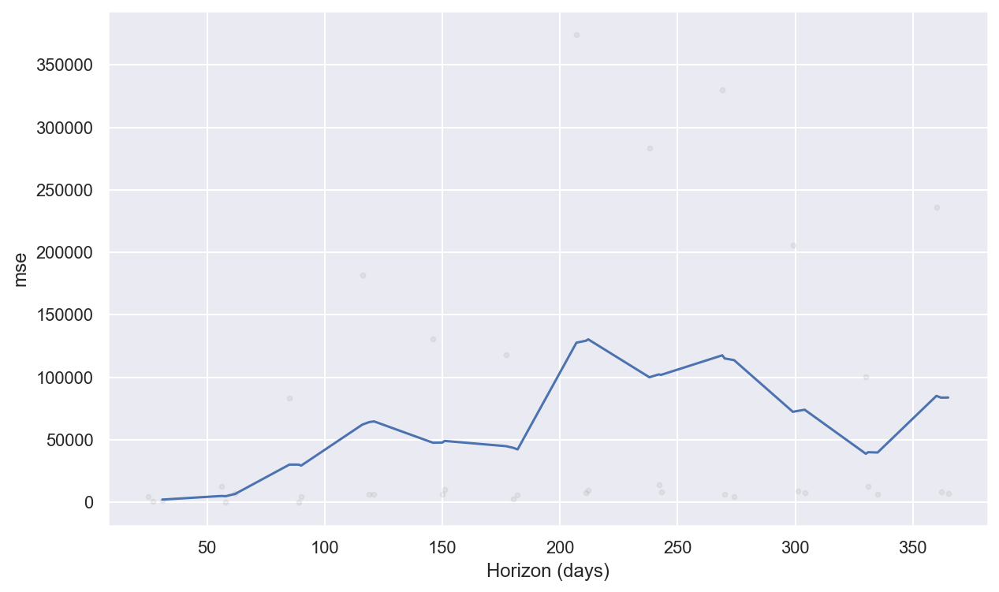

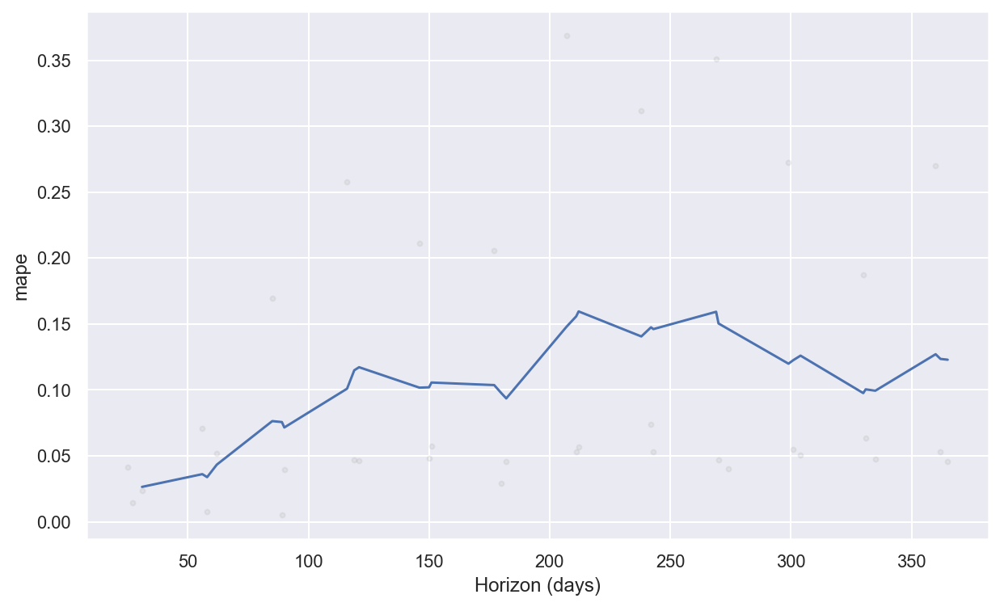

In [212]:
# Plotting metrics
fig = plot_cross_validation_metric(df_cv, metric='mse')
fig = plot_cross_validation_metric(df_cv, metric = 'mape')

##### Adding holidays <a class="anchor" id="holidays"></a>

In [213]:
# Importing US holidays
holiday = pd.DataFrame([])

for date, name in sorted(holidays.USA(years=[2009,2010,2011,2012,2013,2014,2015]).items()):
    holiday = holiday.append(pd.DataFrame({'ds':date, 'holiday':"US_holidays"},
                                          index=[0]), ignore_index=True)
    holiday["ds"] = pd.to_datetime(holiday['ds'],format='%Y-%m-%d', errors='ignore')
    
holiday.head()    

,ds,holiday
0,2009-01-01,US_holidays
1,2009-01-19,US_holidays
2,2009-02-16,US_holidays
3,2009-05-25,US_holidays
4,2009-07-03,US_holidays


In [214]:
# Adjusting holiday time
holiday = holiday[(holiday.ds > '2009-10-01') & (holiday.ds < '2015-09-01') ]
holiday

,ds,holiday
7,2009-10-12,US_holidays
8,2009-11-11,US_holidays
9,2009-11-26,US_holidays
10,2009-12-25,US_holidays
11,2010-01-01,US_holidays
...,...,...
68,2015-01-19,US_holidays
69,2015-02-16,US_holidays
70,2015-05-25,US_holidays
71,2015-07-03,US_holidays


11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:06 - cmdstanpy - INFO - Chain [1] done processing


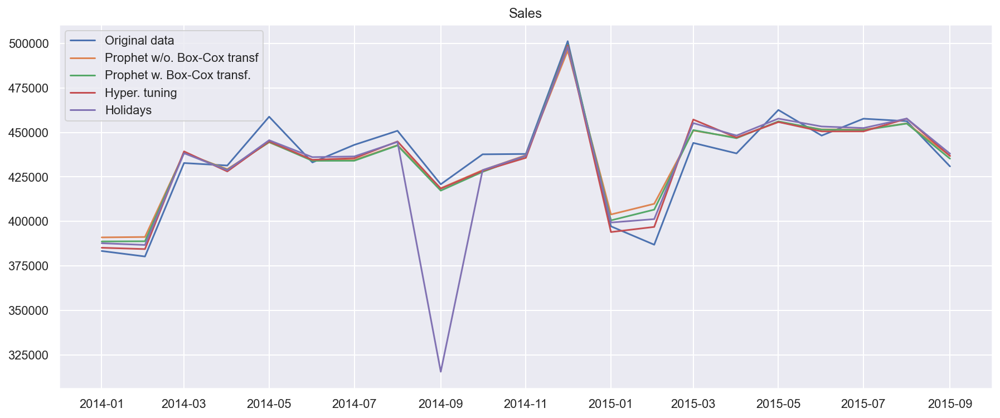

In [215]:
# Setup and train model with holidays
prophet_model4 = Prophet(changepoint_prior_scale= 0.9,
                      holidays_prior_scale = 0.5,
                      seasonality_mode = 'additive',
                      seasonality_prior_scale= 10,
                      #weekly_seasonality=True,
                      #daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95,
                      holidays=holiday)
prophet_model4.fit(train_df2)

future4 = prophet_model4.make_future_dataframe(periods=prediction_size, freq='MS')
forecast4 = prophet_model4.predict(future4)

# Invers Box-Cox Transf.
for column in ["yhat", "yhat_lower", "yhat_upper"]:
    forecast4[column] = inverse_boxcox(forecast4[column], lambda_prophet)

df4_merged = make_comparison_dataframe(df, forecast4)

# Accuracy 
prophet_model4_acc = r2_score(df.y[-prediction_size:], forecast4.yhat[-prediction_size:])
prophet_model4_acc

# MSE
prophet_model4_mse = mean_squared_error(df.y[-prediction_size:], forecast4.yhat[-prediction_size:])
prophet_model4_mse

# Plotting comparison

plt.figure(figsize=(15, 6))
plt.plot(sales[-prediction_size:].Sales_Dollars)
plt.plot(df_merged[-prediction_size:].yhat)
plt.plot(df2_merged[-prediction_size:].yhat)
plt.plot(df3_merged[-prediction_size:].yhat)
plt.plot(df4_merged[-prediction_size:].yhat)
plt.title("Sales")
plt.legend(['Original data', 'Prophet w/o. Box-Cox transf','Prophet w. Box-Cox transf.', 'Hyper. tuning', 'Holidays'])
plt.xticks(rotation = 0) # Rotates X-Axis Ticks 
plt.grid(True)
plt.show()

Inserting USA holidays does not help to improve the accuracy of the model.

In [216]:
show_forecast(df4_merged, prediction_size, 72, "Hyperparameters Tunning")

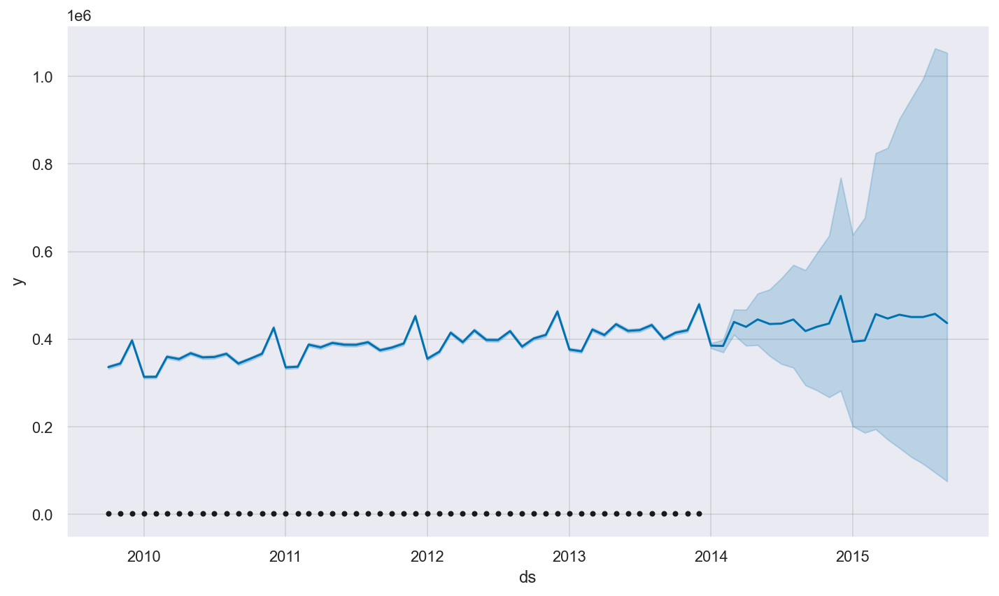

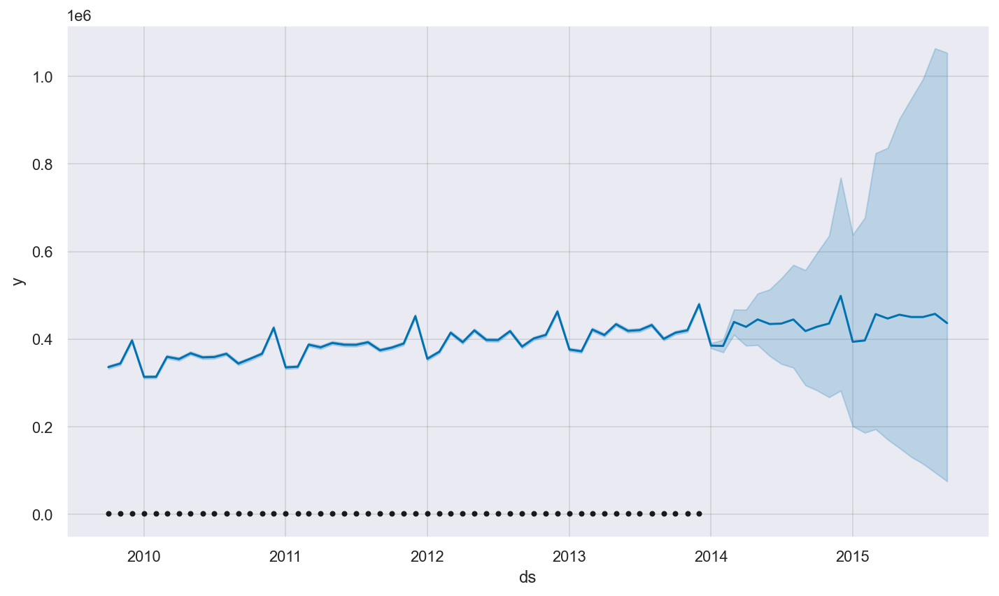

In [217]:
# The same plot but created from prophet libray
prophet_model3.plot(forecast3)

#### Residuals Analysis <a class="anchor" id="residuals_analysis"></a>

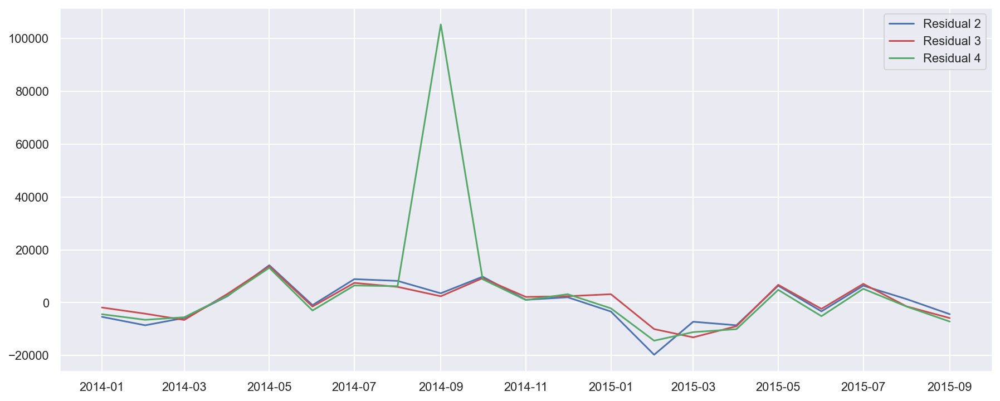

In [218]:
df_residuals = pd.DataFrame({"ds": df["ds"], "residuals": df["y"] - forecast["yhat"]})
df_residuals2 = pd.DataFrame({"ds": df["ds"], "residuals": df["y"] - forecast2["yhat"]})
df_residuals3 = pd.DataFrame({"ds": df["ds"], "residuals": df["y"] - forecast3["yhat"]})
df_residuals4 = pd.DataFrame({"ds": df["ds"], "residuals": df["y"] - forecast4["yhat"]})

df_residuals = df_residuals.set_index('ds')
df_residuals2 = df_residuals2.set_index('ds')
df_residuals3 = df_residuals3.set_index('ds')
df_residuals4 = df_residuals4.set_index('ds')


# Plot
plt.figure(figsize=(15, 6))
#df_residuals.plot(x="ds", y="residuals", figsize=(10, 6))
#df_residuals2.plot(x="ds", y="residuals", figsize=(10, 6))
#df_residuals3.plot(x="ds", y="residuals", figsize=(10, 6))
#df_residuals4.plot(x="ds", y="residuals", figsize=(10, 6))

#plt.plot(df_residuals, 'r-', label='Residual 1')
plt.plot(df_residuals2[-prediction_size:], 'b-', label='Residual 2')
plt.plot(df_residuals3[-prediction_size:], 'r-', label='Residual 3')
plt.plot(df_residuals4[-prediction_size:], 'g-', label='Residual 4')
plt.legend()
plt.show()

The residuals of model Prophet3 is the one closest to cero, and then the better one.

## Models Comparison <a class="anchor" id="models_comparison"></a>

In [219]:
# Accuracies comparison for ML algorithms

results = pd.DataFrame()
results['Model'] = ['Time Series Lags', 
                    'Time Series Lags Lasso',
                    'Time Series Lags Ridge',
                    'Time Series Lags Random Forest',
                    'time Series Lags XGBoost',
                    'Date Features ',
                    'Date Features Lasso',
                    'Date Feature Ridge',
                    'Date Random Forest',
                    'Date XGBoost',
                    'Target Encoding',
                    'Target Encoding Lasso',
                    'Target Encoding Ridge',
                    'Target Random Forest',
                    'Target XGBoost',
                    'CV XGBoost',
                    'Prophet 1',
                    'Prophet 2',
                    'Prophet 3',
                    'Prophet 4'
                   ]

results['Accuracy'] = [time_lag_reg_acc,
                       time_lag_lasso_reg_acc,
                       time_lag_ridge_reg_acc,
                       rand_for_lag_acc,
                       xgb_lag_acc,
                       date_features_model_ac,
                       date_features_lasso_reg_acc,
                       date_features_ridge_reg_acc,
                       rand_for_date_acc,
                       xgb_date_acc,
                       target_coding_reg_acc,
                       target_encoding_lasso_reg_acc,
                       target_encoding_ridge_reg_acc,
                       rand_for_target_acc,
                       xgb_target_acc,
                       xgb_new_acc,
                       prophet_model_acc,
                       prophet_model2_acc,
                       prophet_model3_acc,
                       prophet_model4_acc
                ]

results.sort_values(by=['Accuracy'], ascending=False)

,Model,Accuracy
18,Prophet 3,0.943209
17,Prophet 2,0.926470
16,Prophet 1,0.911060
10,Target Encoding,0.909195
11,Target Encoding Lasso,0.902534
6,Date Features Lasso,0.902534
5,Date Features,0.881196
7,Date Feature Ridge,0.876519
12,Target Encoding Ridge,0.876519
0,Time Series Lags,0.864335


In [220]:
# MSE comparison for ML algorithms

mse_results = pd.DataFrame()
mse_results['Model'] = ["SES",
                        "DES",
                        "TES",
                        "SARIMA",
                        'Time Series Lags', 
                        'Time Series Lags Lasso',
                        'Time Series Lags Ridge',
                        'Time Series Lags Random Forest',
                        'Time Series Lags XGBoost',
                        'Date Features ',
                        'Date Features Lasso',
                        'Date Feature Ridge',
                        'Date Random Forest',
                        'Date XGBoost',
                        'Target Encoding',
                        'Target Encoding Lasso',
                        'Target Encoding Ridge',
                        'Target Encoding Random Forest',
                        'Target Encoding XGBoost',
                        'CV XGBoost',
                        'Prophet 1',
                        'Prophet 2',
                        'Prophet 3',
                        'Prophet 4'
                   ]

mse_results['MSE'] = [ round(np.mean((simple.resid)**2), 4),
                       round(np.mean((double.resid)**2), 4),
                       round(np.mean((triple_model.resid)**2), 4),
                       mse_sarima,
                       time_lag_mse,
                       time_lag_lasso_mse,
                       time_lag_ridge_mse,
                       rand_for_lag_mse,
                       xgb_lag_mse,
                       date_features_mse,
                       date_features_lasso_mse,
                       date_features_ridge_mse,
                       rand_for_date_mse,
                       xgb_date_mse,
                       target_encoding_mse,
                       target_encoding_lasso_mse,
                       target_encoding_ridge_mse,
                       rand_for_target_mse,
                       xgb_target_mse,
                       xgb_new_mse,
                       prophet_model_mse,
                       prophet_model2_mse,
                       prophet_model3_mse,
                       prophet_model4_mse
                ]

mse_results.sort_values(by=['MSE'], ascending=True)

,Model,MSE
22,Prophet 3,4.574384e+07
2,TES,4.792934e+07
10,Date Features Lasso,5.748808e+07
15,Target Encoding Lasso,5.748808e+07
3,SARIMA,5.805775e+07
21,Prophet 2,5.922611e+07
9,Date Features,7.007359e+07
20,Prophet 1,7.163845e+07
16,Target Encoding Ridge,7.283221e+07
11,Date Feature Ridge,7.283221e+07


In terms of MSE and accuracy, the Prophet model with Box-Cox transformation and hyperparameter tuning is the best model.

### Out-of-Sample Forecast  <a class="anchor" id="forecast"></a>

Let us take the Prophet 3 model and make an out-of-Sample forecasting.

In [221]:
df.head()

,ds,y
0,2009-10-01,338630
1,2009-11-01,339386
2,2009-12-01,400264
3,2010-01-01,314640
4,2010-02-01,311022


In [222]:
# Now we train the whole dataset

# Apply Box-Cox Transf.
df["y"], lambda_prophet = scs.boxcox(df["y"])
#df.reset_index(inplace=True)


# Create new model
prophet_model5 = Prophet(changepoint_prior_scale= 0.9,
                      holidays_prior_scale = 0.5,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale= 10,
                      #weekly_seasonality=True,
                      #daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)

prophet_model5.fit(df)

prediction_size = 24   # 2 years
future5 = prophet_model5.make_future_dataframe(periods=prediction_size, freq='MS')
forecast5 = prophet_model5.predict(future5)

11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing


In [223]:
# Invers Box-Cox Transf.
for column in ["yhat", "yhat_lower", "yhat_upper"]:
        forecast5[column] = inverse_boxcox(forecast5[column], lambda_prophet)

In [224]:
df5_merged = make_comparison_dataframe(df, forecast5)

In [225]:
show_forecast(df5_merged, prediction_size, 72, "Out-of-Sample Forecasting")

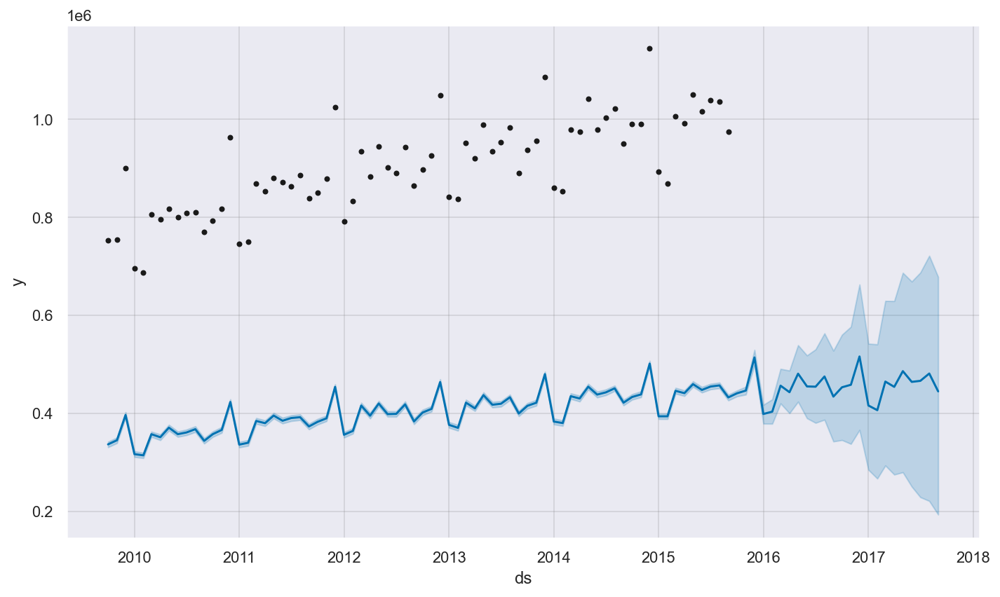

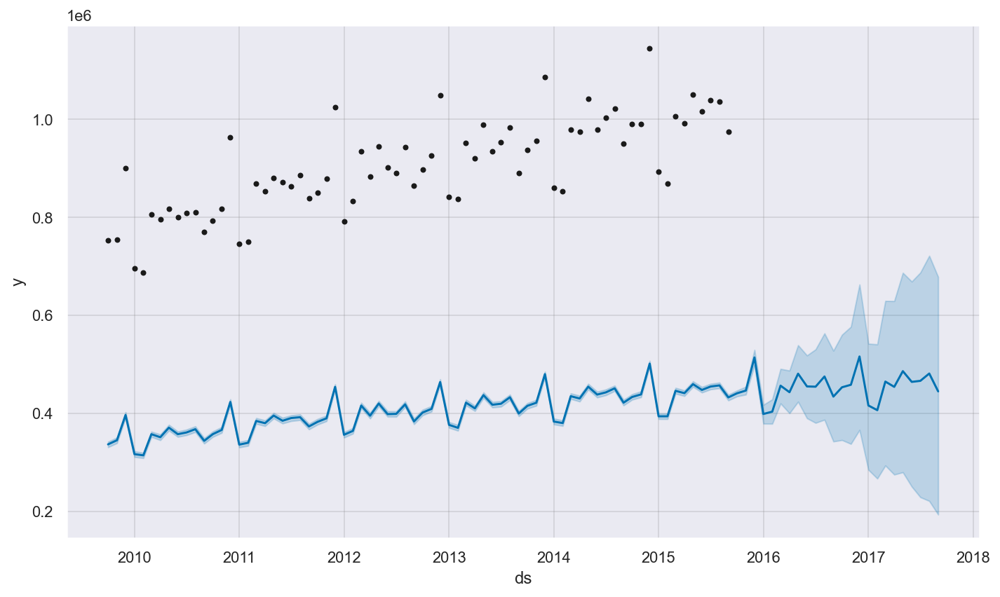

In [226]:
prophet_model5.plot(forecast5)

### Saving the best model  <a class="anchor" id="saving_model"></a>

In [227]:
with open('prophet_base_model.pkl', 'wb') as f:
    pickle.dump(prophet_model3, f)
    #model = pickle.dumps(prophet_model3)
    #f.write(model)